Notebook that represents the technical implementation of the bachelor thesis: 'Implementation and evaluation of a neural network for the recognition of handwritten melodies' by Nils Wenzlitschke

# Import + Daten

In [ ]:
from tensorflow.keras.layers import Conv2D, MaxPool2D, UpSampling2D, Dropout
import tensorflow as tf
import tensorflow.keras.models as models
import tensorflow.keras.layers as layers
from tensorflow import keras
from keras.optimizers import Adam,SGD
from keras.preprocessing.image import ImageDataGenerator 
from os import listdir
from cv2 import imread, imshow, waitKey, resize, cvtColor
from keras.layers import Input, Dense, Activation
from keras import backend as K
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Input, Dense, Activation
from keras.layers import Reshape, Lambda, BatchNormalization
from keras.layers.merge import add, concatenate
from keras.models import Model
from keras.layers.recurrent import LSTM
from keras.models import load_model
from tqdm import tqdm
import os
import cv2
import json
import tensorflow as tf
import numpy as np
import itertools
import psutil
import shutil
import re


import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import glob
import pandas as pd
import xml.etree.ElementTree as ET
import numpy as np
import os.path
from sklearn.utils import shuffle

from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
import zipfile
!unzip /content/drive/MyDrive/corpus_imgs_distorded.zip

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.
  inflating: corpus_imgs_distorded/150205326-1_1_1_distorted.jpg  
  inflating: corpus_imgs_distorded/225000290-1_1_1_distorted.jpg  
  inflating: corpus_imgs_distorded/211006955-1_1_1_distorted.jpg  
  inflating: corpus_imgs_distorded/211006834-1_13_1_distorted.jpg  
  inflating: corpus_imgs_distorded/000118303-1_1_1_distorted.jpg  
  inflating: corpus_imgs_distorded/190100527-1_1_2_distorted.jpg  
  inflating: corpus_imgs_distorded/220018576-1_1_2_distorted.jpg  
  inflating: corpus_imgs_distorded/201004726-1_1_1_distorted.jpg  
  inflating: corpus_imgs_distorded/110001207-1_1_1_distorted.jpg  
  inflating: corpus_imgs_distorded/000104141-1_2_1_distorted.jpg  
  inflating: corpus_imgs_distorded/000108552-1_1_1_distorted.jpg  
  inflating: corpus_imgs_distorded/000114189-1_1_1_distorted.jpg  
  inflating: corpus_imgs_distorded/230000619-1_1_1_distorted.jpg  
  inflating: corpus_imgs_distorded/220034340-1_3_2_distorted.

In [ ]:
# Theorie Reading List

tf.__version__

'2.4.1'

In [ ]:
keras.__version__

'2.4.0'

In [ ]:
# # Preprocessing
# 1. Lade Input-Bilder(X_Train)
# 2. Über Trainingskoordinaten Y_Train erstellen
#   2.1 XML zu X_Train Image laden
#   2.2 Koordinaten aus XML lesen
#   2.3 Mit Koordinanten BoundingBoxen malen(0,1) (auf weißes Bild oder einfach BoxKoordianten auf 1 setzen siehe https://github.com/calvozaragoza/OMR-Liedblatter/blob/64e04a6062437903fb13900d25f871f4f8f70429/util_LA.py#L122)
# 3. Beide Trainingsbilder resizen
# 4. DataAugementation über Rotation + Shifts
# 5. X_Train und Y_Train resizen (512x512)
# 6. Trainiere das Netz



# SAE Training


## 1. Lade Input-Bilder (X_Train)

In [ ]:
# staff/A23.jpg
# staff/A23.xml

# staff/images/00001.jpg
# staff/annots/00001.xml

In [33]:
def xml_to_pandas_dataframe(dataset_dir):
    """Iterates through all .xml files (generated by labelImg) in a given directory and combines
    them in a single Pandas dataframe.

    Parameters:
    ----------
    path : str
        The path containing the .xml files
    Returns
    -------
    Pandas DataFrame
        The produced dataframe
    """
    
    dir = dataset_dir + '/annots/'

    xml_list = []
    for xml_file in glob.glob(dir + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height',
                   'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df


def pandas_dataframe_to_dictionary(df):
    dictionary = {}

    for _, df_row in df.iterrows():
    
        filename = df_row['filename']
        width = df_row['width']
        height = df_row['height']
        label_region = df_row['class']
        xmin = df_row['xmin']
        ymin = df_row['ymin']
        xmax = df_row['xmax']
        ymax = df_row['ymax']

        data_region = {
            'class':label_region,
            'xmin':xmin,
            'ymin':ymin,
            'xmax':xmax,
            'ymax':ymax
        }
        if filename in dictionary:
            dictionary[filename]['regions'].append(data_region)
        else:
            data_page = {
                'width':width,
                'height':height,
                'regions':[data_region]
            }
            dictionary[filename] = data_page

    return dictionary


def create_data_dict(path):
    xml_input = xml_to_pandas_dataframe(path)
    regions_dict = pandas_dataframe_to_dictionary(xml_input)
    return regions_dict

## 2. Über Trainingskoordinaten Y_Train erstellen

In [34]:
def extract_boxes(self, filename):
        # load and parse the file
        tree = ElementTree.parse(filename)
        # get the root of the document
        root = tree.getroot()
        # extract each bounding box
        boxes = list()
        for box in root.findall('.//bndbox'):
            xmin = int(box.find('xmin').text)
            ymin = int(box.find('ymin').text)
            xmax = int(box.find('xmax').text)
            ymax = int(box.find('ymax').text)
            coors = [xmin, ymin, xmax, ymax]
            boxes.append(coors)
        # extract image dimensions
        width = int(root.find('.//size/width').text)
        height = int(root.find('.//size/height').text)
        return boxes, width, height


### 2.1 Koordinaten aus XML lesen

In [35]:
def create_ground_truth(document):
    
    image_height = document['height']
    image_width = document['width']
    image_ground_truth = np.zeros((image_height, image_width), dtype="uint8")

    for region in document['regions']:
      xmax = region['xmax']
      ymax = region['ymax']
      xmin = region['xmin']
      ymin = region['ymin']

      image_ground_truth[ymin:ymax, xmin:xmax] = 1

    return image_ground_truth

## 3. Bilder resizen und preprocessen

In [36]:
def redimImage(img, height, width, interpolation = cv2.INTER_LINEAR):
    
    img2 = img.copy()
    return cv2.resize(img2,(width,height), interpolation=interpolation)


def draw_ground_truth(input_dict, filename):
  
    gt_img = create_ground_truth(input_dict[f'{filename}.jpg'])
    plt.imshow(gt_img, interpolation='nearest', cmap='gray')
    plt.show()

def draw(image):
    plt.imshow(image, interpolation='nearest', cmap='gray')
    plt.show()


def load_image(path_file, channel):
    assert (type(path_file) is str)

    type_reading = cv2.IMREAD_COLOR
    if (channel == 1):
        type_reading = cv2.IMREAD_GRAYSCALE

    return cv2.convertScaleAbs(cv2.imread(path_file, type_reading))


def preprocess_training_data(dataset_dir, dict, channel):
  
    X = []
    Y = []

    images_dir = dataset_dir + '/images/'
    annotations_dir = dataset_dir + '/annots/'

    for keyname, region in tqdm(dict.items()):

        filename = f'{images_dir}{keyname}'
        print(filename)
        original = load_image(filename, channel)

        ground_truth = create_ground_truth(region)
        ground_truth = np.uint8(ground_truth > 0)

        assert(np.min(ground_truth) >= 0 and np.max(ground_truth) <=1)
      
        original = redimImage(original, 512, 512)
        ground_truth = redimImage(ground_truth, 512, 512)

        X_doc = [original]
        Y_doc = [ground_truth]

        assert(len(X_doc) == len(Y_doc))

        for idx in range(len(X_doc)):
            X.append(X_doc[idx])
            Y.append(Y_doc[idx])

    X = np.asarray(X).reshape(len(X), 512, 512, channel)
    Y = np.asarray(Y).reshape(len(Y), 512, 512, 1)

    return [X, Y]
  


def compare_specific_image(img, X_train, Y_train):
    print(f'Image shape X_train: {X_train[img].shape}\nImage shape Y_train: {Y_train[img].shape}')
    draw(X_train[img])
    if len(Y_train.shape) == 4:
       Y_train = np.asarray(Y_train).reshape(Y_train.shape[0], 512, 512)
    print(f'Image shape X_train: {X_train[img].shape}\nImage shape Y_train: {Y_train[img].shape}')
    draw(Y_train[img])

In [ ]:
# Größerer Traingssatz
path = '/content/drive/My Drive/Bachelorarbeit/staff'
original_dict = create_data_dict(path)
channel = 1
x, y = preprocess_training_data(path, original_dict, channel)

  0%|          | 0/328 [00:00<?, ?it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00001.jpg


  0%|          | 1/328 [00:01<08:51,  1.63s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00002.jpg


  1%|          | 2/328 [00:03<08:43,  1.61s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00003.jpg


  1%|          | 3/328 [00:04<08:42,  1.61s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00004.jpg


  1%|          | 4/328 [00:06<08:27,  1.57s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00005.jpg


  2%|▏         | 5/328 [00:07<08:09,  1.51s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00006.jpg


  2%|▏         | 6/328 [00:09<08:11,  1.53s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00007.jpg


  2%|▏         | 7/328 [00:10<07:49,  1.46s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00008.jpg


  2%|▏         | 8/328 [00:11<07:36,  1.43s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00009.jpg


  3%|▎         | 9/328 [00:13<07:44,  1.46s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00010.jpg


  3%|▎         | 10/328 [00:14<07:32,  1.42s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00015.jpg


  3%|▎         | 11/328 [00:16<07:16,  1.38s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00016.jpg


  4%|▎         | 12/328 [00:17<07:31,  1.43s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00017.jpg


  4%|▍         | 13/328 [00:19<07:33,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00018.jpg


  4%|▍         | 14/328 [00:20<06:58,  1.33s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00019.jpg


  5%|▍         | 15/328 [00:21<07:23,  1.42s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00020.jpg


  5%|▍         | 16/328 [00:23<07:57,  1.53s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00021.jpg


  5%|▌         | 17/328 [00:25<07:57,  1.54s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00024.jpg


  5%|▌         | 18/328 [00:26<07:42,  1.49s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00025.jpg


  6%|▌         | 19/328 [00:27<07:40,  1.49s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00026.jpg


  6%|▌         | 20/328 [00:29<07:26,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00027.jpg


  6%|▋         | 21/328 [00:30<07:22,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00028.jpg


  7%|▋         | 22/328 [00:32<07:39,  1.50s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00029.jpg


  7%|▋         | 23/328 [00:33<07:31,  1.48s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00030.jpg


  7%|▋         | 24/328 [00:35<07:30,  1.48s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00035.jpg


  8%|▊         | 25/328 [00:37<07:53,  1.56s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00036.jpg


  8%|▊         | 26/328 [00:39<09:15,  1.84s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00037.jpg


  8%|▊         | 27/328 [00:41<08:46,  1.75s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00038.jpg


  9%|▊         | 28/328 [00:42<07:54,  1.58s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00039.jpg


  9%|▉         | 29/328 [00:43<07:38,  1.53s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00040.jpg


  9%|▉         | 30/328 [00:45<07:22,  1.49s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00041.jpg


  9%|▉         | 31/328 [00:46<07:15,  1.47s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00042.jpg


 10%|▉         | 32/328 [00:48<07:51,  1.59s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00043.jpg


 10%|█         | 33/328 [00:49<07:51,  1.60s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00044.jpg


 10%|█         | 34/328 [00:51<07:09,  1.46s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00049.jpg


 11%|█         | 35/328 [00:52<06:34,  1.35s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00050.jpg


 11%|█         | 36/328 [00:53<06:44,  1.39s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00051.jpg


 11%|█▏        | 37/328 [00:55<06:45,  1.39s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00052.jpg


 12%|█▏        | 38/328 [00:56<06:45,  1.40s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00063.jpg


 12%|█▏        | 39/328 [00:57<06:49,  1.42s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00064.jpg


 12%|█▏        | 40/328 [00:59<06:32,  1.36s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00065.jpg


 12%|█▎        | 41/328 [01:00<06:24,  1.34s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00066.jpg


 13%|█▎        | 42/328 [01:02<06:55,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00074.jpg


 13%|█▎        | 43/328 [01:04<07:30,  1.58s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00075.jpg


 13%|█▎        | 44/328 [01:05<07:08,  1.51s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00083.jpg


 14%|█▎        | 45/328 [01:07<07:29,  1.59s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00084.jpg


 14%|█▍        | 46/328 [01:08<07:19,  1.56s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00085.jpg


 14%|█▍        | 47/328 [01:10<07:21,  1.57s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00086.jpg


 15%|█▍        | 48/328 [01:11<06:49,  1.46s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00103.jpg


 15%|█▍        | 49/328 [01:13<07:04,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00107.jpg


 15%|█▌        | 50/328 [01:14<07:00,  1.51s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00108.jpg


 16%|█▌        | 51/328 [01:15<06:32,  1.42s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00109.jpg


 16%|█▌        | 52/328 [01:17<06:24,  1.39s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00110.jpg


 16%|█▌        | 53/328 [01:18<06:39,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00119.jpg


 16%|█▋        | 54/328 [01:20<06:24,  1.40s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00120.jpg


 17%|█▋        | 55/328 [01:21<06:41,  1.47s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00129.jpg


 17%|█▋        | 56/328 [01:23<06:30,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00130.jpg


 17%|█▋        | 57/328 [01:24<06:53,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00131.jpg


 18%|█▊        | 58/328 [01:26<06:34,  1.46s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00132.jpg


 18%|█▊        | 59/328 [01:27<06:14,  1.39s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00143.jpg


 18%|█▊        | 60/328 [01:28<06:09,  1.38s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00144.jpg


 19%|█▊        | 61/328 [01:30<06:25,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00145.jpg


 19%|█▉        | 62/328 [01:32<06:58,  1.57s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00146.jpg


 19%|█▉        | 63/328 [01:33<06:35,  1.49s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00151.jpg


 20%|█▉        | 64/328 [01:34<06:37,  1.51s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00152.jpg


 20%|█▉        | 65/328 [01:36<06:19,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00153.jpg


 20%|██        | 66/328 [01:37<06:03,  1.39s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00154.jpg


 20%|██        | 67/328 [01:38<06:06,  1.40s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00155.jpg


 21%|██        | 68/328 [01:40<05:47,  1.33s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00156.jpg


 21%|██        | 69/328 [01:41<06:10,  1.43s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00157.jpg


 21%|██▏       | 70/328 [01:42<05:48,  1.35s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00158.jpg


 22%|██▏       | 71/328 [01:44<06:27,  1.51s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00159.jpg


 22%|██▏       | 72/328 [01:46<06:39,  1.56s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00160.jpg


 22%|██▏       | 73/328 [01:47<06:09,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00163.jpg


 23%|██▎       | 74/328 [01:49<06:28,  1.53s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00165.jpg


 23%|██▎       | 75/328 [01:50<06:05,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00166.jpg


 23%|██▎       | 76/328 [01:52<06:27,  1.54s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00167.jpg


 23%|██▎       | 77/328 [01:53<06:22,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00168.jpg


 24%|██▍       | 78/328 [01:55<06:25,  1.54s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00169.jpg


 24%|██▍       | 79/328 [01:56<06:14,  1.50s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00170.jpg


 24%|██▍       | 80/328 [01:58<06:09,  1.49s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00171.jpg


 25%|██▍       | 81/328 [01:59<06:08,  1.49s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00172.jpg


 25%|██▌       | 82/328 [02:01<05:51,  1.43s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00175.jpg


 25%|██▌       | 83/328 [02:02<05:50,  1.43s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00176.jpg


 26%|██▌       | 84/328 [02:03<05:46,  1.42s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00177.jpg


 26%|██▌       | 85/328 [02:05<05:41,  1.41s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00178.jpg


 26%|██▌       | 86/328 [02:06<05:29,  1.36s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00179.jpg


 27%|██▋       | 87/328 [02:07<05:18,  1.32s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00180.jpg


 27%|██▋       | 88/328 [02:09<05:24,  1.35s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00181.jpg


 27%|██▋       | 89/328 [02:10<05:35,  1.40s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00182.jpg


 27%|██▋       | 90/328 [02:12<05:23,  1.36s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00187.jpg


 28%|██▊       | 91/328 [02:13<05:35,  1.42s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00188.jpg


 28%|██▊       | 92/328 [02:14<05:22,  1.37s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00189.jpg


 28%|██▊       | 93/328 [02:16<05:39,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00190.jpg


 29%|██▊       | 94/328 [02:17<05:36,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00191.jpg


 29%|██▉       | 95/328 [02:19<06:05,  1.57s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00193.jpg


 29%|██▉       | 96/328 [02:21<05:47,  1.50s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00194.jpg


 30%|██▉       | 97/328 [02:22<06:12,  1.61s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00195.jpg


 30%|██▉       | 98/328 [02:24<06:18,  1.65s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00196.jpg


 30%|███       | 99/328 [02:26<06:08,  1.61s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00197.jpg


 30%|███       | 100/328 [02:27<05:54,  1.56s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00198.jpg


 31%|███       | 101/328 [02:29<06:03,  1.60s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00199.jpg


 31%|███       | 102/328 [02:30<05:54,  1.57s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00200.jpg


 31%|███▏      | 103/328 [02:32<05:41,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00201.jpg


 32%|███▏      | 104/328 [02:33<05:41,  1.53s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00202.jpg


 32%|███▏      | 105/328 [02:35<05:34,  1.50s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00203.jpg


 32%|███▏      | 106/328 [02:36<05:18,  1.43s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00204.jpg


 33%|███▎      | 107/328 [02:37<05:18,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00205.jpg


 33%|███▎      | 108/328 [02:39<05:18,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00206.jpg


 33%|███▎      | 109/328 [02:40<05:07,  1.41s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00211.jpg


 34%|███▎      | 110/328 [02:42<05:33,  1.53s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00212.jpg


 34%|███▍      | 111/328 [02:43<05:12,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00213.jpg


 34%|███▍      | 112/328 [02:45<04:57,  1.38s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00214.jpg


 34%|███▍      | 113/328 [02:46<05:10,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00215.jpg


 35%|███▍      | 114/328 [02:48<05:56,  1.66s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00216.jpg


 35%|███▌      | 115/328 [02:50<05:55,  1.67s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00217.jpg


 35%|███▌      | 116/328 [02:51<05:28,  1.55s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00218.jpg


 36%|███▌      | 117/328 [02:53<05:23,  1.54s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00221.jpg


 36%|███▌      | 118/328 [02:54<05:11,  1.48s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00222.jpg


 36%|███▋      | 119/328 [02:55<04:49,  1.39s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00223.jpg


 37%|███▋      | 120/328 [02:57<04:44,  1.37s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00224.jpg


 37%|███▋      | 121/328 [02:58<04:48,  1.39s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00225.jpg


 37%|███▋      | 122/328 [03:00<04:58,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00226.jpg


 38%|███▊      | 123/328 [03:01<05:13,  1.53s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00227.jpg


 38%|███▊      | 124/328 [03:03<04:56,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00228.jpg


 38%|███▊      | 125/328 [03:04<04:54,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00233.jpg


 38%|███▊      | 126/328 [03:05<04:49,  1.43s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00234.jpg


 39%|███▊      | 127/328 [03:07<05:02,  1.50s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00235.jpg


 39%|███▉      | 128/328 [03:08<04:40,  1.40s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00236.jpg


 39%|███▉      | 129/328 [03:10<04:47,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00237.jpg


 40%|███▉      | 130/328 [03:11<04:45,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00238.jpg


 40%|███▉      | 131/328 [03:13<05:12,  1.59s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00239.jpg


 40%|████      | 132/328 [03:15<05:15,  1.61s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00240.jpg


 41%|████      | 133/328 [03:16<05:11,  1.60s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00241.jpg


 41%|████      | 134/328 [03:18<05:00,  1.55s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00242.jpg


 41%|████      | 135/328 [03:19<04:53,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00247.jpg


 41%|████▏     | 136/328 [03:21<04:51,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00248.jpg


 42%|████▏     | 137/328 [03:22<04:34,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00249.jpg


 42%|████▏     | 138/328 [03:23<04:16,  1.35s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00250.jpg


 42%|████▏     | 139/328 [03:25<04:29,  1.43s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00261.jpg


 43%|████▎     | 140/328 [03:27<04:55,  1.57s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00262.jpg


 43%|████▎     | 141/328 [03:28<04:58,  1.60s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00263.jpg


 43%|████▎     | 142/328 [03:30<04:42,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00264.jpg


 44%|████▎     | 143/328 [03:31<04:41,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00273.jpg


 44%|████▍     | 144/328 [03:33<04:39,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00274.jpg


 44%|████▍     | 145/328 [03:34<04:30,  1.48s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00283.jpg


 45%|████▍     | 146/328 [03:35<04:12,  1.39s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00284.jpg


 45%|████▍     | 147/328 [03:37<04:03,  1.34s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00285.jpg


 45%|████▌     | 148/328 [03:39<04:47,  1.59s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00286.jpg


 45%|████▌     | 149/328 [03:41<05:09,  1.73s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00307.jpg


 46%|████▌     | 150/328 [03:42<04:50,  1.63s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00308.jpg


 46%|████▌     | 151/328 [03:44<05:11,  1.76s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00309.jpg


 46%|████▋     | 152/328 [03:46<04:43,  1.61s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00310.jpg


 47%|████▋     | 153/328 [03:47<04:37,  1.59s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00318.jpg


 47%|████▋     | 154/328 [03:49<04:36,  1.59s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00319.jpg


 47%|████▋     | 155/328 [03:50<04:23,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00327.jpg


 48%|████▊     | 156/328 [03:52<04:49,  1.68s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00328.jpg


 48%|████▊     | 157/328 [03:54<04:38,  1.63s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00329.jpg


 48%|████▊     | 158/328 [03:55<04:17,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00330.jpg


 48%|████▊     | 159/328 [03:56<04:19,  1.54s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00341.jpg


 49%|████▉     | 160/328 [03:58<04:13,  1.51s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00342.jpg


 49%|████▉     | 161/328 [03:59<03:59,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00343.jpg


 49%|████▉     | 162/328 [04:00<03:51,  1.39s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00344.jpg


 50%|████▉     | 163/328 [04:03<04:37,  1.68s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00349.jpg


 50%|█████     | 164/328 [04:05<04:48,  1.76s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00350.jpg


 50%|█████     | 165/328 [04:06<04:42,  1.73s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00351.jpg


 51%|█████     | 166/328 [04:08<04:33,  1.69s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00352.jpg


 51%|█████     | 167/328 [04:10<04:28,  1.67s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00353.jpg


 51%|█████     | 168/328 [04:11<04:14,  1.59s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00354.jpg


 52%|█████▏    | 169/328 [04:12<03:59,  1.51s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00355.jpg


 52%|█████▏    | 170/328 [04:14<03:52,  1.47s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00356.jpg


 52%|█████▏    | 171/328 [04:15<03:32,  1.35s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00357.jpg


 52%|█████▏    | 172/328 [04:17<04:26,  1.71s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00358.jpg


 53%|█████▎    | 173/328 [04:19<04:13,  1.64s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00363.jpg


 53%|█████▎    | 174/328 [04:20<03:54,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00364.jpg


 53%|█████▎    | 175/328 [04:22<04:02,  1.58s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00365.jpg


 54%|█████▎    | 176/328 [04:23<03:45,  1.48s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00366.jpg


 54%|█████▍    | 177/328 [04:24<03:30,  1.39s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00367.jpg


 54%|█████▍    | 178/328 [04:26<03:32,  1.41s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00368.jpg


 55%|█████▍    | 179/328 [04:28<04:14,  1.71s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00369.jpg


 55%|█████▍    | 180/328 [04:29<03:57,  1.61s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00372.jpg


 55%|█████▌    | 181/328 [04:31<03:48,  1.55s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00374.jpg


 55%|█████▌    | 182/328 [04:32<03:41,  1.51s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00375.jpg


 56%|█████▌    | 183/328 [04:34<03:38,  1.51s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00376.jpg


 56%|█████▌    | 184/328 [04:35<03:30,  1.46s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00377.jpg


 56%|█████▋    | 185/328 [04:36<03:22,  1.41s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00378.jpg


 57%|█████▋    | 186/328 [04:38<03:17,  1.39s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00383.jpg


 57%|█████▋    | 187/328 [04:40<03:53,  1.65s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00384.jpg


 57%|█████▋    | 188/328 [04:41<03:42,  1.59s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00385.jpg


 58%|█████▊    | 189/328 [04:43<03:42,  1.60s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00386.jpg


 58%|█████▊    | 190/328 [04:45<03:45,  1.64s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00387.jpg


 58%|█████▊    | 191/328 [04:46<03:38,  1.60s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00388.jpg


 59%|█████▊    | 192/328 [04:48<03:30,  1.55s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00389.jpg


 59%|█████▉    | 193/328 [04:49<03:11,  1.42s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00390.jpg


 59%|█████▉    | 194/328 [04:50<03:10,  1.42s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00391.jpg


 59%|█████▉    | 195/328 [04:53<03:48,  1.72s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00392.jpg


 60%|█████▉    | 196/328 [04:54<03:32,  1.61s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00403.jpg


 60%|██████    | 197/328 [04:55<03:11,  1.46s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00404.jpg


 60%|██████    | 198/328 [04:56<02:58,  1.38s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00405.jpg


 61%|██████    | 199/328 [04:58<03:06,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00406.jpg


 61%|██████    | 200/328 [04:59<03:01,  1.42s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00415.jpg


 61%|██████▏   | 201/328 [05:01<03:10,  1.50s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00416.jpg


 62%|██████▏   | 202/328 [05:02<02:55,  1.39s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00417.jpg


 62%|██████▏   | 203/328 [05:03<02:41,  1.29s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00418.jpg


 62%|██████▏   | 204/328 [05:06<03:20,  1.62s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00435.jpg


 62%|██████▎   | 205/328 [05:07<03:16,  1.59s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00436.jpg


 63%|██████▎   | 206/328 [05:09<03:13,  1.58s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00437.jpg


 63%|██████▎   | 207/328 [05:11<03:20,  1.66s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00438.jpg


 63%|██████▎   | 208/328 [05:12<03:01,  1.51s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00443.jpg


 64%|██████▎   | 209/328 [05:13<02:56,  1.48s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00444.jpg


 64%|██████▍   | 210/328 [05:15<02:59,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00445.jpg


 64%|██████▍   | 211/328 [05:16<02:54,  1.49s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00446.jpg


 65%|██████▍   | 212/328 [05:18<03:21,  1.74s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00447.jpg


 65%|██████▍   | 213/328 [05:20<03:11,  1.67s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00448.jpg


 65%|██████▌   | 214/328 [05:21<03:01,  1.59s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00449.jpg


 66%|██████▌   | 215/328 [05:23<02:48,  1.49s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00450.jpg


 66%|██████▌   | 216/328 [05:24<02:40,  1.43s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00451.jpg


 66%|██████▌   | 217/328 [05:25<02:40,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00452.jpg


 66%|██████▋   | 218/328 [05:27<02:35,  1.42s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00453.jpg


 67%|██████▋   | 219/328 [05:28<02:33,  1.41s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00454.jpg


 67%|██████▋   | 220/328 [05:31<03:04,  1.71s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00455.jpg


 67%|██████▋   | 221/328 [05:32<02:59,  1.68s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00456.jpg


 68%|██████▊   | 222/328 [05:34<02:47,  1.58s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00457.jpg


 68%|██████▊   | 223/328 [05:35<02:37,  1.50s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00458.jpg


 68%|██████▊   | 224/328 [05:36<02:38,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00463.jpg


 69%|██████▊   | 225/328 [05:38<02:35,  1.51s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00464.jpg


 69%|██████▉   | 226/328 [05:39<02:32,  1.49s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00465.jpg


 69%|██████▉   | 227/328 [05:41<02:24,  1.43s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00466.jpg


 70%|██████▉   | 228/328 [05:43<02:57,  1.78s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00467.jpg


 70%|██████▉   | 229/328 [05:45<02:58,  1.80s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00468.jpg


 70%|███████   | 230/328 [05:46<02:39,  1.63s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00469.jpg


 70%|███████   | 231/328 [05:48<02:26,  1.51s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00470.jpg


 71%|███████   | 232/328 [05:50<02:55,  1.83s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00475.jpg


 71%|███████   | 233/328 [05:51<02:38,  1.66s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00476.jpg


 71%|███████▏  | 234/328 [05:53<02:30,  1.60s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00477.jpg


 72%|███████▏  | 235/328 [05:54<02:26,  1.57s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00478.jpg


 72%|███████▏  | 236/328 [05:57<02:51,  1.86s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00479.jpg


 72%|███████▏  | 237/328 [05:58<02:41,  1.77s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00480.jpg


 73%|███████▎  | 238/328 [06:00<02:27,  1.64s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00481.jpg


 73%|███████▎  | 239/328 [06:01<02:13,  1.50s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00482.jpg


 73%|███████▎  | 240/328 [06:02<02:07,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00483.jpg


 73%|███████▎  | 241/328 [06:04<02:07,  1.46s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00484.jpg


 74%|███████▍  | 242/328 [06:05<02:09,  1.50s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00485.jpg


 74%|███████▍  | 243/328 [06:07<02:02,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00486.jpg


 74%|███████▍  | 244/328 [06:09<02:13,  1.59s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00487.jpg


 75%|███████▍  | 245/328 [06:10<02:11,  1.58s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00488.jpg


 75%|███████▌  | 246/328 [06:12<02:11,  1.61s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00489.jpg


 75%|███████▌  | 247/328 [06:13<02:08,  1.58s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00490.jpg


 76%|███████▌  | 248/328 [06:15<02:08,  1.60s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00491.jpg


 76%|███████▌  | 249/328 [06:16<02:02,  1.54s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00492.jpg


 76%|███████▌  | 250/328 [06:18<02:06,  1.62s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00493.jpg


 77%|███████▋  | 251/328 [06:19<01:55,  1.50s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00494.jpg


 77%|███████▋  | 252/328 [06:21<01:55,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00499.jpg


 77%|███████▋  | 253/328 [06:23<01:53,  1.51s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00500.jpg


 77%|███████▋  | 254/328 [06:24<01:51,  1.51s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00501.jpg


 78%|███████▊  | 255/328 [06:26<01:52,  1.54s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00502.jpg


 78%|███████▊  | 256/328 [06:27<01:46,  1.48s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00503.jpg


 78%|███████▊  | 257/328 [06:29<01:47,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00504.jpg


 79%|███████▊  | 258/328 [06:30<01:45,  1.51s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00505.jpg


 79%|███████▉  | 259/328 [06:32<01:47,  1.56s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00510.jpg


 79%|███████▉  | 260/328 [06:33<01:41,  1.49s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00511.jpg


 80%|███████▉  | 261/328 [06:34<01:35,  1.43s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00512.jpg


 80%|███████▉  | 262/328 [06:35<01:26,  1.31s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00513.jpg


 80%|████████  | 263/328 [06:37<01:29,  1.38s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00514.jpg


 80%|████████  | 264/328 [06:38<01:30,  1.41s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00515.jpg


 81%|████████  | 265/328 [06:40<01:27,  1.40s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00516.jpg


 81%|████████  | 266/328 [06:41<01:26,  1.39s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00517.jpg


 81%|████████▏ | 267/328 [06:43<01:30,  1.48s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00518.jpg


 82%|████████▏ | 268/328 [06:44<01:27,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00519.jpg


 82%|████████▏ | 269/328 [06:45<01:21,  1.38s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00520.jpg


 82%|████████▏ | 270/328 [06:47<01:23,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00521.jpg


 83%|████████▎ | 271/328 [06:48<01:19,  1.39s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00522.jpg


 83%|████████▎ | 272/328 [06:49<01:13,  1.31s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00523.jpg


 83%|████████▎ | 273/328 [06:51<01:13,  1.34s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00528.jpg


 84%|████████▎ | 274/328 [06:52<01:07,  1.25s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00529.jpg


 84%|████████▍ | 275/328 [06:53<01:04,  1.21s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00530.jpg


 84%|████████▍ | 276/328 [06:55<01:08,  1.33s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00531.jpg


 84%|████████▍ | 277/328 [06:56<01:05,  1.29s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00547.jpg


 85%|████████▍ | 278/328 [06:57<01:05,  1.31s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00548.jpg


 85%|████████▌ | 279/328 [06:59<01:04,  1.33s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00549.jpg


 85%|████████▌ | 280/328 [07:00<01:07,  1.40s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00550.jpg


 86%|████████▌ | 281/328 [07:02<01:12,  1.55s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00558.jpg


 86%|████████▌ | 282/328 [07:03<01:08,  1.48s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00559.jpg


 86%|████████▋ | 283/328 [07:05<01:05,  1.46s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00560.jpg


 87%|████████▋ | 284/328 [07:06<01:03,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00561.jpg


 87%|████████▋ | 285/328 [07:08<01:02,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00582.jpg


 87%|████████▋ | 286/328 [07:09<01:00,  1.44s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00583.jpg


 88%|████████▊ | 287/328 [07:11<01:03,  1.54s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00584.jpg


 88%|████████▊ | 288/328 [07:12<00:59,  1.50s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00585.jpg


 88%|████████▊ | 289/328 [07:14<00:58,  1.49s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00593.jpg


 88%|████████▊ | 290/328 [07:15<00:56,  1.48s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00594.jpg


 89%|████████▊ | 291/328 [07:17<00:54,  1.47s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00595.jpg


 89%|████████▉ | 292/328 [07:18<00:53,  1.48s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00596.jpg


 89%|████████▉ | 293/328 [07:20<00:51,  1.48s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00612.jpg


 90%|████████▉ | 294/328 [07:22<00:59,  1.75s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00613.jpg


 90%|████████▉ | 295/328 [07:23<00:54,  1.64s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00614.jpg


 90%|█████████ | 296/328 [07:25<00:53,  1.67s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00615.jpg


 91%|█████████ | 297/328 [07:26<00:49,  1.59s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00620.jpg


 91%|█████████ | 298/328 [07:28<00:45,  1.50s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00621.jpg


 91%|█████████ | 299/328 [07:29<00:43,  1.50s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00622.jpg


 91%|█████████▏| 300/328 [07:31<00:42,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00623.jpg


 92%|█████████▏| 301/328 [07:33<00:43,  1.61s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00624.jpg


 92%|█████████▏| 302/328 [07:35<00:46,  1.79s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00625.jpg


 92%|█████████▏| 303/328 [07:36<00:42,  1.68s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00626.jpg


 93%|█████████▎| 304/328 [07:38<00:41,  1.72s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00627.jpg


 93%|█████████▎| 305/328 [07:39<00:37,  1.61s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00628.jpg


 93%|█████████▎| 306/328 [07:41<00:35,  1.60s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00629.jpg


 94%|█████████▎| 307/328 [07:42<00:32,  1.54s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00630.jpg


 94%|█████████▍| 308/328 [07:44<00:32,  1.60s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00631.jpg


 94%|█████████▍| 309/328 [07:46<00:28,  1.52s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00633.jpg


 95%|█████████▍| 310/328 [07:47<00:26,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00634.jpg


 95%|█████████▍| 311/328 [07:48<00:24,  1.46s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00639.jpg


 95%|█████████▌| 312/328 [07:50<00:23,  1.45s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00640.jpg


 95%|█████████▌| 313/328 [07:51<00:20,  1.39s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00642.jpg


 96%|█████████▌| 314/328 [07:52<00:18,  1.33s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00643.jpg


 96%|█████████▌| 315/328 [07:54<00:17,  1.38s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00644.jpg


 96%|█████████▋| 316/328 [07:55<00:16,  1.41s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00645.jpg


 97%|█████████▋| 317/328 [07:56<00:14,  1.31s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00650.jpg


 97%|█████████▋| 318/328 [07:58<00:13,  1.32s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00651.jpg


 97%|█████████▋| 319/328 [07:59<00:13,  1.46s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00652.jpg


 98%|█████████▊| 320/328 [08:01<00:12,  1.54s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00653.jpg


 98%|█████████▊| 321/328 [08:02<00:09,  1.39s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00654.jpg


 98%|█████████▊| 322/328 [08:04<00:08,  1.48s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00655.jpg


 98%|█████████▊| 323/328 [08:05<00:07,  1.46s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00656.jpg


 99%|█████████▉| 324/328 [08:07<00:05,  1.46s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00657.jpg


 99%|█████████▉| 325/328 [08:08<00:04,  1.41s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00658.jpg


 99%|█████████▉| 326/328 [08:10<00:02,  1.47s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00659.jpg


100%|█████████▉| 327/328 [08:11<00:01,  1.43s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00660.jpg


100%|██████████| 328/328 [08:12<00:00,  1.50s/it]


## 4. DataAugementation über Rotation + Shifts (Optional)

In [ ]:
#Apply data augmentation
def applyDataAugmentation(
                    X, Y, 
                    rotation_range=8, 
                    shear_range=0, 
                    vertical_flip=False, 
                    horizontal_flip=True,
                    width_shift_range=0.1,
                    height_shift_range=0.1,
                    zoom_range=0.1,
                    fill_mode='nearest',
                    cval=0,
                    batch_size=32,
                    save_images=False, pathfile_saved_images=None,
                    return_generator=False):
    data_gen_args = dict(
                    rotation_range=rotation_range,              #3   10,           # Int. Degree range for random rotations.
                    shear_range=shear_range,                    # Float. Shear Intensity (Shear angle in counter-clockwise direction in degrees)
                    vertical_flip=vertical_flip,                # Boolean. Randomly flip inputs vertically.
                    horizontal_flip=horizontal_flip,
                    width_shift_range=width_shift_range,        #0.08, 0.09
                    height_shift_range=height_shift_range,      #0.08,  0.09
                    zoom_range=zoom_range,                      #0.08, 0.09                # Float or [lower, upper]. Range for random zoom. If a float,
                    fill_mode=fill_mode,
                    cval=cval
                    #brightness_range=[0.2, 1.4]  # Tuple or list of two floats. Range for picking a brightness shift value from.
                    )

    data_gen_seg_args = dict(
                    rotation_range=rotation_range,              #3   10,           # Int. Degree range for random rotations.
                    shear_range=shear_range,                    # Float. Shear Intensity (Shear angle in counter-clockwise direction in degrees)
                    vertical_flip=vertical_flip,                # Boolean. Randomly flip inputs vertically.
                    horizontal_flip=horizontal_flip,
                    width_shift_range=width_shift_range,        #0.08, 0.09
                    height_shift_range=height_shift_range,      #0.08,  0.09
                    zoom_range=zoom_range,                      #0.08, 0.09                # Float or [lower, upper]. Range for random zoom. If a float,
                    fill_mode='constant',
                    cval=0
                    #brightness_range=[0.2, 1.4]  # Tuple or list of two floats. Range for picking a brightness shift value from.
                    )

    num_samples = len(X)
    image_datagen = ImageDataGenerator(**data_gen_args)
    seg_datagen = ImageDataGenerator(**data_gen_seg_args)

    save_params1 = dict()
    save_params2 = dict()
    if save_images:
        assert(pathfile_saved_images is not None)
        out_x = pathfile_saved_images + "_src"
        out_s = pathfile_saved_images + "_gt"
        save_params1 = dict(save_to_dir=out_x, save_prefix='IM_plant', save_format='png')
        save_params2 = dict(save_to_dir=out_s, save_prefix='seg', save_format='png')

    image_generator = image_datagen.flow(X, batch_size=batch_size, seed=1, **save_params1)
    seg_generator = seg_datagen.flow(Y, batch_size=batch_size, seed=1, **save_params2)

    def combine_generator(gen1, gen2):
        while True:
            yield(gen1.next(), gen2.next())

    if return_generator:
        return combine_generator(image_generator, seg_generator)
    else:
        X = []
        Y = []
        count = 0
        for X_new, Y_new in combine_generator(image_generator, seg_generator):

            X_new = X_new.astype(np.uint8)
            Y_new = Y_new.astype(np.uint8)
            if (count == 0):
                X = X_new
                Y = Y_new
            else:
                X = np.concatenate((X, X_new))
                Y = np.concatenate((Y, Y_new))
            
            count = count + len(Y_new) 
            if (count > num_samples):
                break

        return [X, Y]

Image shape X_train: (512, 512, 3)
Image shape Y_train: (512, 512, 1)


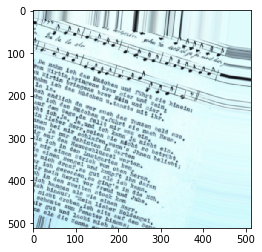

Image shape X_train: (512, 512, 3)
Image shape Y_train: (512, 512)


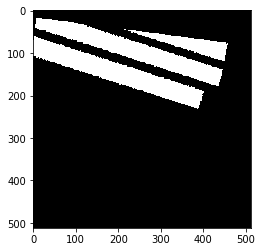

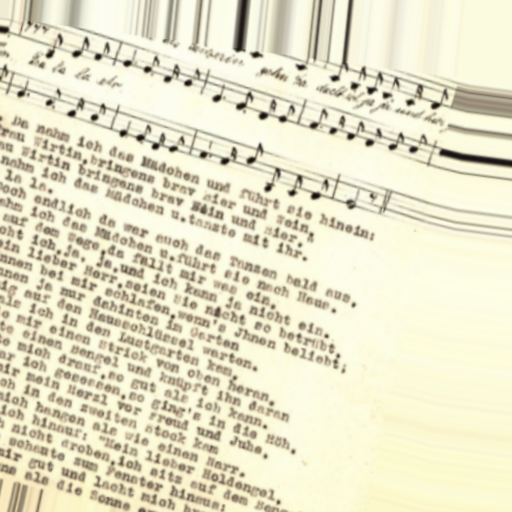

In [ ]:
img = 3
compare_specific_image(img, x_augmented, y_augmented)
cv2_imshow(x_augmented[img])

In [ ]:
x_augmented, y_augmented = applyDataAugmentation(x, y)

## 5. Model trainieren

In [ ]:
model = models.Sequential()
model.add(Conv2D(128, (3,3), activation='relu', input_shape=((512,512,3))))
model.add(MaxPool2D(padding="same"))
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(MaxPool2D(padding="same"))
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(MaxPool2D(padding="same"))
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D())
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D())
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D())
model.add(Conv2D(1, (3,3), activation='sigmoid', padding='same'))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 510, 510, 128)     3584      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 255, 255, 128)     0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 255, 255, 128)     147584    
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 128, 128, 128)     0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 128, 128, 128)     147584    
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 64, 64, 128)       0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 64, 64, 128)       1

In [ ]:
# if augmentation where used
# split in train-val-test
x = x_augmented
y = y_augmented
x_train = x[int(len(x)*0.2):-int(len(x)*0.2)]
y_train = y[int(len(y)*0.2):-int(len(y)*0.2)]
x_val = x[:int(len(x)*0.2)]
y_val = y[:int(len(y)*0.2)]
x_test = x[int(len(x)*0.8):]
y_test = y[int(len(y)*0.8):]
print(len(x_train),len(y_train),len(x_val),len(y_val),len(x_test),len(y_test))

112 112 37 37 38 38


In [ ]:
# split in train-val-test
x_train = x[int(len(x)*0.2):-int(len(x)*0.2)]
y_train = y[int(len(y)*0.2):-int(len(y)*0.2)]
x_val = x[:int(len(x)*0.2)]
y_val = y[:int(len(y)*0.2)]
x_test = x[int(len(x)*0.8):]
y_test = y[int(len(y)*0.8):]
print(len(x_train),len(y_train),len(x_val),len(y_val),len(x_test),len(y_test))

198 198 65 65 66 66


In [ ]:
import tensorflow.keras
import datetime
from tensorflow.python.keras.utils import losses_utils




#dropout_rate = 0.1

# define the model
model = models.Sequential()
model.add(Conv2D(128, (3,3), activation='relu', input_shape=((512,512,1))))
model.add(MaxPool2D(padding="same"))
#model.add(Dropout(dropout_rate))
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(MaxPool2D(padding="same"))
#model.add(Dropout(dropout_rate))
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(MaxPool2D(padding="same"))
#model.add(Dropout(dropout_rate))
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D())
#model.add(Dropout(dropout_rate))
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D())
#model.add(Dropout(dropout_rate))
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D())
#model.add(Dropout(dropout_rate))
model.add(Conv2D(1, (3,3), activation='sigmoid', padding='same'))
model.summary()


#compile the model

#optimizer = SGD(lr=0.01, decay=1e-5, momentum=0.9, nesterov=True)
optimizer= Adam()
# loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True)
# loss = tfa.losses.GIoULoss()
loss = tf.keras.losses.BinaryCrossentropy(
    from_logits=False, label_smoothing=0,
    name='binary_crossentropy'
)

model.compile(
    loss=loss,
    optimizer=optimizer,
    metrics=['mse', 'accuracy',tf.keras.metrics.MeanIoU(2)]
    )



# fit the model
print("Fit model on training data")
history = model.fit(
    x_train, 
    y_train, 
    epochs=200, 
    batch_size=4, 
    validation_data=(x_val, y_val)
    )

model.save('SAE_Model')


# evaluate the model
print("Evaluate on test data")
results = model.evaluate(x_test, y_test, batch_size=4)
print("test loss, test acc:", results)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 510, 510, 128)     1280      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 255, 255, 128)     0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 255, 255, 128)     147584    
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 128, 128, 128)     0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 128, 128, 128)     147584    
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 64, 64, 128)       0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 64, 64, 128)      

In [ ]:
history.history

{'accuracy': [0.7593387365341187,
  0.7924826145172119,
  0.9016891717910767,
  0.9188673496246338,
  0.9389008283615112,
  0.9497583508491516,
  0.9581154584884644,
  0.9643709063529968,
  0.9663686156272888,
  0.9683668613433838,
  0.9694624543190002,
  0.969749391078949,
  0.9709722399711609,
  0.9711597561836243,
  0.9716647267341614,
  0.9719581007957458,
  0.9723529815673828,
  0.9725567698478699,
  0.9727156758308411,
  0.9731208086013794,
  0.9740028977394104,
  0.973940372467041,
  0.9739006757736206,
  0.9736832976341248,
  0.9744495153427124,
  0.9734788537025452,
  0.9737151265144348,
  0.9745575189590454,
  0.9748610854148865,
  0.9753826260566711,
  0.9754930734634399,
  0.9750210642814636,
  0.9754599332809448,
  0.9757210612297058,
  0.9764588475227356,
  0.9764747023582458,
  0.976560652256012,
  0.9771228432655334,
  0.9762067794799805,
  0.9770426750183105,
  0.976433277130127,
  0.9770409464836121,
  0.976265549659729,
  0.9759367108345032,
  0.9769933819770813,
  0

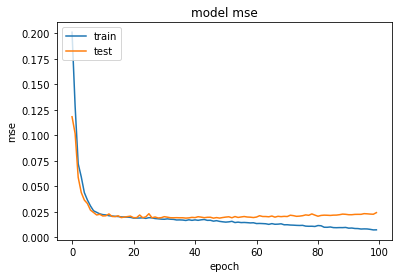

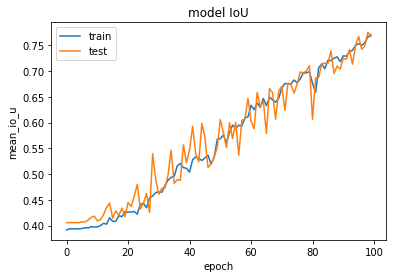

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['mse'])
plt.plot(history.history['val_mse'])
plt.title('model mse')
plt.ylabel('mse')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

plt.plot(history.history['mean_io_u'])
plt.plot(history.history['val_mean_io_u'])
plt.title('model IoU')
plt.ylabel('mean_io_u')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## 6. Evaluate the Model

In [ ]:
model = load_model('/content/drive/MyDrive/Bachelorarbeit/models/SAE_Model')

In [ ]:
print("Evaluate on test data")
results = model.evaluate(x_test, y_test, batch_size=1)
print("test loss, test mse, test acc, test iou:", results)

Evaluate on test data
66/66 [==============================] - 1s 21ms/step - loss: 0.3973 - mse: 0.0268 - accuracy: 0.9715 - mean_io_u_1: 0.8956
test loss, test mse, test acc, test iou: [0.39730632305145264, 0.02678009308874607, 0.9715139269828796, 0.8956375122070312]


In [ ]:
Evaluate on test data
198/198 [==============================] - 11s 20ms/step - loss: 0.0024 - mse: 6.5895e-04 - accuracy: 0.9991 - mean_io_u_1: 0.9241
test loss, test mse, test acc, test iou: [0.0023970790207386017, 0.0006589471595361829, 0.999140739440918, 0.9241027235984802]

In [ ]:
def load_single_image(path_file):
    X = []
    img = load_image(path_file, 1)
    original = redimImage(img, 512, 512)
    X_doc = [original]
    X.append(X_doc)
    X = np.asarray(X).reshape(len(X), 512, 512, 3)

    return [X]
def predict_single_image(image_path, trained_model):
    img = load_single_image(image_path)[0]
    predict = trained_model.predict(img)
    predict = np.asarray(predict).reshape(1, 512, 512)

    draw(predict[0])
    draw(img[0])

In [ ]:
def get_groundtruth_bounding_boxes(img_name, groundtruth_dictionary):

    list_bbox = []


    for region in groundtruth_dictionary[img_name]['regions']:
        xmin = region["xmin"]
        ymin = region["ymin"]

        xmax = region["xmax"]
        ymax = region["ymax"]

        list_bbox.append((ymin,xmin,ymax,xmax))

    print(f'Groundtruth staves: {len(list_bbox)}')
    return list_bbox

In [ ]:
list_fscore = []
list_precision = []
list_recall = []

list_fscore_post = []
list_precision_post = []
list_recall_post = []
list_overlapping_area = []
list_tp_tpc = []
list_fn_tpc = []
list_fp_tpc = []
list_tp = []
list_fn = []
list_fp = []
list_overlapping_area_per_staff = []



th_fscore = 0.55
print ("Threshold: " + str(th_fscore))

for key, value in original_dict.items():



    img_name = key[:-4]
    print(img_name)
    list_samples = []
    channel = 1
    src_path_file = f"/content/drive/MyDrive/Bachelorarbeit/staff/images/{key}"
    src_im = load_image(src_path_file, 1)
    orig_src = load_image(src_path_file, 1)
    original_src_shape = src_im.shape
    list_gt_bbox = get_groundtruth_bounding_boxes(key , original_dict)

    src_im = redimImage(src_im, 512, 512)
    #cv2_imshow(src_im)
    #draw(src_im)


    src_list = [src_im]
    list_samples.append(src_list)
    #print(x)
    #X = np.asarray(X).reshape(len(X), 512, 512, 3)
    prediction_src_sample = np.asarray(list_samples).reshape(len(list_samples), 512, 512, 1)
    prediction_src_sample = model.predict(prediction_src_sample)

    prediction_image = prediction_src_sample[0]

    #prediction_image = redimImage(prediction_image, original_src_shape[0], original_src_shape[1])
    #prediction_src_sample = np.asarray(prediction_src_sample).reshape(1, original_src_shape[0], original_src_shape[1])

    #binarized_prediction = np.argmax(prediction_src_sample, axis=1)
    #prediction_full_src = binarized_prediction[0]
    #prediction_full_src = np.array(prediction_full_src, dtype='uint8')


    #cv2_imshow(prediction_full_src)
    prediction_image = redimImage(prediction_image, original_src_shape[0], original_src_shape[1])
    #prediction_image = (prediction_image==255)*255
    #draw(prediction_image)
    #prediction_image = np.uint8(prediction_image)
    img_shape = prediction_image.shape
    margin = 10
    prediction_image[0:img_shape[0], 0:margin] = 0
    prediction_image[0:img_shape[0], img_shape[1]-margin:img_shape[1]] = 0
    prediction_image[0:margin, 0:img_shape[1]] = 0
    prediction_image[img_shape[0]-margin:img_shape[0], 0:img_shape[1]] = 0

    bbox_prediction_image = getBoundingBoxesFromPrediction(prediction_image)

    fscore, precision, recall, overlapping_area, tp, fn, fp, list_overlapping_area_per_staff_doc, num_regions = getFscoreRegions(
                                            list_gt_bbox=list_gt_bbox, 
                                            list_pred_bbox=bbox_prediction_image, 
                                            th=th_fscore)


    if tp is None:
        tp_tpc = None
    else:
        tp_tpc = tp / num_regions

    if fn is None:
        fn_tpc = None
    else:
        fn_tpc = fn / num_regions

    if fp is None:
        fp_tpc = None
    else:
        fp_tpc = fp / num_regions 
            
    list_fscore.append(fscore)
    list_precision.append(precision)
    list_recall.append(recall)
    list_overlapping_area.append(overlapping_area)
    list_tp.append(tp)
    list_fn.append(fn)
    list_fp.append(fp)
    list_tp_tpc.append(tp_tpc)
    list_fn_tpc.append(fn_tpc)
    list_fp_tpc.append(fp_tpc)

    if fscore is None:
        assert(precision is None)
        assert(recall is None)
        assert(overlapping_area is None)
        assert(tp_tpc is None)
        assert(fn_tpc is None)
        assert(fp_tpc is None)
        assert(list_overlapping_area_per_staff_doc is None)
    else:

        for overlapping_area_per_staff in list_overlapping_area_per_staff_doc:
            list_overlapping_area_per_staff.append(overlapping_area_per_staff)

histData, bins = reportFscore(
    original_dict,
    list_fscore, 
    list_precision, 
    list_recall, 
    list_overlapping_area, 
    list_tp, 
    list_fn, 
    list_fp,
    list_tp_tpc, 
    list_fn_tpc, 
    list_fp_tpc, 
    list_overlapping_area_per_staff)

Threshold: 0.55
00001
Groundtruth staves: 5
00002
Groundtruth staves: 2
00003
Groundtruth staves: 2
00004
Groundtruth staves: 3
00005
Groundtruth staves: 3
00006
Groundtruth staves: 2
00007
Groundtruth staves: 2
00008
Groundtruth staves: 6
00009
Groundtruth staves: 2
00010
Groundtruth staves: 2
00015
Groundtruth staves: 3
00016
Groundtruth staves: 3
00017
Groundtruth staves: 2
00018
Groundtruth staves: 3
00019
Groundtruth staves: 4
00020
Groundtruth staves: 3
00021
Groundtruth staves: 2
00024
Groundtruth staves: 2
00025
Groundtruth staves: 2
00026
Groundtruth staves: 2
00027
Groundtruth staves: 3
00028
Groundtruth staves: 2
00029
Groundtruth staves: 3
00030
Groundtruth staves: 4
00035
Groundtruth staves: 2
00036
Groundtruth staves: 3
00037
Groundtruth staves: 3
00038
Groundtruth staves: 4
00039
Groundtruth staves: 2
00040
Groundtruth staves: 4
00041
Groundtruth staves: 3
00042
Groundtruth staves: 5
00043
Groundtruth staves: 2
00044
Groundtruth staves: 4
00049
Groundtruth staves: 2
0005

In [ ]:
sheet_music_counter = 0
staff_counter = 0
for key, value in original_dict.items():
    sheet_music_counter +=1
    for staff in value['regions']:
        staff_counter+=1
        print(f'{staff_counter} {staff}')

print("Nr. of sheet music:", sheet_music_counter)
print("Nr. of staves:", staff_counter)

1 {'class': 'staff', 'xmin': 61, 'ymin': 255, 'xmax': 2734, 'ymax': 510}
2 {'class': 'staff', 'xmin': 60, 'ymin': 533, 'xmax': 2732, 'ymax': 818}
3 {'class': 'staff', 'xmin': 60, 'ymin': 899, 'xmax': 2735, 'ymax': 1127}
4 {'class': 'staff', 'xmin': 60, 'ymin': 1193, 'xmax': 2726, 'ymax': 1443}
5 {'class': 'staff', 'xmin': 60, 'ymin': 1543, 'xmax': 1310, 'ymax': 1852}
6 {'class': 'staff', 'xmin': 69, 'ymin': 241, 'xmax': 2713, 'ymax': 506}
7 {'class': 'staff', 'xmin': 59, 'ymin': 550, 'xmax': 2719, 'ymax': 809}
8 {'class': 'staff', 'xmin': 70, 'ymin': 233, 'xmax': 2705, 'ymax': 502}
9 {'class': 'staff', 'xmin': 70, 'ymin': 546, 'xmax': 2270, 'ymax': 805}
10 {'class': 'staff', 'xmin': 60, 'ymin': 266, 'xmax': 2707, 'ymax': 541}
11 {'class': 'staff', 'xmin': 66, 'ymin': 572, 'xmax': 2707, 'ymax': 788}
12 {'class': 'staff', 'xmin': 60, 'ymin': 863, 'xmax': 1982, 'ymax': 1113}
13 {'class': 'staff', 'xmin': 57, 'ymin': 153, 'xmax': 2704, 'ymax': 472}
14 {'class': 'staff', 'xmin': 60, 'ymin':

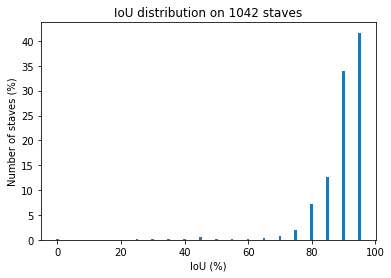

In [ ]:
sum = histData.sum()
percentage_histData = []
for i in histData:
    percentage_histData.append((i/sum)*100)


fig, ax = plt.subplots()
#ax.hist(arr, percentage_histData)
ax.bar(bins[:-1], percentage_histData)
ax.set(xlabel='IoU (%)', ylabel='Number of staves (%)',
       title=f'IoU distribution on {sum} staves')
fig.savefig('SAE_IoU.png')
plt.show()

In [ ]:
def reportFscore( 
                    original_dict,
                    list_fscore, 
                    list_precision, 
                    list_recall, 
                    list_overlapping_area, 
                    list_tp, 
                    list_fn, 
                    list_fp,
                    list_tp_tpc, 
                    list_fn_tpc, 
                    list_fp_tpc, 
                    list_overlapping_area_per_staff):

        assert(len(list_fscore) == len(list_precision) == len(list_recall))
        assert(len(original_dict) == len(list_fscore))

        mF1 = 0
        mP = 0
        mR = 0
        overlapping_area = 0.
        tp = 0
        fn = 0
        fp = 0
        tp_tpc = 0.
        fn_tpc = 0.
        fp_tpc = 0.
        count = 0
        print ("*"*40 + "FSCORE REPORT (staff)*"*40)
        
        for idx in range(len(list_fscore)):
            
            if list_fscore[idx] is None:
                pass
            else:
                mF1 += list_fscore[idx]
                mP  += list_precision[idx]
                mR  += list_recall[idx]
                overlapping_area += list_overlapping_area[idx]
                tp += list_tp[idx]
                fn += list_fn[idx]
                fp += list_fp[idx]

                tp_tpc += list_tp_tpc[idx]
                fn_tpc += list_fn_tpc[idx]
                fp_tpc += list_fp_tpc[idx]

                count = count + 1
        if (count > 0):
            mF1 /= count
            mP /= count
            mR /= count
            overlapping_area /= count
            tp_tpc /= count
            fn_tpc /= count
            fp_tpc /= count

        for idx in range(len(list_overlapping_area_per_staff)):
            list_overlapping_area_per_staff[idx] *= 100.
        print ("*"*40 + "AVERAGE (staff) *"*40)
        print ("mF1: %f; mP: %f, mR: %f, IoU: %f, TP: %f, FP: %f, FN: %f" % (mF1, mP, mR, overlapping_area, tp_tpc, fp_tpc, fn_tpc))
        print ("TP: %d, FP: %d, FN: %d" % (tp, fp, fn))
        histData, bins = np.histogram(list_overlapping_area_per_staff, bins=range(0,101,5)) #calculates histogram data
        np.set_printoptions(precision=3, suppress=True)
        print("Values: " + str(histData[0]).replace(".", ","))
        print("Possibles: " + str(histData[1]).replace(".", ","))
        print ("*"*100)
        return histData, bins


def get_groundtruth_bounding_boxes(gt_data_document):

    list_bbox = []

    for key, value in original_dict.items():
        regions = value['regions']
        for region in regions:
            xmin = region["xmin"]
            ymin = region["ymin"]

            xmax = region["xmax"]
            ymax = region["ymax"]

            list_bbox.append((ymin,xmin,ymax,xmax))
      
    print(f'Groundtruth images: {len(gt_data_document)}')
    print(f'Groundtruth staves: {len(list_bbox)}')
    return list_bbox


def getBoundingBoxes(image, val=100):
    threshold = val
    minContourSize= int(image.shape[0]*image.shape[1]*0.0025)
    
    img = np.copy(image)
    ROWS = img.shape[0]
    COLS = img.shape[1]

    for j in range(COLS):
        img[0, j] = 0
        img[1, j] = 0
        img[2, j] = 0

        img[ROWS-1, j] = 0
        img[ROWS-2, j] = 0
        img[ROWS-3, j] = 0
    
    for i in range(ROWS):
        img[i, 0] = 0
        img[i, 1] = 0
        img[i, 2] = 0

        img[i, COLS-1] = 0
        img[i, COLS-2] = 0
        img[i, COLS-3] = 0
        
    #minContourSize = 100
    im = np.uint8(img)
    #canny_output = cv2.Canny(im, threshold, threshold * 2)
    
    contours, herarchy = cv2.findContours(im, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # create hull array for convex hull points
    hull = []
    boundRect = []

    # calculate points for each contour
    for i in range(len(contours)):

        contour_i = contours[i]
        contour_poly = cv2.approxPolyDP(contour_i, 3, True)
        hull_i = cv2.convexHull(contour_poly, False)

        area = cv2.contourArea(hull_i)

        if (area > minContourSize):
            bbox_i = cv2.boundingRect(hull_i)

            rect_by_corners = (bbox_i[1], bbox_i[0], bbox_i[1]+bbox_i[3], bbox_i[0]+bbox_i[2])

            if (bbox_i[3] > bbox_i[2]):# If tt is a vertical region, we ignore it.
                continue

            if (bbox_i[3] / bbox_i[2] < 0.05):# If width and height are so much different, we ignore the region
                continue 
             
            boundRect.append(rect_by_corners)

    return boundRect

def getBoundingBoxesFromPrediction(prediction_image, vertical_reduction_regions=0., margin=0):
    val_bbox = 127
    bboxes = getBoundingBoxes(prediction_image, val=val_bbox)

    pred_shape = prediction_image.shape
    #print(bboxes)
    for idx in range(len(bboxes)):
        
        x_start = bboxes[idx][0]
        #print(f'x_start: {bboxes[idx][0]}')
        y_start = bboxes[idx][1]
        #print(f'y_start: {bboxes[idx][1]}')
        x_end = bboxes[idx][2]
        y_end = bboxes[idx][3]
        if vertical_reduction_regions > 0.:
            vertical_region_size = x_end - x_start
            gt_prediction_vertical_size = int(vertical_region_size // (1-vertical_reduction_regions))
            vertical_reduction_region_side = int((gt_prediction_vertical_size - vertical_region_size) // 2)
            bboxes[idx] = (
                        max(0,x_start-int(vertical_reduction_region_side)), 
                        max(0,y_start-margin), 
                        min(pred_shape[0], x_end + int(vertical_reduction_region_side)), 
                        min(y_end + margin, pred_shape[1]))
            
    return bboxes

[array([[[[ 9],
         [12],
         [11],
         ...,
         [10],
         [10],
         [12]],

        [[12],
         [ 8],
         [ 9],
         ...,
         [11],
         [11],
         [13]],

        [[10],
         [11],
         [10],
         ...,
         [ 9],
         [11],
         [15]],

        ...,

        [[10],
         [ 9],
         [ 8],
         ...,
         [10],
         [10],
         [11]],

        [[11],
         [10],
         [10],
         ...,
         [10],
         [12],
         [15]],

        [[ 9],
         [10],
         [ 9],
         ...,
         [ 9],
         [11],
         [12]]]], dtype=uint8)]


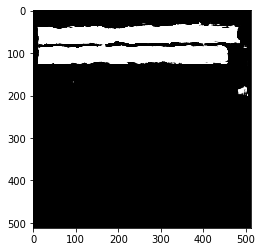

[(85, 14, 126, 455), (35, 13, 81, 479)]


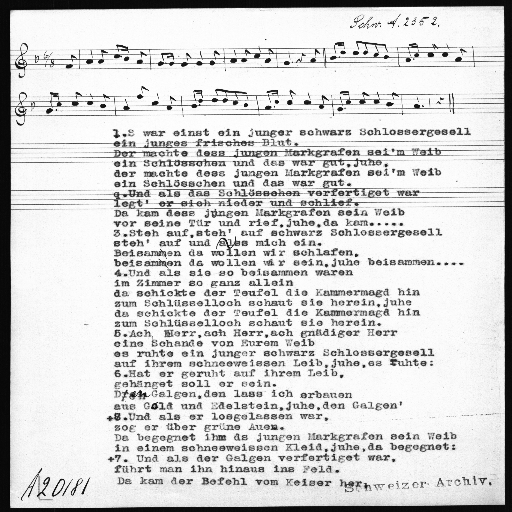

In [ ]:
i = 35
img = [x[i:i+1]]
print(img)
predict = model.predict(img)
predict = np.asarray(predict).reshape(1, 512, 512)
#predict = cvtColor(predict[0],cv2.COLOR_GRAY2RGB)
draw(predict[0])
boundRect = getBoundingBoxesFromPrediction(predict[0])
print(boundRect)
cv2_imshow(x[i])

In [ ]:
i = 35
predict = model.predict(x[i:i+1])
predict = np.asarray(predict).reshape(1, 512, 512)
#predict = cvtColor(predict[0],cv2.COLOR_GRAY2RGB)
draw(predict[0])
boundRect = getBoundingBoxesFromPrediction(predict[0])
print(boundRect)
cv2_imshow(x[i])

def predict_full_document(model, src_im, block_size):
        list_samples = [src_im]
        list_samples = np.asarray(list_samples).reshape(len(list_samples), block_size[0], block_size[1], block_size[2])
        prediction_src_sample = model.predict(x=list_samples, verbose=0)
        binarized_prediction = np.argmax(prediction_src_sample, axis=3)
        assert(len(binarized_prediction) == 1)
        prediction_full_src = binarized_prediction[0]
        prediction_full_src = np.array(prediction_full_src, dtype='uint8')
        return prediction_full_src

In [ ]:
def get_groundtruth_bounding_boxes(gt_data_document):

    list_bbox = []

    for key, value in original_dict.items():
        regions = value['regions']
        for region in regions:
            xmin = region["xmin"]
            ymin = region["ymin"]

            xmax = region["xmax"]
            ymax = region["ymax"]

            list_bbox.append((ymin,xmin,ymax,xmax))
      
    print(f'Groundtruth images: {len(gt_data_document)}')
    print(f'Groundtruth staves: {len(list_bbox)}')
    return list_bbox


def getBoundingBoxes(image, val=100):
    threshold = val
    minContourSize= int(image.shape[0]*image.shape[1]*0.0025)
    
    img = np.copy(image)
    ROWS = img.shape[0]
    COLS = img.shape[1]

    for j in range(COLS):
        img[0, j] = 0
        img[1, j] = 0
        img[2, j] = 0

        img[ROWS-1, j] = 0
        img[ROWS-2, j] = 0
        img[ROWS-3, j] = 0
    
    for i in range(ROWS):
        img[i, 0] = 0
        img[i, 1] = 0
        img[i, 2] = 0

        img[i, COLS-1] = 0
        img[i, COLS-2] = 0
        img[i, COLS-3] = 0
        
    #minContourSize = 100
    im = np.uint8(img)
    #canny_output = cv2.Canny(im, threshold, threshold * 2)
    
    contours, herarchy = cv2.findContours(im, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # create hull array for convex hull points
    hull = []
    boundRect = []

    # calculate points for each contour
    for i in range(len(contours)):

        contour_i = contours[i]
        contour_poly = cv2.approxPolyDP(contour_i, 3, True)
        hull_i = cv2.convexHull(contour_poly, False)

        area = cv2.contourArea(hull_i)

        if (area > minContourSize):
            bbox_i = cv2.boundingRect(hull_i)

            rect_by_corners = (bbox_i[1], bbox_i[0], bbox_i[1]+bbox_i[3], bbox_i[0]+bbox_i[2])

            if (bbox_i[3] > bbox_i[2]):# If tt is a vertical region, we ignore it.
                continue

            if (bbox_i[3] / bbox_i[2] < 0.05):# If width and height are so much different, we ignore the region
                continue 
             
            boundRect.append(rect_by_corners)

    return boundRect

def getBoundingBoxesFromPrediction(prediction_image, vertical_reduction_regions=0., margin=0):
    val_bbox = 127
    bboxes = getBoundingBoxes(prediction_image, val=val_bbox)

    pred_shape = prediction_image.shape
    #print(bboxes)
    for idx in range(len(bboxes)):
        
        x_start = bboxes[idx][0]
        #print(f'x_start: {bboxes[idx][0]}')
        y_start = bboxes[idx][1]
        #print(f'y_start: {bboxes[idx][1]}')
        x_end = bboxes[idx][2]
        y_end = bboxes[idx][3]
        if vertical_reduction_regions > 0.:
            vertical_region_size = x_end - x_start
            gt_prediction_vertical_size = int(vertical_region_size // (1-vertical_reduction_regions))
            vertical_reduction_region_side = int((gt_prediction_vertical_size - vertical_region_size) // 2)
            bboxes[idx] = (
                        max(0,x_start-int(vertical_reduction_region_side)), 
                        max(0,y_start-margin), 
                        min(pred_shape[0], x_end + int(vertical_reduction_region_side)), 
                        min(y_end + margin, pred_shape[1]))
            
    return bboxes

In [ ]:
import cv2 as cv
import numpy as np

def bb_intersection_over_union(boxA, boxB):
    # determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    # compute the area of intersection rectangle
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)
    # return the intersection over union value
    return iou
    
class OverlappingBBox:
    def __init__(self, gt_bbox, pred_bbox):
        assert(type(gt_bbox) is tuple)
        assert(type(pred_bbox) is tuple)
        assert(len(gt_bbox) == 4)
        assert(len(pred_bbox) == 4)
        #assert(gt_bbox[0] < gt_bbox[2])
        #assert(gt_bbox[1] < gt_bbox[3])
        #assert(pred_bbox[0] < pred_bbox[2])
        #assert(pred_bbox[1] < pred_bbox[3])
        self.gt_bbox = gt_bbox
        self.pred_bbox = pred_bbox
        self.overlapped_area = self.getOverlappingArea()

    
    

    def getOverlappingArea(self):
        return bb_intersection_over_union(self.gt_bbox, self.pred_bbox)


    def __str__(self):
        return "GT(" + str(self.gt_bbox) + ")" + "--PRED(" + str(self.pred_bbox) + ")" + "--OVERLAP(" + str(self.overlapped_area) + ")"

    def __repr__(self):
        return "\n" + self.__str__()

def __computeByOverlapping(list_gt_bbox, list_pred_bbox):

    list_ordered_overlapping = []

    for pred_bbox in list_pred_bbox:
        assert(type(pred_bbox) is tuple)
        for gt_bbox in list_gt_bbox:
            assert(type(gt_bbox) is tuple)
            overlapped_bbox = OverlappingBBox(gt_bbox=gt_bbox, pred_bbox=pred_bbox)
            list_ordered_overlapping.append(overlapped_bbox)

    list_ordered_overlapping.sort(key=lambda x: x.overlapped_area, reverse=True)

    return list_ordered_overlapping



def getSimilarRegionPredwithGT(list_pred_bbox, list_gt_bbox, th=.55):

    similar_regions = []
    list_ordered_overlapping = __computeByOverlapping(list_gt_bbox, list_pred_bbox)

    list_discarded_gt = []
    for ordered_overlapping in list_ordered_overlapping:
        overlapping_area = ordered_overlapping.getOverlappingArea()
        if ordered_overlapping.gt_bbox not in list_discarded_gt:
            list_discarded_gt.append(ordered_overlapping.gt_bbox)
            if (overlapping_area >= th):
                similar_regions.append((ordered_overlapping.pred_bbox, ordered_overlapping.gt_bbox))

    return similar_regions


def getFscoreRegions(list_gt_bbox, list_pred_bbox, th=.55):

    assert(type(list_gt_bbox) is list)
    assert(type(list_pred_bbox) is list)
    assert(type(th) is float)
    assert(th>=0 and th <=1)

    tp = 0 #true positive
    fp = 0 #false positive
    fn = 0 #false negative

    avg_overlapping_area = 0.
    num_regions = 0

    list_overlapping_area = []
    list_ordered_overlapping = __computeByOverlapping(list_gt_bbox, list_pred_bbox)
    #print (list_ordered_overlapping)

    list_discarded_pred = []
    list_discarded_gt = []
    for ordered_overlapping in list_ordered_overlapping:
        overlapping_area = ordered_overlapping.getOverlappingArea()
        if ordered_overlapping.gt_bbox not in list_discarded_gt:
            avg_overlapping_area += overlapping_area
            num_regions += 1
            list_overlapping_area.append(overlapping_area)
            list_discarded_gt.append(ordered_overlapping.gt_bbox)
            list_discarded_pred.append(ordered_overlapping.pred_bbox)
            if (overlapping_area >= th):
                tp = tp + 1
            else:
                fp = fp + 1 

    fn = abs(len(list_discarded_gt) - len(list_gt_bbox))

    if (tp + fn) == 0:
        return None, None, None, None, None, None, None, None, None
    else:
        recall = tp / (tp + fn)

    if (tp + fp) == 0:
        return None, None, None, None, None, None, None, None, None
    else:
        precision = tp / (tp + fp)
    
    avg_overlapping_area /= num_regions

    return 2 * (precision*recall) / (precision+recall + 0.000001), precision, recall, avg_overlapping_area, tp, fn, fp, list_overlapping_area, num_regions

In [ ]:
model = keras.models.load_model('/content/drive/MyDrive/SAE_Model')


In [ ]:
sae_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 510, 510, 128)     3584      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 255, 255, 128)     0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 255, 255, 128)     147584    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 128, 128, 128)     0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 128, 128, 128)     147584    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 64, 64, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 64, 64, 128)       1

## 7. Predict

In [ ]:
# Generate predictions (probabilities -- the output of the last layer)
# on new data using `predict`
print("Generate predictions for 3 samples")
predictions = model.predict(x[:3])
print("predictions shape:", predictions.shape)

Generate predictions for 3 samples
predictions shape: (3, 512, 512, 1)


In [ ]:
def draw_predictions(gt , index, num):
    x = gt[index:index+num]
    predictions = model.predict(x)
    for i in range(0,len(predictions)):
        img_predicted = np.asarray(predictions[i]).reshape(1, 512, 512)
        draw(img_predicted[0])
        cv2_imshow(x[i])

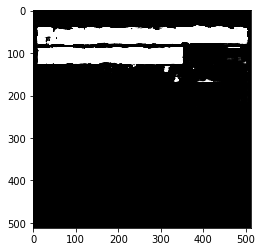

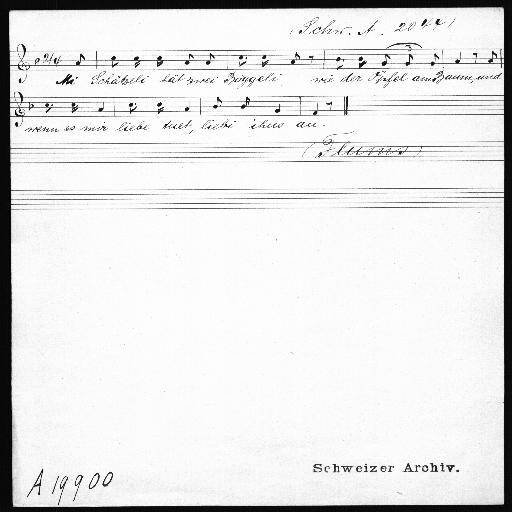

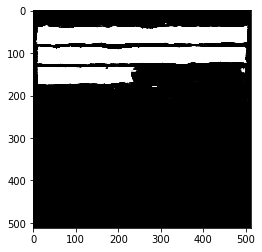

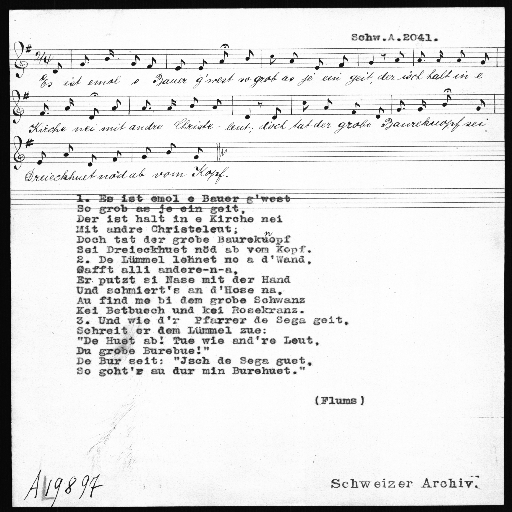

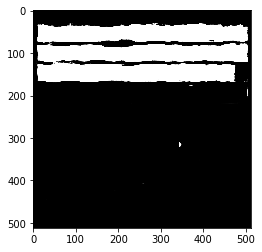

...

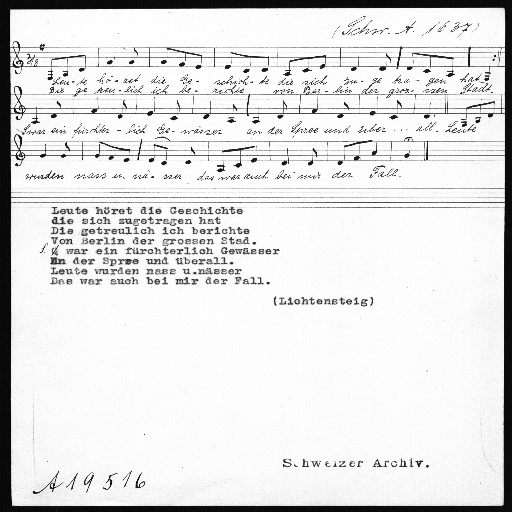

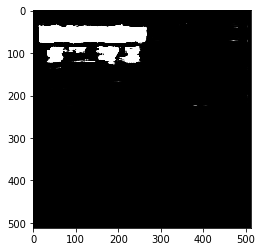

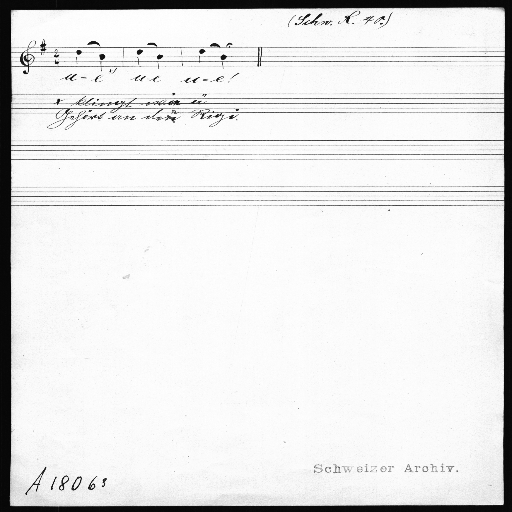

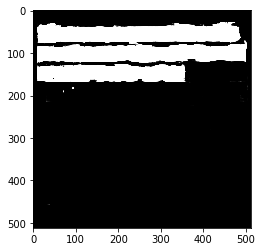

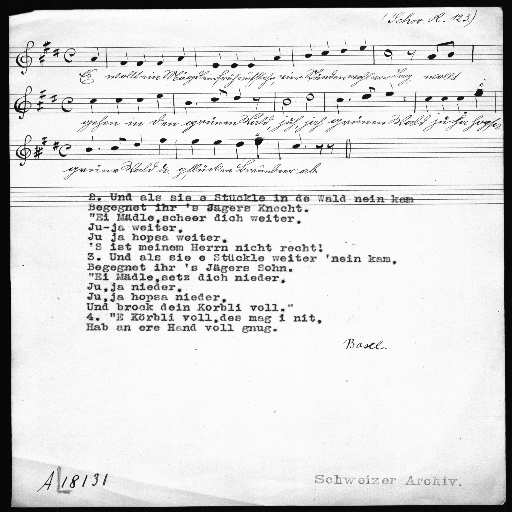

In [ ]:
draw_predictions(x, 300, 10)

In [ ]:
def getBoundingBoxes(image, val=100):
    threshold = val
    minContourSize= int(image.shape[0]*image.shape[1]*0.0025)
    
    img = np.copy(image)
    ROWS = img.shape[0]
    COLS = img.shape[1]

    for j in range(COLS):
        img[0, j] = 0
        img[1, j] = 0
        img[2, j] = 0

        img[ROWS-1, j] = 0
        img[ROWS-2, j] = 0
        img[ROWS-3, j] = 0
    
    for i in range(ROWS):
        img[i, 0] = 0
        img[i, 1] = 0
        img[i, 2] = 0

        img[i, COLS-1] = 0
        img[i, COLS-2] = 0
        img[i, COLS-3] = 0
        
    #minContourSize = 100
    im = np.uint8(img)
    #canny_output = cv2.Canny(im, threshold, threshold * 2)
    
    contours, herarchy = cv2.findContours(im, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # create hull array for convex hull points
    hull = []
    boundRect = []

    # calculate points for each contour
    for i in range(len(contours)):

        contour_i = contours[i]
        contour_poly = cv2.approxPolyDP(contour_i, 3, True)
        hull_i = cv2.convexHull(contour_poly, False)

        area = cv2.contourArea(hull_i)

        if (area > minContourSize):
            bbox_i = cv2.boundingRect(hull_i)

            rect_by_corners = (bbox_i[1], bbox_i[0], bbox_i[1]+bbox_i[3], bbox_i[0]+bbox_i[2])

            if (bbox_i[3] > bbox_i[2]):# If tt is a vertical region, we ignore it.
                continue

            if (bbox_i[3] / bbox_i[2] < 0.05):# If width and height are so much different, we ignore the region
                continue 
             
            boundRect.append(rect_by_corners)

    return boundRect

def getBoundingBoxesFromPrediction(prediction_image, vertical_reduction_regions=0., margin=0):
    val_bbox = 127
    bboxes = getBoundingBoxes(prediction_image, val=val_bbox)

    pred_shape = prediction_image.shape
    #print(bboxes)
    for idx in range(len(bboxes)):
        
        x_start = bboxes[idx][0]
        #print(f'x_start: {bboxes[idx][0]}')
        y_start = bboxes[idx][1]
        #print(f'y_start: {bboxes[idx][1]}')
        x_end = bboxes[idx][2]
        y_end = bboxes[idx][3]
        if vertical_reduction_regions > 0.:
            vertical_region_size = x_end - x_start
            gt_prediction_vertical_size = int(vertical_region_size // (1-vertical_reduction_regions))
            vertical_reduction_region_side = int((gt_prediction_vertical_size - vertical_region_size) // 2)
            bboxes[idx] = (
                        max(0,x_start-int(vertical_reduction_region_side)), 
                        max(0,y_start-margin), 
                        min(pred_shape[0], x_end + int(vertical_reduction_region_side)), 
                        min(y_end + margin, pred_shape[1]))
            
    return bboxes

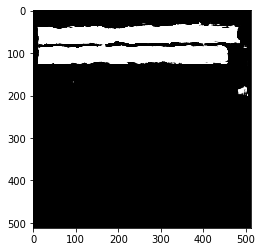

[(85, 14, 126, 455), (35, 13, 81, 479)]
x_start: 85
y_start: 14
x_start: 35
y_start: 13
[(85, 14, 126, 455), (35, 13, 81, 479)]


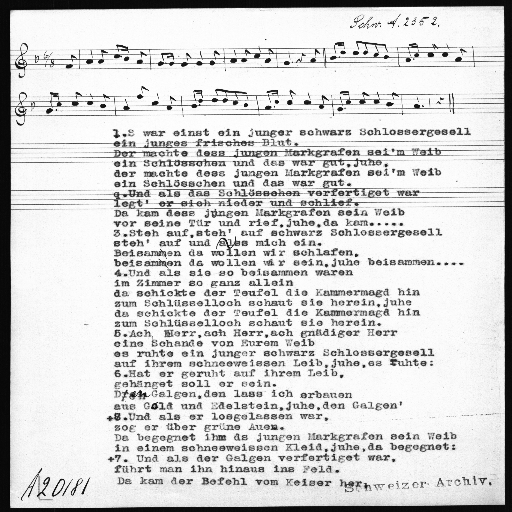

In [ ]:
i = 35
predict = model.predict(x[i:i+1])
predict = np.asarray(predict).reshape(1, 512, 512)
#predict = cvtColor(predict[0],cv2.COLOR_GRAY2RGB)
draw(predict[0])
boundRect = getBoundingBoxesFromPrediction(predict[0])
print(boundRect)
cv2_imshow(x[i])

In [41]:
def load_single_image(path_file):
    X = []
    img = load_image(path_file,1)
    original = redimImage(img, 512, 512)
    X_doc = [original]
    X.append(X_doc)
    X = np.asarray(X).reshape(len(X), 512, 512, 1)

    return X
def predict_single_image(image_path, trained_model):
    img = load_single_image(image_path)
    predict = trained_model.predict(img)
    predict = np.asarray(predict).reshape(1, 512, 512)

    draw(predict[0])
    cv2_imshow(img[0])

In [42]:
image_path = "/content/drive/MyDrive/Bachelorarbeit/staff/images/00755.jpg"
predict_single_image(image_path, model)

NameError: ignored

In [ ]:
x = 120
predict = model.predict(X_train[x:x+1])
predict = np.asarray(predict).reshape(1, 512, 512, 1)
predict = cvtColor(predict[0],cv2.COLOR_GRAY2RGB)
print(predict.shape)
draw(predict)
cv2_imshow(X_train[x])

TypeError: ignored

## 8. Model laden

In [ ]:
model = load_model('/content/drive/MyDrive/Bachelorarbeit/models/SAE_Model')

## 6. Zusatz

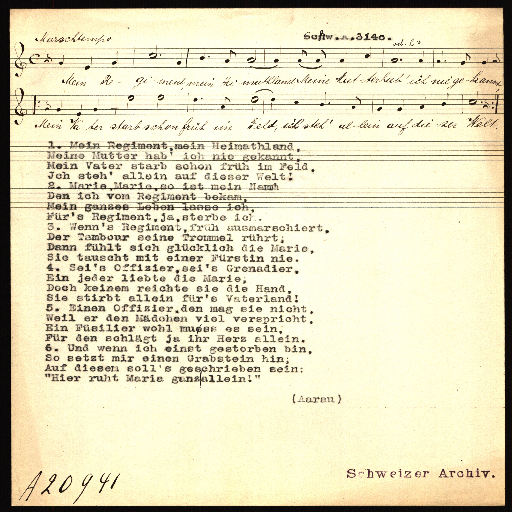

In [ ]:
cv2_imshow(X_train[144])

In [ ]:
image = cv2.convertScaleAbs(cv2.imread("/content/drive/My Drive/Bachelorarbeit/Liedblätter/BoundingBoxes/A25.jpg", cv2.IMREAD_COLOR))

In [ ]:
#!/bin/bash
#Train the SAE model to detect staff regions
#Script tested for python 3

gpu="0"

model="sae"
mode="train"
color_mode="0"
equalization="wb"
data_aug="--daug"     
sample_width="512"
sample_height="512"
kernel_width="3"
kernel_height="3"
filters="128"
batch="4"
normalization="inv255"
epochs="300"
blocks="3"
save_images="--img"
dataset="datasets/Liedblatter-Ciclo1/BoundingBoxes"
labels="staff"
gt_region_reduction="0.2"


In [ ]:
def build_model():
        """SAE"""
        img_shape = (512,512,3)
        kernel_shape = (3,3)
        filters = 128
        activation_function = 'relu'
        pool = 2
        num_blocks = 3
        with_batch_normalization = False
        num_classes = 2 - 1 


        input = Input(shape=img_shape)
        encoder = Conv2D(filters=filters,kernel_size=kernel_shape, padding='same', input_shape=img_shape)(input)

        if (with_batch_normalization):
            encoder = BatchNormalization(axis=self.bn_axis)(encoder)
        
        #encoder = LeakyReLU(alpha=0.0001)(encoder)
        encoder = Activation(activation_function)(encoder)
        encoder = MaxPooling2D(pool_size=(pool, pool))(encoder)

        for _ in range(num_blocks - 1):
            encoder = Convolution2D(filters=filters,kernel_size=kernel_shape, padding='same')(encoder)
            if (with_batch_normalization):
                encoder = BatchNormalization(axis=self.bn_axis)(encoder)

            #encoder = LeakyReLU(alpha=0.0001)(encoder)
            encoder = Activation(activation_function)(encoder)
            if (pool > 1):
                encoder = MaxPooling2D(pool_size=(pool, pool))(encoder)
            
        # Decoding

        decoder = encoder
        for _ in range(num_blocks):
            decoder = Convolution2D(filters=filters,kernel_size=kernel_shape, padding='same')(decoder)
            if (with_batch_normalization):
                decoder = BatchNormalization(axis=self.bn_axis)(decoder)
            #decoder = LeakyReLU(alpha=0.0001)(decoder)
            decoder = Activation(activation_function)(decoder)
            if (pool > 1):
                decoder = UpSampling2D((pool, pool))(decoder)

     
        # Prediction
        decoder = Convolution2D(num_classes, kernel_size=kernel_shape, padding='same')(decoder)
        decoder = Activation('sigmoid')(decoder)

        model = Model(inputs=input, outputs=decoder)
        model.summary()
        return model

In [ ]:
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate, Convolution2D
from keras.layers.convolutional import UpSampling2D, Conv2D, MaxPooling2D
from keras.layers import BatchNormalization, Activation, ZeroPadding2D, Add
from keras.models import Sequential, Model, load_model
model = build_model()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 512, 512, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 512, 512, 128)     3584      
_________________________________________________________________
activation (Activation)      (None, 512, 512, 128)     0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 256, 256, 128)     0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 256, 256, 128)     147584    
_________________________________________________________________
activation_1 (Activation)    (None, 256, 256, 128)     0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 128, 128, 128)    

In [ ]:
import os
def LoadLiedBlatterDataset(data_path):
    
    images = []
    kernSequences = []

    assert(os.path.isdir(data_path + "/BoundingBoxes"))
    assert(os.path.isdir(data_path + "/Kern"))

    krnpath = data_path + "/Kern"
    boundingpath = data_path + "/BoundingBoxes"
    #If everything is alright, we proceed to load the correspondent data and kern
    
    boundings_dictionary = create_data_dict(boundingpath)
    
    for key in tqdm(boundings_dictionary):
        base_name = key.split('.')[0]
        original_image = imread(krnpath + '/' + base_name + "/" + base_name + ".jpg", False)
        regions = boundings_dictionary[key]['regions']
        for idx, region in enumerate(regions):
            #Try to load a correspondent kern
            #I suppose that kerns are stored in staves order, so I go sequentially
            try:
                krnfile = open(krnpath + '/' + base_name + "/" + base_name + "_" + str(idx+1) + ".krn")
                krnLines = krnfile.readlines()
                for i, line in enumerate(krnLines):
                    line = line.split("\n")[0] #Dumb trick to get the characters without breaks
                    krnLines[i] = line
                kernSequences.append(krnLines)
                
                ymin = region['ymin']
                heihgt = region['ymax'] - ymin
                xmin = region['xmin']
                width = region['xmax'] - xmin
                cropped_image = original_image[ymin:ymin+heihgt][xmin:xmin+width]

                width = int(float(64 * cropped_image.shape[1]) / cropped_image.shape[0])
                image = resize(cropped_image, (width, 64))

                images.append(image)
            
            except Exception as error:
                #If the file is not found, it means we have met an empty staff and we do not need to proceed further
                #We kill the loop
                break


    return images, kernSequences

In [ ]:
XLied, YLied = LoadLiedBlatterDataset('/content/drive/My Drive/Bachelorarbeit/Liedblätter/')

100%|██████████| 25/25 [00:46<00:00,  1.84s/it]


# CRNN Training


## 1.1 Korpus laden: Camera-PrIMuS



In [ ]:
def read_image_names_from_json(json_path):
    with open(json_path, "r") as f:
        json_file = json.load(f)
        regions = json_file["regions"]
        image_names = []
        for img in regions:
            image_names.append(img['image_name'])
        print(f'Kern Json: {len(image_names)}')
        return image_names


def get_corpus_image_names(corpus_path):

    filenames_with_suffix = os.listdir(corpus_path)
    filenames = []
    for i in range(0,len(filenames_with_suffix)):
        filenames.append(filenames_with_suffix[i].split(".")[0])
    
    filenames_clean = []
    for filename in filenames:
        filenames_clean.append(filename.replace("_distorted", ""))

    return filenames_clean

def intersect_corpus_json_names(corpus_image_names, json_image_names):
    return list(set(corpus_image_names) & set(json_image_names)) 

In [ ]:
# create train_datalist and val_datalist for zip file with only images without folders
def create_datalist(corpus_path, val_size, json_path):

  
    corpus_image_names = get_corpus_image_names(corpus_path)
    json_image_names = read_image_names_from_json(json_path)

    datalist = intersect_corpus_json_names(corpus_image_names, json_image_names)

          
    data_list_size = len(datalist)          

    train_datalist = []
    val_datalist = []

    x_train = datalist[int(data_list_size*val_size):]
    x_val = datalist[:int(data_list_size*val_size)]

    for name in x_train:
        train_datalist.append(name)
    for name in x_val:
        val_datalist.append(name)
    print(len(train_datalist))
    print(len(val_datalist))


    with open("train_datalist.txt", "w") as t:
        for element in train_datalist:
            t.write(f'{element}\n')

    with open("val_datalist.txt", "w") as v:
        for element in val_datalist:
            v.write(f'{element}\n')


In [ ]:
def read_image_names_from_json(json_path):
    with open(json_path, "r") as f:
        json_file = json.load(f)
        regions = json_file["regions"]
        image_names = []
        for img in regions:
            image_names.append(img['image_name'])
        print(f'Kern Json: {len(image_names)}')
        return image_names


def get_corpus_image_names(corpus_path):

    filenames_with_suffix = os.listdir(corpus_path)
    filenames = []
    for i in range(0,len(filenames_with_suffix)):
        filenames.append(filenames_with_suffix[i].split(".")[0])
    
    filenames_clean = []
    for filename in filenames:
        filenames_clean.append(filename.replace("_distorted", ""))

    return filenames_clean

def intersect_corpus_json_names(corpus_image_names, json_image_names):
    return list(set(corpus_image_names) & set(json_image_names)) 

# create train_datalist and val_datalist for zip file with only images without folders
def create_datalist(corpus_path, val_size, json_path):

  
    corpus_image_names = get_corpus_image_names(corpus_path)
    json_image_names = read_image_names_from_json(json_path)

    datalist = intersect_corpus_json_names(corpus_image_names, json_image_names)

          
    data_list_size = len(datalist)          

    train_datalist = []
    val_datalist = []

    x_train = datalist[int(data_list_size*val_size):]
    x_val = datalist[:int(data_list_size*val_size)]

    for name in x_train:
        train_datalist.append(name)
    for name in x_val:
        val_datalist.append(name)
    print(len(train_datalist))
    print(len(val_datalist))


    with open("train_datalist.txt", "w") as t:
        for element in train_datalist:
            t.write(f'{element}\n')

    with open("val_datalist.txt", "w") as v:
        for element in val_datalist:
            v.write(f'{element}\n')



def load_camera_primus_images(dataFile, path):
    X = []
    read_images = 0
    loadedSamples = 0
    with open(dataFile, "r") as paths:
        lines = paths.readlines()
        for line in lines:
            read_images += 1
            img_path = f'{path}/{line[:-1]}_distorted.jpg'
            print(f'{read_images}:{line}')
            image = imread(img_path, False)
            #image = cv2.resize(imread(img_path,False), (0,0), fx=0.25, fy=0.25)
            X.append(image)
            print(X[-1].shape)

    return np.array(X)

def load_camera_primus_groundtruth(kernfile, datafile):
    Y = []
    YSequence = []

    with open(kernfile, "r") as f:
        json_file = json.load(f)
    with open(datafile, "r") as d:
        data_list = d.read().splitlines()

    regions = json_file['regions']
    for data_name in tqdm(data_list):
        for img_name in regions:
          #print(f'{data_name}={img_name["image_name"]}?')
          if data_name == img_name['image_name']:
            kern_without_semicolon = img_name['semantic'].replace(";", "")
            kern_clean = kern_without_semicolon.replace("**skern", "**kern")
            YSequence = kern_clean.splitlines()
            Y.append(YSequence)
            YSequence = []
            continue
    return np.array(Y)       

      

In [ ]:
fixed_height = 64
primus_path = "/content/corpus_imgs_distorded"
kern_path = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/primus-kern/primus/primus_kern.json"
val_size = 0.9
create_datalist(primus_path, val_size, kern_path)

Kern Json: 87316
8732
78584


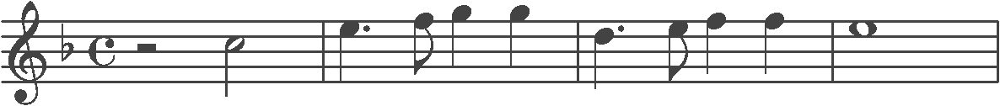

0: ['**skern', '*clefG2', '*k[b-]', '*met(C)', '2r', '2cc', '=', '4.ee', '8ff', '4gg', '4gg', '=', '4.dd', '8ee', '4ff', '4ff', '=', '1ee', '=']


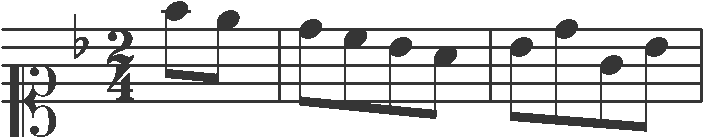

1: ['**skern', '*clefC1', '*k[b-]', '*M2/4', '8ff', '8ee', '=', '8dd', '8cc', '8b-', '8a', '=', '8b-', '8dd', '8g', '8b-', '=']


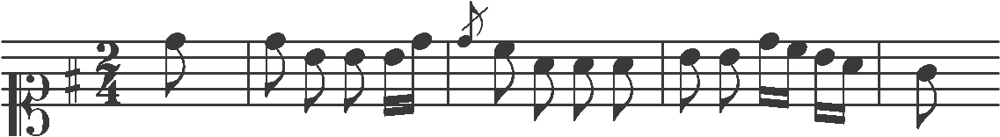

2: ['**skern', '*clefC1', '*k[f#]', '*M2/4', '8dd', '=', '8dd', '8b', '8b', '16b', '16dd', '=', '8dd/', '8cc', '8a', '8a', '8a', '=', '8b', '8b', '16dd', '16cc', '16b', '16a', '=', '8g']


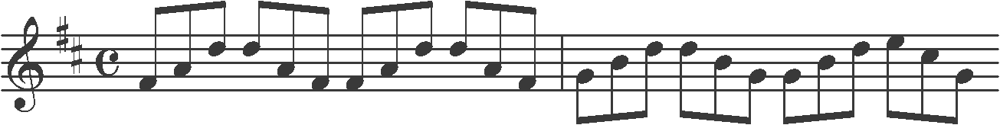

3: ['**skern', '*clefG2', '*k[f#c#]', '*met(C)', '8f#', '8a', '8dd', '8dd', '8a', '8f#', '8f#', '8a', '8dd', '8dd', '8a', '8f#', '=', '8g', '8b', '8dd', '8dd', '8b', '8g', '8g', '8b', '8dd', '8ee', '8cc#', '8g']


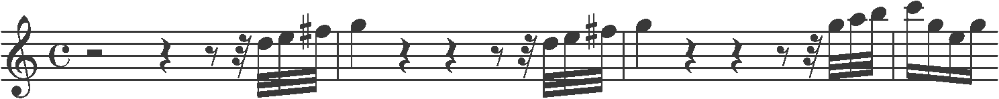

4: ['**skern', '*clefG2', '*met(C)', '2r', '4r', '8r', '32r', '32dd', '32ee', '32ff#', '=', '4gg', '4r', '4r', '8r', '32r', '32dd', '32ee', '32ff#', '=', '4gg', '4r', '4r', '8r', '32r', '32gg', '32aa', '32bb', '=', '16ccc', '16gg', '16ee', '16gg']


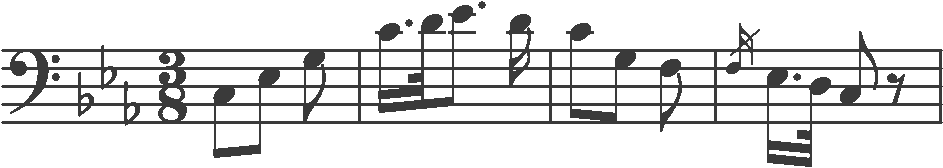

5: ['**skern', '*clefF4', '*k[b-e-a-]', '*M3/8', '8C', '8E-', '8G', '=', '16.c', '32d', '8.e-', '16d', '=', '8c', '8G', '8F', '=', '16F/', '16.E-', '32D', '8C', '8r', '=']


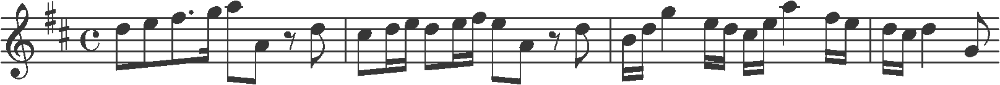

6: ['**skern', '*clefG2', '*k[f#c#]', '*met(C)', '8dd', '8ee', '8.ff#', '16gg', '8aa', '8a', '8r', '8dd', '=', '8cc#', '16dd', '16ee', '8dd', '16ee', '16ff#', '8ee', '8a', '8r', '8dd', '=', '16b', '16dd', '4gg', '16ee', '16dd', '16cc#', '16ee', '4aa', '16ff#', '16ee', '=', '16dd', '16cc#', '4dd', '8g']


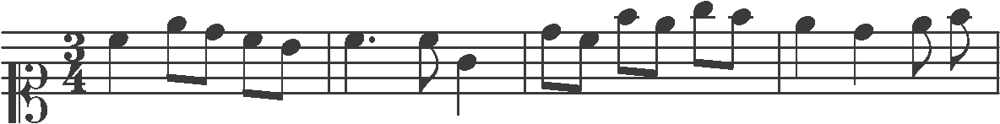

7: ['**skern', '*clefC1', '*M3/4', '4cc', '8ee', '8dd', '8cc', '8b', '=', '4.cc', '8cc', '4g', '=', '8dd', '8cc', '8ff', '8ee', '8gg', '8ff', '=', '4ee', '4dd', '8ee', '8ff', '=']


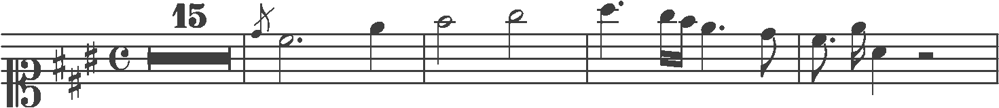

8: ['**skern', '*clefC1', '*k[f#c#g#]', '*met(C)', '1r', '=', '8dd/', '2.cc#', '4ee', '=', '2ff#', '2gg#', '=', '4.aa', '16gg#', '16ff#', '4.ee', '8dd', '=', '8.cc#', '16ee', '4a', '2r', '=']


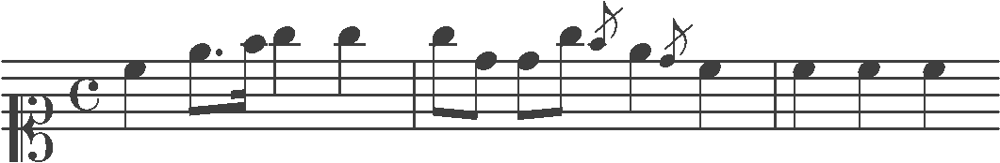

9: ['**skern', '*clefC1', '*met(C)', '4cc', '8.ee', '16ff', '4gg', '4gg', '=', '8gg', '8dd', '8dd', '8gg', '8ff/', '4ee', '8dd/', '4cc', '=', '4cc', '4cc', '4cc']


In [ ]:
for i in range(10):
  cv2_imshow(XPrimus[i])
  print(f'{i}: {YPrimus[i]}')

## 1.2 Korpus laden: FMT

In [ ]:
def return_json_files_in_path(path):
    files = os.listdir(path)
    return [file for file in files if file.endswith(".json")]

def load_fmt_data(path, corpus_path, fixed_heigth):

    images = []
    semantics = []
    json_files = return_json_files_in_path(path)
    for json_file in json_files:

        print(json_file)
        json_path = f'{path}/{json_file}'
        with open(json_path, "r") as f:
            json_file = json.load(f)
            regions = json_file["regions"]
            for img in tqdm(regions):
                image_name = img['image_name'].rstrip()
                image_path = f'{corpus_path}/{image_name}'
                original_image = imread(image_path, False)
                #print(image_path)

                semantic = img['semantic'].replace("/;", "").replace("\\", "").replace("\/", "").replace(";", "").splitlines()
                semantics.append(semantic)
                bounding_box = img['bounding_box']
                x_min = bounding_box['fromX']
                x_max = bounding_box['toX']
                y_min = bounding_box['fromY']
                y_max = bounding_box['toY']

                height = y_max - y_min
                width = x_max - x_min
                cropped_image = original_image[y_min:y_min+height, x_min:x_min+width]
                resized_width = int(float(fixed_height * cropped_image.shape[1]) / cropped_image.shape[0])
                resized_image = resize(cropped_image, (resized_width, fixed_height))

                #print(f'x_min: {x_min}\nx_max: {x_max}\ny_min: {y_min}\ny_max: {y_max}\nwidth: {width}\nheight: {height}')
                #print(f'orginale_shape: {original_image.shape}')
                #print(f'crop_shape: {cropped_image.shape}')
                #print(f'resized_shape: {resized_image.shape}')
                
                #draw(original_image)
                #draw(resized_image)


              
                
                images.append(resized_image)

    # replace **skern by **kern 
    semantics__clean = []
    for staves in semantics:
        staff_clean = [staff.replace('**skern', '**kern') for staff in staves]
        semantics__clean.append(staff_clean)
    return images, semantics__clean

## 1.3 Korpus laden: Regensburger Liedblattsammlung


In [ ]:
def xml_to_pandas_dataframe(dataset_dir):
    """Iterates through all .xml files (generated by labelImg) in a given directory and combines
    them in a single Pandas dataframe.

    Parameters:
    ----------
    path : str
        The path containing the .xml files
    Returns
    -------
    Pandas DataFrame
        The produced dataframe
    """
    annotations_dir = dataset_dir

    xml_list = []
    for xml_file in glob.glob(annotations_dir + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height',
                   'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df

def pandas_dataframe_to_dictionary(df):
    dictionary = {}

    for _, df_row in df.iterrows():

        filename = df_row['filename']
        width = df_row['width']
        height = df_row['height']
        label_region = df_row['class']
        xmin = df_row['xmin']
        ymin = df_row['ymin']
        xmax = df_row['xmax']
        ymax = df_row['ymax']

        data_region = {
            'class':label_region,
            'xmin':xmin,
            'ymin':ymin,
            'xmax':xmax,
            'ymax':ymax
        }
        if filename in dictionary:
            dictionary[filename]['regions'].append(data_region)
        else:
            data_page = {
                'width':width,
                'height':height,
                'regions':[data_region]
            }
            dictionary[filename] = data_page

    return dictionary

def create_data_dict(path):
    xml_input = xml_to_pandas_dataframe(path)
    regions_dict = pandas_dataframe_to_dictionary(xml_input)
    return regions_dict


def draw(image):
    plt.imshow(image, interpolation='nearest', cmap='gray')
    plt.show()


def load_rls_data(data_path, fixed_height):
    
    images = []
    kernSequences = []

    assert(os.path.isdir(data_path + "/annots"))
    assert(os.path.isdir(data_path + "/kern"))

    krnpath = data_path + "/kern"
    boundingpath = data_path + "/annots"
    imgpath = data_path + "/imgs"

    boundings_dictionary = create_data_dict(boundingpath)
    for key in boundings_dictionary:
        base_name = key.split('.')[0]
        original_image = imread(imgpath + "/" + base_name + ".jpg", False)
        regions = boundings_dictionary[key]['regions']
        for idx, region in enumerate(regions):
            #Try to load a correspondent kern
            try:
                krnfile = open(krnpath + '/' + base_name + "_" + str(idx+1) + ".krn")
                krnLines = krnfile.readlines()
                for i, line in enumerate(krnLines):
                    line = line.split("\n")[0]
                    krnLines[i] = line
                kernSequences.append(krnLines)
                
                ymin = region['ymin']
                height = region['ymax'] - ymin
                xmin = region['xmin']
                width = region['xmax'] - xmin
                cropped_image = original_image[ymin:ymin+height][xmin:xmin+width]

                width = int(float(fixed_height * cropped_image.shape[1]) / cropped_image.shape[0])
                image = resize(cropped_image, (width, fixed_height))


                images.append(image)
            
            except Exception as error:
                break

    # Adjust dot to the format in Primus and fmt
    for staff in kernSequences:
        for i in range(len(staff)):
            note = staff[i]
            if note.endswith(".") or note.endswith(".L") or note.endswith(".)") or note.endswith(".J") or note.endswith(".-"):
              m = re.search('((\(?)\d{1,2})(\D{1,5}(\.L?|\.?))', note)
              num = m.groups()[0]
              misc_dot = m.groups()[2]
              misc = misc_dot.replace(".", "")
              num_dot = num.replace(num, f'{num}.')
              new_symbol = f'{num_dot}{misc}'
              note = new_symbol
              staff[i] = new_symbol

    return images, kernSequences

## 2. Vokabular erstellen

In [ ]:
def make_vocabulary(YSequences, pathToSave):
    vocabulary = set()
    for samples in YSequences:
        for sequence in samples:
            vocabulary.update(sequence)

    #Vocabulary created
    w2i = {symbol:idx for idx,symbol in enumerate(vocabulary)}
    i2w = {idx:symbol for idx,symbol in enumerate(vocabulary)}

    w2i_filepath = pathToSave + "/" + "w2i.npy"
    i2w_filepath = pathToSave + "/" + "i2w.npy"

    np.save(w2i_filepath, w2i)
    #Save the vocabulary
    np.save(i2w_filepath, i2w)

    return w2i, i2w
    

def check_and_retrieveVocabulary(YSequences, pathOfSequences):
    
    w2ipath = pathOfSequences + "/" + "w2i.npy"
    i2wpath = pathOfSequences + "/" + "i2w.npy"

    w2i = []
    i2w = []
    #if os.path.isfile(w2ipath):
    if os.path.exists(pathOfSequences):
        print("Found Vocabulary")
        w2i = np.load(w2ipath, allow_pickle=True).item()
        i2w = np.load(i2wpath, allow_pickle=True).item()
    else:
        print("Create Vocabulary")
        os.mkdir(pathOfSequences)
        w2i, i2w = make_vocabulary(YSequences, pathOfSequences)

    return w2i, i2w

def data_preparation_CTC(X, Y, height):
    print("DATA PREPARATION")
    # X_train, L_train
    max_image_width = max([img.shape[1] for img in X])
    error = 0 

    X_train = np.zeros(shape=[len(X), height, max_image_width, 1], dtype=np.float32)
    L_train = np.zeros(shape=[len(X),1])

    #print(X_train.shape)
    #print(X.shape)


    for i, img in enumerate(X):
        try:
            #print(f'{i}: {X[i].shape}')
            X_train[i, 0:img.shape[0], 0:img.shape[1],0] = img
            L_train[i] = img.shape[1] // 2 
            #draw(img)
            #print(f'SUCCESS: {X[i].shape}')
        except:
            print(f'ERROR: {i}: {X[i].shape}')
            cv2_imshow(img)
            error += 1
      
    # Y_train, T_train
    max_length_seq = max([len(w) for w in Y])

    Y_train = np.zeros(shape=[len(X),max_length_seq])
    T_train = np.zeros(shape=[len(X),1])
    for i, seq in enumerate(Y):
        Y_train[i, 0:len(seq)] = seq
        T_train[i] = len(seq)

    print(error)
    return X_train, Y_train, L_train, T_train

def prepare_input(X):
    max_image_width = max([img.shape[1] for img in X])
    X_train = np.zeros(shape=[len(X), height, max_image_width, 1], dtype=np.float32)
    X_train[i, 0:img.shape[0], 0:img.shape[1],0] = img
    return X_train

## 3. Model erstellen

First architecture initially made for the printed sheet recognition

In [ ]:
import tensorflow as tf
import numpy as np
import itertools



#Edit distance calculation
def levenshtein(a,b):
    "Computes the Levenshtein distance between a and b."
    n, m = len(a), len(b)

    if n > m:
        a,b = b,a
        n,m = m,n

    current = range(n+1)
    for i in range(1,m+1):
        previous, current = current, [i]+[0]*n
        for j in range(1,n+1):
            add, delete = previous[j]+1, current[j-1]+1
            change = previous[j-1]
            if a[j-1] != b[i-1]:
                change = change + 1
            current[j] = min(add, delete, change)

    return current[n]

def validateE2E(model, X, Y, i2w):
    acc_ed_ser = 0
    acc_ed_cer = 0
    acc_len_ser = 0
    acc_len_cer = 0

    for i in range(len(X)):
        pred = model.predict(np.expand_dims(np.expand_dims(X[i],axis=0),axis=-1))[0]

        out_best = np.argmax(pred,axis=1)

        out_best = [k for k, g in itertools.groupby(list(out_best))]
        decoded = []
        for c in out_best:
            if c < len(i2w):  # CTC Blank must be ignored
                decoded.append(i2w[c])

        groundtruth = [i2w[label] for label in Y[i]]
        acc_len_ser += len(Y[i])
        acc_ed_ser += levenshtein(decoded, groundtruth)

        separator = ""
        concatPrediction = separator.join(decoded)
        concatGT = separator.join(groundtruth)

        acc_len_cer += len(concatGT)
        acc_ed_cer += levenshtein(concatPrediction, concatGT)


    ser = 100. * acc_ed_ser / acc_len_ser
    cer = 100. * acc_ed_cer / acc_len_cer
    print("Validating with {} samples: {} SER".format(len(Y), str(ser)))
    print("Validating with {} samples: {} CER".format(len(Y), str(cer)))
    return ser, cer

class E2EModel:

    #Constructor which creates two models
    def __init__(self):
        pass
    
    @staticmethod
    def ctc_lambda_func(args):
        y_pred, labels, input_length, label_length = args
        y_pred = y_pred[:, :, :]
        return tf.keras.backend.ctc_batch_cost(labels, y_pred, input_length, label_length)

    def createNewModel(self, input_shape, vocabulary_size):
        print("CREATE ARCHITECTURE 1")
        conv_filters = [16,32,64]

        input_data = tf.keras.layers.Input(name='the_input', shape=input_shape, dtype='float32')

        inner = tf.keras.layers.Conv2D(conv_filters[0], 3, padding='same', name='conv1')(input_data)
        inner = tf.keras.layers.BatchNormalization()(inner)
        inner = tf.keras.layers.LeakyReLU(alpha=0.2)(inner)
        inner = tf.keras.layers.MaxPooling2D(pool_size=(2, 2), name='max1')(inner)

        inner = tf.keras.layers.Conv2D(conv_filters[1], 3, padding='same', name='conv2')(inner)
        inner = tf.keras.layers.BatchNormalization()(inner)
        inner = tf.keras.layers.LeakyReLU(alpha=0.2)(inner)
        inner = tf.keras.layers.MaxPooling2D(pool_size=(2, 1), name='max2')(inner)

        inner = tf.keras.layers.Conv2D(conv_filters[2], 3, padding='same')(inner)
        inner = tf.keras.layers.BatchNormalization()(inner)
        inner = tf.keras.layers.LeakyReLU(alpha=0.2)(inner)
        inner = tf.keras.layers.MaxPooling2D(pool_size=(2, 1))(inner)

        inner = tf.keras.layers.Permute((2, 1, 3))(inner)
        inner = tf.keras.layers.Reshape(target_shape=(-1, (input_shape[0] // (2 ** 3)) * conv_filters[-1]), name='reshape')(inner)

        inner = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64, return_sequences = True, dropout=0.25))(inner)

        inner = tf.keras.layers.Dense(vocabulary_size+1, name='dense2')(inner)
        y_pred = tf.keras.layers.Activation('softmax', name='softmax')(inner)

        self.model_pr = tf.keras.models.Model(inputs=input_data, outputs=y_pred)
        self.model_pr.summary()

        labels = tf.keras.layers.Input(name='the_labels',shape=[None], dtype='float32')
        input_length = tf.keras.layers.Input(name='input_length', shape=[1], dtype='int64')
        label_length = tf.keras.layers.Input(name='label_length', shape=[1], dtype='int64')

        loss_out = tf.keras.layers.Lambda(
            E2EModel.ctc_lambda_func, output_shape=(1,),
            name='ctc')([y_pred, labels, input_length, label_length])

        self.model_tr = tf.keras.models.Model(inputs=[input_data, labels, input_length, label_length],
                    outputs=loss_out)

        self.model_tr.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer='adam')

    #Constructor which loads a pretrained model
    def createModelFromFile(self, modelpath):
        self.model_pr = tf.keras.models.load_model(modelpath)
        #We have to reconstruct the prediction models based on the first one information
        labels = tf.keras.layers.Input(name='the_labels',shape=[None], dtype='float32')
        input_length = tf.keras.layers.Input(name='input_length', shape=[1], dtype='int64')
        label_length = tf.keras.layers.Input(name='label_length', shape=[1], dtype='int64')

        loss_out = tf.keras.layers.Lambda(
            E2EModel.ctc_lambda_func, output_shape=(1,),
            name='ctc')([self.model_pr.get_layer('the_input'), labels, input_length, label_length])

        self.model_tr = tf.keras.models.Model(inputs=[self.model_pr.get_layer('softmax'), labels, input_length, label_length],
                    outputs=loss_out)
        pass
    
    def train(self, X_train, Y_train, L_train, T_train):
        print('Training with ' + str(X_train.shape[0]) + ' samples.')
    
        inputs = {  'the_input': X_train,
                    'the_labels': Y_train,
                    'input_length': L_train,
                    'label_length': T_train,
                 }
    
        outputs = {'ctc': np.zeros([len(X_train)])}

        self.model_tr.fit(inputs,outputs, batch_size =4, epochs =5, verbose = 2)
        
        pass

    def evaluate(self, XValidate, YValidate, i2w):
        acc_ed_ser = 0
        acc_ed_cer = 0
        acc_len_ser = 0
        acc_len_cer = 0

        for i in range(len(XValidate)):
            pred = self.model_pr.predict(np.expand_dims(np.expand_dims(XValidate[i],axis=0),axis=-1))[0]

            out_best = np.argmax(pred,axis=1)

            out_best = [k for k, g in itertools.groupby(list(out_best))]
            decoded = []
            for c in out_best:
                if c < len(i2w):  # CTC Blank must be ignored
                    decoded.append(i2w[c])

            groundtruth = [i2w[label] for label in YValidate[i]]
            acc_len_ser += len(YValidate[i])
            acc_ed_ser += levenshtein(decoded, groundtruth)

            separator = ""
            concatPrediction = separator.join(decoded)
            concatGT = separator.join(groundtruth)

            acc_len_cer += len(concatGT)
            acc_ed_cer += levenshtein(concatPrediction, concatGT)


        ser = 100. * acc_ed_ser / acc_len_ser
        cer = 100. * acc_ed_cer / acc_len_cer
        print("Validating with {} samples: {} SER".format(len(YValidate), str(ser)))
        print("Validating with {} samples: {} CER".format(len(YValidate), str(cer)))
        
        return ser, cer
    
    def saveModel(self, path):
        self.model_pr.save(path)
        pass

    
    

Second Architecture: First Architecture extended by conv Layer

In [ ]:
import tensorflow as tf
import numpy as np
import itertools



#Edit distance calculation
def levenshtein(a,b):
    "Computes the Levenshtein distance between a and b."
    n, m = len(a), len(b)

    if n > m:
        a,b = b,a
        n,m = m,n

    current = range(n+1)
    for i in range(1,m+1):
        previous, current = current, [i]+[0]*n
        for j in range(1,n+1):
            add, delete = previous[j]+1, current[j-1]+1
            change = previous[j-1]
            if a[j-1] != b[i-1]:
                change = change + 1
            current[j] = min(add, delete, change)

    return current[n]

def validateE2E(model, X, Y, i2w):
    acc_ed_ser = 0
    acc_ed_cer = 0
    acc_len_ser = 0
    acc_len_cer = 0

    for i in range(len(X)):
        pred = model.predict(np.expand_dims(np.expand_dims(X[i],axis=0),axis=-1))[0]

        out_best = np.argmax(pred,axis=1)

        # Greedy decoding (TODO Cambiar por la funcion analoga del backend de keras)
        out_best = [k for k, g in itertools.groupby(list(out_best))]
        decoded = []
        for c in out_best:
            if c < len(i2w):  # CTC Blank must be ignored
                decoded.append(i2w[c])

        groundtruth = [i2w[label] for label in Y[i]]
        acc_len_ser += len(Y[i])
        acc_ed_ser += levenshtein(decoded, groundtruth)

        separator = ""
        concatPrediction = separator.join(decoded)
        concatGT = separator.join(groundtruth)

        acc_len_cer += len(concatGT)
        acc_ed_cer += levenshtein(concatPrediction, concatGT)


    ser = 100. * acc_ed_ser / acc_len_ser
    cer = 100. * acc_ed_cer / acc_len_cer
    print("Validating with {} samples: {} SER".format(len(Y), str(ser)))
    print("Validating with {} samples: {} CER".format(len(Y), str(cer)))
    return ser, cer

class E2EModel:

    #Constructor which creates two models
    def __init__(self):
        pass
    
    @staticmethod
    def ctc_lambda_func(args):
        y_pred, labels, input_length, label_length = args
        y_pred = y_pred[:, :, :]
        return tf.keras.backend.ctc_batch_cost(labels, y_pred, input_length, label_length)

    def createNewModel(self, input_shape, vocabulary_size):
        print("CREATE ARCHITECTURE 2")
        conv_filters = [32,64,64,128]

        input_data = tf.keras.layers.Input(name='the_input', shape=input_shape, dtype='float32')

        inner = tf.keras.layers.Conv2D(conv_filters[0], 5, padding='same', name='conv1')(input_data)
        inner = tf.keras.layers.BatchNormalization()(inner)
        inner = tf.keras.layers.LeakyReLU(alpha=0.2)(inner)
        inner = tf.keras.layers.MaxPooling2D(pool_size=(2, 2), name='max1')(inner)

        inner = tf.keras.layers.Conv2D(conv_filters[1], 3, padding='same', name='conv2')(inner)
        inner = tf.keras.layers.BatchNormalization()(inner)
        inner = tf.keras.layers.LeakyReLU(alpha=0.2)(inner)
        inner = tf.keras.layers.MaxPooling2D(pool_size=(2, 1), name='max2')(inner)

        inner = tf.keras.layers.Conv2D(conv_filters[2], 3, padding='same')(inner)
        inner = tf.keras.layers.BatchNormalization()(inner)
        inner = tf.keras.layers.LeakyReLU(alpha=0.2)(inner)
        inner = tf.keras.layers.MaxPooling2D(pool_size=(2, 1))(inner)

        inner = tf.keras.layers.Conv2D(conv_filters[3], 3, padding='same')(inner)
        inner = tf.keras.layers.BatchNormalization()(inner)
        inner = tf.keras.layers.LeakyReLU(alpha=0.2)(inner)
        inner = tf.keras.layers.MaxPooling2D(pool_size=(2, 1))(inner)

        inner = tf.keras.layers.Permute((2, 1, 3))(inner)
        inner = tf.keras.layers.Reshape(target_shape=(-1, (input_shape[0] // (2 ** 4)) * conv_filters[-1]), name='reshape')(inner)

        inner = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(512, return_sequences = True, dropout=0.25))(inner)

        inner = tf.keras.layers.Dense(vocabulary_size+1, name='dense2')(inner)
        y_pred = tf.keras.layers.Activation('softmax', name='softmax')(inner)

        

        self.model_pr = tf.keras.models.Model(inputs=input_data, outputs=y_pred)
        self.model_pr.summary()

        labels = tf.keras.layers.Input(name='the_labels',shape=[None], dtype='float32')
        input_length = tf.keras.layers.Input(name='input_length', shape=[1], dtype='int64')
        label_length = tf.keras.layers.Input(name='label_length', shape=[1], dtype='int64')

        loss_out = tf.keras.layers.Lambda(
            E2EModel.ctc_lambda_func, output_shape=(1,),
            name='ctc')([y_pred, labels, input_length, label_length])

        self.model_tr = tf.keras.models.Model(inputs=[input_data, labels, input_length, label_length],
                    outputs=loss_out)

        self.model_tr.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer='adam')

    #Constructor which loads a pretrained model
    def createModelFromFile(self, modelpath):
        self.model_pr = tf.keras.models.load_model(modelpath)
        #We have to reconstruct the prediction models based on the first one information
        labels = tf.keras.layers.Input(name='the_labels',shape=[None], dtype='float32')
        input_length = tf.keras.layers.Input(name='input_length', shape=[1], dtype='int64')
        label_length = tf.keras.layers.Input(name='label_length', shape=[1], dtype='int64')

        loss_out = tf.keras.layers.Lambda(
            E2EModel.ctc_lambda_func, output_shape=(1,),
            name='ctc')([self.model_pr.get_layer('the_input'), labels, input_length, label_length])

        self.model_tr = tf.keras.models.Model(inputs=[self.model_pr.get_layer('softmax'), labels, input_length, label_length],
                    outputs=loss_out)
        pass
    
    def train(self, X_train, Y_train, L_train, T_train):
        print('Training with ' + str(X_train.shape[0]) + ' samples.')
    
        inputs = {  'the_input': X_train,
                    'the_labels': Y_train,
                    'input_length': L_train,
                    'label_length': T_train,
                 }
    
        outputs = {'ctc': np.zeros([len(X_train)])}

        self.model_tr.fit(inputs,outputs, batch_size =4, epochs =5, verbose = 2)
        
        pass

    def evaluate(self, XValidate, YValidate, i2w):
        acc_ed_ser = 0
        acc_ed_cer = 0
        acc_len_ser = 0
        acc_len_cer = 0

        for i in range(len(XValidate)):
            pred = self.model_pr.predict(np.expand_dims(np.expand_dims(XValidate[i],axis=0),axis=-1))[0]

            out_best = np.argmax(pred,axis=1)

            # Greedy decoding (TODO Cambiar por la funcion analoga del backend de keras)
            out_best = [k for k, g in itertools.groupby(list(out_best))]
            decoded = []
            for c in out_best:
                if c < len(i2w):  # CTC Blank must be ignored
                    decoded.append(i2w[c])

            groundtruth = [i2w[label] for label in YValidate[i]]
            acc_len_ser += len(YValidate[i])
            acc_ed_ser += levenshtein(decoded, groundtruth)

            separator = ""
            concatPrediction = separator.join(decoded)
            concatGT = separator.join(groundtruth)

            acc_len_cer += len(concatGT)
            acc_ed_cer += levenshtein(concatPrediction, concatGT)


        ser = 100. * acc_ed_ser / acc_len_ser
        cer = 100. * acc_ed_cer / acc_len_cer
        print("Validating with {} samples: {} SER".format(len(YValidate), str(ser)))
        print("Validating with {} samples: {} CER".format(len(YValidate), str(cer)))
        
        return ser, cer
    
    def saveModel(self, path):
        self.model_pr.save(path)
        pass

    
    

In [ ]:
def TrainProcess(corpus_name, X, Y, w2i, i2w, trainModel, fixed_heigh, num_epochs):
    
    val_size = 0.1
    XTrain = []
    YTrain = []
    XVal   = []
    YVal   = []

    
    XVal = X[:int(len(X)*val_size)]
    YVal = Y[:int(len(Y)*val_size)]
    XTrain = X[int(len(X)*val_size):]
    YTrain = Y[int(len(Y)*val_size):]
    print(f'XTrain len: {len(XTrain)}')
    print(f'YTrain len: {len(YTrain)}')
    print(f'XVal len: {len(XVal)}')
    print(f'YVal len: {len(YVal)}')

    
    for i in range(min(len(XTrain), len(YTrain))):
        img = (255. - XTrain[i]) / 255.
        width = int(float(fixed_height * img.shape[1]) / img.shape[0])
        XTrain[i] = resize(img, (width, fixed_height))
        for idx, symbol in enumerate(YTrain[i]):
            YTrain[i][idx] = w2i[symbol]
    
    for i in range(min(len(XVal), len(YVal))):
        img = (255. - XVal[i]) / 255.
        width = int(float(fixed_height * img.shape[1]) / img.shape[0])
        XVal[i] = resize(img, (width, fixed_height))
        for idx, symbol in enumerate(YVal[i]):
            YVal[i][idx] = w2i[symbol]

    vocabulary_size = len(w2i)

    print("Vocabublary size:", vocabulary_size)

    model = None
    if trainModel == None:
        print("Creating a new CTC model")
        model = E2EModel()
        model.createNewModel((fixed_height, None, 1),vocabulary_size)
    else:
        print("Loading the provided model")
        model = trainModel
    pass

    print("Setup preparation")
    X_train, Y_train, L_train, T_train = data_preparation_CTC(XTrain, YTrain, fixed_height)
    print("Preparation done")
    print('Training with ' + str(X_train.shape[0]) + ' samples.')

    best_cer = 100
                    
    output_folder = "/content/drive/MyDrive/Bachelorarbeit/models/architecture_2/cprimus_fmt_rls/e2e_checkpoints"
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    for super_epoch in range(num_epochs):
        print(super_epoch)
        model.train(X_train, Y_train, L_train, T_train)
        ser, cer = model.evaluate(XVal, YVal, i2w)
        if cer < best_cer:
            best_cer = cer
            filepath=output_folder+f"/model-{corpus_name}-{ser:.2f}-{fixed_height}h.h5"
            model.saveModel(filepath)
            #model.saveModel(f"e2emodel_{fixed_height}h_{int(ser)}.h5")
            #print('CER Improved -> Saving model to {}'.format(f"e2emodel_{fixed_height}h_{int(ser)}.h5"))
            print('CER Improved -> Saving model to {}'.format(filepath))

    return model

## 4. Model trainieren

### Train PrIMuS

In [ ]:
fixed_height = 64
primus_path = "/content/corpus_imgs_distorded"
kern_path = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/primus-kern/primus/primus_kern.json"
corpus_size = 0.8
create_datalist(primus_path, corpus_size, kern_path)
data_list = "/content/train_datalist.txt"
XPrimus = load_camera_primus_images(data_list, primus_path)
YPrimus = load_camera_primus_groundtruth(kern_path, data_list)
w2i, i2w = check_and_retrieveVocabulary([YPrimus], "./e2evocabulary")
TrainProcess(XPrimus, YPrimus, w2i, i2w, None, fixed_height)

Kern Json: 87316
0
0


0it [00:00, ?it/s]

Found Vocabulary


TypeError: ignored

### Train fmt dataset

In [ ]:
# Train fmt dataset
fixed_height = 64
corpus_name = "fmt"
json_path = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/fmt"
corpus_path = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/fmt/Corpus"
x_fmt, y_fmt = load_fmt_data(json_path, corpus_path, fixed_height)
w2i, i2w = check_and_retrieveVocabulary([y_fmt], "./e2evocabulary")
fmt_model = TrainProcess(corpus_name, x_fmt, y_fmt, w2i, i2w, None, fixed_height)

  1%|          | 1/152 [00:00<00:16,  9.41it/s]

c5.json


  6%|▌         | 9/152 [00:01<00:18,  7.89it/s]


KeyboardInterrupt: ignored

### Train Liedblattsammlung

In [ ]:
w2i

{'(16b-L': 88,
 '(16cc': 250,
 '(16fL': 189,
 '(16gL': 27,
 '(2gg': 314,
 '(4.a-': 17,
 '(4.cc': 15,
 '(4.d': 39,
 '(4.dd': 218,
 '(4.e': 43,
 '(4.g': 295,
 '(4.gg': 264,
 '(4a': 69,
 '(4b': 101,
 '(4b-': 184,
 '(4cc': 164,
 '(4dd': 276,
 '(4e': 274,
 '(4ee': 147,
 '(4f': 291,
 '(4f#': 317,
 '(4f#L': 53,
 '(4ff': 206,
 '(4ff#': 57,
 '(4g': 70,
 '(8.a': 108,
 '(8.cc': 97,
 '(8.ccL': 238,
 '(8.eL': 149,
 '(8.gL': 64,
 '(8aL': 103,
 '(8b-L': 299,
 '(8bL-': 191,
 '(8c': 104,
 '(8cc': 23,
 '(8ccL': 143,
 '(8d': 201,
 '(8dd': 125,
 '(8ddL': 50,
 '(8ee': 126,
 '(8f': 290,
 '(8fL': 263,
 '(8ffL': 311,
 '(8g': 315,
 '(8gL': 109,
 '**kern': 288,
 '*-': 340,
 '*M/4/4': 8,
 '*M2/2': 197,
 '*M2/4': 98,
 '*M3/4': 115,
 '*M3/8': 215,
 '*M4/4': 242,
 '*M4/8': 94,
 '*M6/8': 100,
 '*clefG2': 345,
 '*k[]': 342,
 '*k[b-]': 166,
 '*k[b-e-]': 95,
 '*k[b-e-a-]': 111,
 '*k[b-e-a-d-]': 281,
 '*k[e-b-]': 113,
 '*k[e-b-a-]': 245,
 '*k[f#]': 344,
 '*k[f#c#]': 182,
 '*met(c)': 227,
 '16.a': 235,
 '16.b': 60,
 '16.

In [ ]:
# train liedblattsammlung
path_rls = '/content/drive/MyDrive/Beispiel_Kopie'
corpus_name = "rls"
fixed_height = 64
x_rls, y_rls = load_rls_data(path_rls, fixed_height)
w2i, i2w = check_and_retrieveVocabulary([y_rls], "/content/drive/MyDrive/Bachelorarbeit/models/architecture_2/rls/e2evocabulary")
#x, y = shuffle(x_rls, y_rls)
TrainProcess(corpus_name, x_rls, y_rls, w2i, i2w, None, fixed_height, 50)

Create Vocabulary
XTrain len: 162
YTrain len: 162
XVal len: 18
YVal len: 18
Vocabublary size: 347
Creating a new CTC model
CREATE ARCHITECTURE 2
Model: "model_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
the_input (InputLayer)       [(None, 64, None, 1)]     0         
_________________________________________________________________
conv1 (Conv2D)               (None, 64, None, 32)      832       
_________________________________________________________________
batch_normalization_10 (Batc (None, 64, None, 32)      128       
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 64, None, 32)      0         
_________________________________________________________________
max1 (MaxPooling2D)          (None, 32, None, 32)      0         
_________________________________________________________________
conv2 (Conv2D)               (None, 32, None, 

### Train fmt + regensburgerliedblattsammlung

In [ ]:
fixed_height = 64

# load datasets
path_rls = '/content/drive/MyDrive/Beispiel_Kopie'
json_path_fmt = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/fmt"
corpus_path_fmt = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/fmt/Corpus"
x_fmt, y_fmt = load_fmt_data(json_path_fmt, corpus_path_fmt, fixed_height)
x_rls, y_rls = load_rls_data(path_rls, fixed_height)

# load vocab
w2i, i2w = check_and_retrieveVocabulary([y_fmt, y_rls], "/content/drive/MyDrive/Bachelorarbeit/models/architecture_1/cprimus_fmt_rls/e2evocabulary")

# train models
fmt_model = TrainProcess("fmt", x_fmt, y_fmt, w2i, i2w, None, fixed_height, 25)

TrainProcess("fmt_rls", x_rls, y_rls, w2i, i2w, fmt_model, fixed_height, 25)

  1%|          | 1/152 [00:00<00:15,  9.65it/s]

c5.json


  1%|          | 2/161 [00:00<00:15, 10.51it/s]

c14.json


 17%|█▋        | 17/99 [00:00<00:00, 166.62it/s]

m38.json


  3%|▎         | 14/460 [00:00<00:03, 127.03it/s]

m16.json


100%|██████████| 460/460 [00:03<00:00, 131.88it/s]


Create Vocabulary
XTrain len: 785
YTrain len: 785
XVal len: 87
YVal len: 87
Vocabublary size: 425
Creating a new CTC model
CREATE ARCHITECTURE 2
Model: "model_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
the_input (InputLayer)       [(None, 64, None, 1)]     0         
_________________________________________________________________
conv1 (Conv2D)               (None, 64, None, 32)      832       
_________________________________________________________________
batch_normalization_24 (Batc (None, 64, None, 32)      128       
_________________________________________________________________
leaky_re_lu_24 (LeakyReLU)   (None, 64, None, 32)      0         
_________________________________________________________________
max1 (MaxPooling2D)          (None, 32, None, 32)      0         
_________________________________________________________________
conv2 (Conv2D)               (None, 32, None,

### Train primus + regensburgerliedblattsammlung

In [ ]:
fixed_height = 64

# load datasets

# primus
primus_path = "/content/corpus_imgs_distorded"
kern_path = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/primus-kern/primus/primus_kern.json"
val_size = 0.9
create_datalist(primus_path, val_size, kern_path)
data_list = "/content/train_datalist.txt"
x_primus = load_camera_primus_images(data_list, primus_path)
y_primus = load_camera_primus_groundtruth(kern_path, data_list)

# rls
x_rls, y_rls = load_rls_data(path_rls, fixed_height)

# create vocab
w2i, i2w = check_and_retrieveVocabulary([y_primus, y_rls], "/content/drive/MyDrive/Bachelorarbeit/models/architecture_2/cprimus_rls/e2evocabulary")

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.

(176, 1418)
7067:000132591-1_1_1

(207, 2009)
7068:210097357-1_1_1

(196, 2001)
7069:000122265-1_1_1

(138, 1350)
7070:220031251-1_1_1

(129, 908)
7071:000121797-8_1_1

(152, 1320)
7072:230000036-1_1_1

(178, 1503)
7073:220018601-1_1_1

(124, 1236)
7074:000129081-1_1_1

(163, 1556)
7075:150207009-1_1_1

(140, 982)
7076:000111656-1_1_1

(133, 1231)
7077:200045581-1_6_1

(168, 1264)
7078:211002793-1_1_1

(140, 1010)
7079:000109994-1_1_1

(160, 1427)
7080:230000237-1_3_1

(187, 853)
7081:230005039-1_4_2

(207, 1553)
7082:100501323-1_1_1

(169, 2007)
7083:225000986-1_1_1

(122, 1566)
7084:000107428-1_1_1

(159, 2002)
7085:000111603-1_1_1

(171, 1603)
7086:000139756-1_1_2

(133, 1486)
7087:000107937-1_1_1

(167, 1300)
7088:110002363-1_9_2

(186, 1308)
7089:230004344-1_1_1

(161, 1222)
7090:201002889-1_1_2

(152, 2000)
7091:230003675-1_14_2

(151, 1383)
7092:100017372-1_2_1

(182, 1386)
7093:000103513-1_1_1

(124, 858)
7094:

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:79: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
100%|██████████| 8732/8732 [00:50<00:00, 171.79it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:101: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


Create Vocabulary


In [ ]:
primus_model = TrainProcess("cprimus", x_primus, y_primus, w2i, i2w, None, fixed_height, 3)

TrainProcess("cprimus_rls", x_rls, y_rls, w2i, i2w, primus_model, fixed_height, 25)

XTrain len: 7859
YTrain len: 7859
XVal len: 873
YVal len: 873
Vocabublary size: 1146
Creating a new CTC model
CREATE ARCHITECTURE 2
Model: "model_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
the_input (InputLayer)       [(None, 64, None, 1)]     0         
_________________________________________________________________
conv1 (Conv2D)               (None, 64, None, 32)      832       
_________________________________________________________________
batch_normalization_17 (Batc (None, 64, None, 32)      128       
_________________________________________________________________
leaky_re_lu_17 (LeakyReLU)   (None, 64, None, 32)      0         
_________________________________________________________________
max1 (MaxPooling2D)          (None, 32, None, 32)      0         
_________________________________________________________________
conv2 (Conv2D)               (None, 32, None, 64)      184

### Train primus + fmt + regensburgerliedblattsammlung

In [ ]:
fixed_height = 64

# load datasets
# primus
primus_path = "/content/corpus_imgs_distorded"
kern_path = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/primus-kern/primus/primus_kern.json"
val_size = 0.9
create_datalist(primus_path, val_size, kern_path)
data_list = "/content/train_datalist.txt"
x_primus = load_camera_primus_images(data_list, primus_path)
y_primus = load_camera_primus_groundtruth(kern_path, data_list)

In [ ]:
fixed_height = 64

# load datasets
# primus
primus_path = "/content/corpus_imgs_distorded"
kern_path = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/primus-kern/primus/primus_kern.json"
val_size = 0.9
create_datalist(primus_path, val_size, kern_path)
data_list = "/content/train_datalist.txt"
x_primus = load_camera_primus_images(data_list, primus_path)
y_primus = load_camera_primus_groundtruth(kern_path, data_list)

# fmt
corpus_path_fmt = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/fmt/Corpus"
json_path_fmt = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/fmt"
x_fmt, y_fmt = load_fmt_data(json_path_fmt, corpus_path_fmt, fixed_height)

# rls
path_rls = '/content/drive/MyDrive/Beispiel_Kopie'
x_rls, y_rls = load_rls_data(path_rls, fixed_height)

# vocab
w2i, i2w = check_and_retrieveVocabulary([y_primus, y_fmt, y_rls], "/content/drive/MyDrive/Bachelorarbeit/models/architecture_2/cprimus_fmt_rls/e2evocabulary")

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.

(153, 1263)
7067:000135151-16_1_1

(145, 1015)
7068:100500629-1_2_1

(191, 2008)
7069:000112451-1_1_1

(146, 788)
7070:201007978-1_1_1

(152, 1147)
7071:200043696-1_13_1

(201, 2004)
7072:220011473-1_1_1

(197, 2003)
7073:190019071-1_1_1

(158, 1438)
7074:140000061-1_1_1

(148, 874)
7075:000118490-1_1_1

(152, 1279)
7076:200021894-1_15_1

(173, 716)
7077:000110652-1_2_1

(124, 1364)
7078:230005685-1_2_1

(160, 1345)
7079:000140652-1_1_2

(203, 1633)
7080:000101417-1_1_2

(188, 1308)
7081:000122027-1_1_1

(160, 1056)
7082:000111289-1_2_2

(188, 1383)
7083:212000253-1_4_1

(188, 2003)
7084:225001214-1_1_1

(159, 1575)
7085:000106125-1_1_1

(130, 997)
7086:000137538-1_3_1

(138, 1534)
7087:000116496-1_1_1

(178, 1391)
7088:225001207-1_1_1

(131, 1261)
7089:200018093-1_1_1

(141, 511)
7090:190027213-1_1_1

(160, 1177)
7091:220018746-1_1_1

(139, 1132)
7092:201007999-1_1_2

(133, 1304)
7093:000109162-1_1_1

(149, 892)
7094:

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:79: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
100%|██████████| 8732/8732 [00:46<00:00, 185.89it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:101: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  1%|          | 1/152 [00:00<00:16,  9.32it/s]

c5.json


  1%|          | 2/161 [00:00<00:14, 10.70it/s]

c14.json


 18%|█▊        | 18/99 [00:00<00:00, 173.44it/s]

m38.json


  3%|▎         | 14/460 [00:00<00:03, 133.90it/s]

m16.json


100%|██████████| 460/460 [00:03<00:00, 131.45it/s]


Create Vocabulary


In [ ]:
fixed_height = 64


primus_model = TrainProcess("primus", x_primus, y_primus, w2i, i2w, None, fixed_height, 1)

primus_fmt_model = TrainProcess("primus_fmt", x_fmt, y_fmt, w2i, i2w, primus_model, fixed_height, 25)

TrainProcess("primus_fmt_rls", x_rls, y_rls, w2i, i2w, primus_fmt_model, fixed_height, 25)

XTrain len: 7859
YTrain len: 7859
XVal len: 873
YVal len: 873
Vocabublary size: 1218
Creating a new CTC model
CREATE ARCHITECTURE 2
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
the_input (InputLayer)       [(None, 64, None, 1)]     0         
_________________________________________________________________
conv1 (Conv2D)               (None, 64, None, 32)      832       
_________________________________________________________________
batch_normalization (BatchNo (None, 64, None, 32)      128       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 64, None, 32)      0         
_________________________________________________________________
max1 (MaxPooling2D)          (None, 32, None, 32)      0         
_________________________________________________________________
conv2 (Conv2D)               (None, 32, None, 64)      18496 

## 5. Evaluate

In [ ]:
def normalize_data(x, y, w2i, fixed_height):
    x_normalized, y_normalized = x, y
    for i in range(min(len(x), len(y))):
        img = (255. - x_normalized[i]) / 255.
        width = int(float(fixed_height * img.shape[1]) / img.shape[0])
        x_normalized[i] = resize(img, (width, fixed_height))
        for idx, symbol in enumerate(y_normalized[i]):
            y_normalized[i][idx] = w2i[symbol]

    return x_normalized, y_normalized

In [ ]:
def evaluate_dataset(x, y, model_path, fixed_height, w2i, i2w):

    model = tf.keras.models.load_model(model_path, custom_objects = {'<lambda>': lambda y_true, y_pred: y_pred})
    x_normalized, y_normalized = normalize_data(x, y, w2i, fixed_height)
    ser_all, cer_all = validateE2E(model, x_normalized, y_normalized, i2w)

In [ ]:
fixed_height = 64
val_size = 0.1
path_rls = '/content/drive/MyDrive/Beispiel_Kopie'
x_rls, y_rls = load_rls_data(path_rls, fixed_height)
model_path = '/content/drive/MyDrive/Bachelorarbeit/models/architecture_1/cprimus_fmt_rls/e2e_checkpoints/model-primus-26.94-64h.h5'
corpus_path_fmt = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/fmt/Corpus"
json_path_fmt = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/fmt"
#x_fmt, y_fmt = load_fmt_data(json_path_fmt, corpus_path_fmt, fixed_height)
x = x_rls
y = y_rls
w2i, i2w = check_and_retrieveVocabulary([], "/content/drive/MyDrive/Bachelorarbeit/models/architecture_2/cprimus_rls/e2evocabulary")

x_val = x[:int(len(x)*val_size)]
y_val = y[:int(len(y)*val_size)]
x_train = x[int(len(x)*val_size):]
y_train = y[int(len(y)*val_size):]
evaluate_dataset(x_train, y_train, model_path, fixed_height, w2i, i2w)
evaluate_dataset(x_val, y_val, model_path, fixed_height, w2i, i2w)

Found Vocabulary
Validating with 162 samples: 104.5821400676907 SER
Validating with 162 samples: 106.35217983651226 CER
Validating with 18 samples: 100.40160642570281 SER
Validating with 18 samples: 104.09153952843273 CER


In [ ]:
ser_all, cer_all = validateE2E(model, x_normalized, y_normalized, i2w)

Validating with 872 samples: 102.08125 SER
Validating with 872 samples: 139.14947797300738 CER


## 6. Predict

In [ ]:
def e2e_predict(dataset_x, dataset_y, fixed_height, model_path):
    for i in range(0,len(dataset_x)):

        model = tf.keras.models.load_model(model_path, custom_objects = {'<lambda>': lambda y_true, y_pred: y_pred})
        resized_img = cv2.resize(dataset_x[i], (dataset_x[i].shape[1], fixed_height))
        # np.expand_dims(np.expand_dims(X_train[i],axis=0),axis=-1)
        pred = model.predict(np.expand_dims(np.expand_dims(resized_img,axis=0),axis=-1))[0]
        out_best = np.argmax(pred,axis=1)
        out_best = [k for k, g in itertools.groupby(list(out_best))]
        decoded = []
        print(out_best)
        for c in out_best:
            if c < len(i2w):  # CTC Blank must be ignored
                decoded.append(i2w[c])
        acc_ed_ser = 0
        acc_ed_cer = 0
        acc_len_ser = 0
        acc_len_cer = 0
        groundtruth = [i2w[label] for label in dataset_y[i]]
        acc_len_ser += len(dataset_y[i])
        acc_ed_ser += levenshtein(decoded, groundtruth)

        print(f'Prediction: {decoded}')
        print(f'Groundtruth: {groundtruth}')
        draw(resized_img)

Found Vocabulary
[273, 897, 1218, 88, 1218, 568, 1218, 430, 1218, 430, 1218, 472, 1218, 430, 1218, 430, 1218, 430, 1218, 520, 1218, 472, 1218, 815, 1218, 885, 1218, 77, 1218, 472, 1218, 430, 1218, 430, 1218, 1163, 1218, 983, 1218, 1115, 1218, 472, 1218, 584, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8c', '8e', '8g', '8g', '=', '8g', '8g', '8g', '8b', '=', '(4cc', '8a)', '8a', '=', '8g', '8g', '16gL', '16fJ', '8d', '=', '4c', '*-']
Groundtruth: ['**kern', '*clefG2', '8c', '8e', '8g', '8g', '=', '8g', '8g', '8g', '8b', '=', '(4cc', '8a)', '8a', '=', '8g', '8g', '16gL', '16fJ', '8d', '=', '4c', '*-']


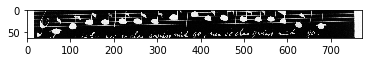

[273, 897, 1110, 1218, 228, 1218, 955, 1218, 77, 1218, 395, 1218, 472, 1218, 1107, 1218, 708, 1218, 805, 1218, 432, 1218, 430, 1218, 630, 1218, 472, 1218, 1157, 1218, 399, 1218, 430, 1218, 1206, 1218, 1115, 1218, 624, 1218, 472, 1218, 955, 1218, 1207, 1218, 1089, 1218, 77, 1218, 87, 1218, 708, 1218, 367, 1218, 49, 1218, 466, 1218, 395, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[b-]', '*M6/8', '8fL', '8a', '8ccJ', '=', '8.ddL', '16ccJ', '8b-', '8aL', '8g', '8aJ', '=', '8.b-L', '16aJ', '8g', '8cL', '8d', '8eJ', '=', '8fL', '8f', '8fJ', '8a', '8.aL', '16ccJ', '=!:', '8ccL', '8cc', '8ccJ', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[b-]', '*M6/8', '8fL', '8a', '8ccJ', '=', '8.ddL', '16ccJ', '8b-', '8aL', '8g', '8aJ', '=', '8.b-L', '16aJ', '8g', '8cL', '8d', '8eJ', '=', '8fL', '8f', '8fJ', '8a', '8.aL', '16ccJ', '=!:', '8ccL', '8cc', '8ccJ', '*-']


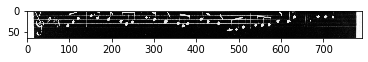

[273, 897, 1218, 430, 1218, 840, 1218, 978, 1218, 472, 1218, 471, 1218, 520, 1218, 699, 1218, 1207, 1218, 1213, 1218, 399, 1218, 472, 1218, 432, 1218, 77, 1218, 630, 1218, 568, 1218, 1196, 1218, 800, 1218, 472, 1218, 32, 1218, 430, 1218, 1067, 1218, 77, 1218, 87, 1218, 708, 1218, 1013, 1218, 432, 1218, 77, 1218, 630, 1218, 568, 1218, 840, 1218, 1089, 1218, 472, 1218, 299, 1218, 326, 1218, 326, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8g', '8.gL', '16bJ', '=', '8bL', '8b', '8bJ', '8f', '8.fL', '16aJ', '=', '8aL', '8a', '8aJ', '8e', '8.eL', '16gJ', '=', '8gL', '8g', '8gJ', '8a', '8.aL', '16ccJ', '=:!', '8aL', '8a', '8aJ', '8e', '8.gL', '8fJ', '=', '4e', '8r', '8r', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '8g', '8.gL', '16bJ', '=', '8bL', '8b', '8bJ', '8f', '8.fL', '16aJ', '=', '8aL', '8a', '8aJ', '8e', '8.eL', '16gJ', '=', '8gL', '8g', '8gJ', '8a', '8.aL', '16ccJ', '=:!', '8aL', '8a', '8aJ', '8e', '8.gL', '8fJ', '=', '4e', '8r', '8r', '=', '*-']


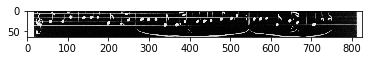

[273, 897, 1218, 868, 1218, 430, 1218, 472, 1218, 466, 1218, 466, 1218, 285, 1218, 285, 1218, 472, 1218, 54, 1218, 326, 1218, 430, 1218, 472, 1218, 466, 1218, 466, 1218, 285, 1218, 285, 1218, 472, 54, 1218, 326, 1218, 77, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*M2/4', '8g', '=', '8cc', '8cc', '8dd', '8dd', '=', '4ee', '8r', '8g', '=', '8cc', '8cc', '8dd', '8dd', '=', '4ee', '8r', '8a', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*M2/4', '8g', '=', '8cc', '8cc', '8dd', '8dd', '=', '4ee', '8r', '8g', '=', '8cc', '8cc', '8dd', '8dd', '=', '4ee', '8r', '8a', '=', '*-']


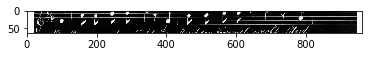

[273, 897, 1218, 1170, 1218, 1170, 1218, 1170, 1218, 552, 1218, 472, 1218, 182, 1218, 182, 1218, 182, 1218, 285, 1218, 472, 1218, 552, 1218, 552, 1218, 1170, 1218, 552, 1218, 472, 1218, 552, 1218, 285, 1218, 285, 1218, 430, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8gg', '8gg', '8gg', '8ee', '=', '8ff', '8ff', '8ff', '8dd', '=', '8ee', '8ee', '8gg', '8ee', '=', '8ee', '8dd', '8dd', '8g', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '8gg', '8gg', '8gg', '8ee', '=', '8ff', '8ff', '8ff', '8dd', '=', '8ee', '8ee', '8gg', '8ee', '=', '8ee', '8dd', '8dd', '8g', '=', '*-']


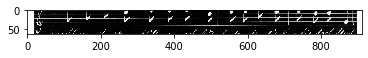

[273, 897, 1218, 466, 1218, 466, 1218, 285, 1218, 285, 1218, 472, 1218, 54, 1218, 182, 1218, 552, 1218, 472, 1218, 21, 1218, 472, 1218, 243, 1218, 326, 1218, 1013, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8cc', '8cc', '8dd', '8dd', '=', '4ee', '8ff', '8ee', '=', '2dd', '=', '4cc', '8r', '=:!', '*-']
Groundtruth: ['**kern', '*clefG2', '8cc', '8cc', '8dd', '8dd', '=', '4ee', '8ff', '8ee', '=', '2dd', '=', '4cc', '8r', '=:!', '*-']


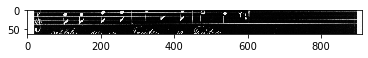

[273, 897, 1218, 109, 1218, 109, 1218, 992, 1218, 912, 1218, 243, 1218, 1007, 1218, 622, 1218, 472, 1218, 314, 336, 1218, 929, 1218, 51, 1218, 472, 1218, 54, 1218, 1175, 1218, 929, 1218, 1175, 1218, 196, 1218, 54, 1218, 1170, 1218, 54, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '4g', '4g', '4a', '4b', '4cc', '(4.dd', '4dd)', '=', '4ccc', '8bb', '8aa', '4gg', '=', '4ee', '4ff', '8aa', '4ff', '4dd', '4ee', '8gg', '4ee', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '4g', '4g', '4a', '4b', '4cc', '(4.dd', '4dd)', '=', '4ccc', '8bb', '8aa', '4gg', '=', '4ee', '4ff', '8aa', '4ff', '4dd', '4ee', '8gg', '4ee', '=', '*-']


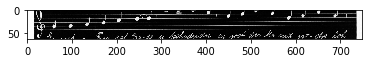

[273, 897, 1218, 466, 1218, 623, 1218, 472, 1218, 182, 1218, 623, 1218, 472, 1218, 520, 1218, 824, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8cc', '4.dd', '=', '8ff', '4.dd', '=', '8b', '4.cc', '*-']
Groundtruth: ['**kern', '*clefG2', '8cc', '4.dd', '=', '8ff', '4.dd', '=', '8b', '4.cc', '*-']


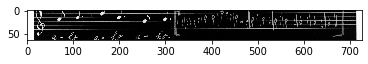

[273, 897, 1218, 228, 1218, 88, 1218, 472, 1218, 109, 1218, 430, 1218, 466, 1218, 520, 1218, 77, 1218, 472, 1218, 109, 1218, 430, 1218, 299, 1218, 88, 1218, 472, 1218, 148, 1218, 531, 1218, 77, 1218, 466, 1218, 520, 1218, 77, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*M6/8', '8c', '=', '4g', '8g', '8cc', '8b', '8a', '=', '4g', '8g', '4e', '8c', '=', '8.a', '16a', '8a', '8cc', '8b', '8a', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*M6/8', '8c', '=', '4g', '8g', '8cc', '8b', '8a', '=', '4g', '8g', '4e', '8c', '=', '8.a', '16a', '8a', '8cc', '8b', '8a', '=', '*-']


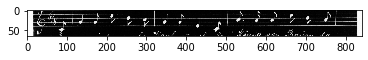

[273, 897, 1218, 984, 1218, 859, 1218, 430, 1218, 299, 1218, 367, 1218, 430, 1218, 472, 1218, 430, 1218, 430, 1218, 1207, 1218, 385, 1218, 77, 1218, 472, 1218, 148, 1218, 859, 1218, 430, 1218, 299, 1218, 1013, 1218, 859, 1218, 859, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8.g', '16g', '8g', '4e', '=!:', '8g', '=', '8g', '8g', '8f', '4d', '8a', '=', '8.a', '16g', '8g', '4e', '=:!', '16g', '16g', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '8.g', '16g', '8g', '4e', '=!:', '8g', '=', '8g', '8g', '8f', '4d', '8a', '=', '8.a', '16g', '8g', '4e', '=:!', '16g', '16g', '=', '*-']


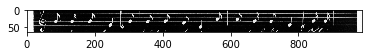

[273, 897, 1218, 775, 1218, 678, 1218, 472, 1218, 411, 1218, 395, 1218, 326, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '(4.g', '4.ee', '=', '4cc.L)', '8ccJ', '8r', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '(4.g', '4.ee', '=', '4cc.L)', '8ccJ', '8r', '==', '*-']


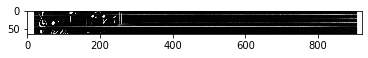

[273, 897, 173, 30, 1218, 1115, 1218, 1115, 1218, 472, 1218, 109, 1218, 912, 1218, 992, 1218, 472, 1218, 385, 1218, 195, 1218, 385, 1218, 472, 1218, 584, 1218, 571, 1218, 385, 1218, 472, 1218, 830, 1218, 738, 1218, 109, 1218, 472, 1218, 16, 1218, 992, 1218, 16, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '*M3/4', '8d', '8d', '=', '4g', '4b', '4a', '=', '4d', '4r', '4d', '=', '4c', '4.A', '4d', '=', '4B', '4F#', '4g', '=', '4f#', '4a', '4f#', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '*M3/4', '8d', '8d', '=', '4g', '4b', '4a', '=', '4d', '4r', '4d', '=', '4c', '4.A', '4d', '=', '4B', '4F#', '4g', '=', '4f#', '4a', '4f#', '=', '*-']


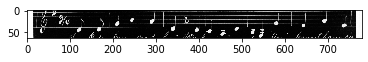

[273, 897, 173, 1218, 109, 1218, 912, 1218, 109, 1218, 472, 1218, 16, 1218, 992, 1218, 16, 1218, 472, 1218, 109, 1218, 912, 1218, 109, 1218, 472, 1218, 299, 1218, 299, 1218, 299, 1218, 472, 1218, 385, 1218, 195, 1218, 526, 1218, 859, 1218, 472, 1218, 992, 1218, 992, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '4g', '4b', '4g', '=', '4f#', '4a', '4f#', '=', '4g', '4b', '4g', '=', '4e', '4e', '4e', '=', '4d', '4r', '8.b', '16g', '=', '4a', '4a', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '4g', '4b', '4g', '=', '4f#', '4a', '4f#', '=', '4g', '4b', '4g', '=', '4e', '4e', '4e', '=', '4d', '4r', '8.b', '16g', '=', '4a', '4a', '*-']


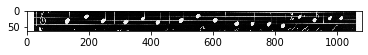

[273, 897, 173, 1218, 992, 1218, 472, 1218, 109, 1218, 195, 1218, 1013, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '4a', '=', '4g', '4r', '=:!', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '4a', '=', '4g', '4r', '=:!', '*-']


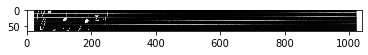

[273, 897, 1218, 1110, 1218, 868, 1218, 220, 1218, 399, 1218, 472, 1218, 560, 1218, 430, 1218, 472, 1218, 109, 1218, 432, 1218, 395, 1218, 472, 1218, 824, 1218, 805, 1218, 472, 1218, 750, 1218, 77, 1218, 77, 1218, 472, 1218, 992, 1218, 109, 1218, 472, 1218, 557, 1218, 60, 1218, 466, 1218, 805, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[b-]', '*M2/4', '16fL', '16aJ', '=', '4.a', '8g', '=', '4g', '8aL', '8ccJ', '=', '4.cc', '8b-', '=', '4b-', '8a', '8a', '=', '4a', '4g', '=', '(8.cc', '16dd)', '8cc', '8b-', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[b-]', '*M2/4', '16fL', '16aJ', '=', '4.a', '8g', '=', '4g', '8aL', '8ccJ', '=', '4.cc', '8b-', '=', '4b-', '8a', '8a', '=', '4a', '4g', '=', '(8.cc', '16dd)', '8cc', '8b-', '=', '*-']


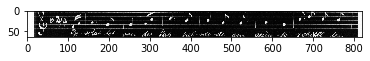

[273, 897, 1218, 560, 1218, 1207, 1218, 472, 1218, 196, 1218, 196, 1218, 472, 1218, 824, 1218, 520, 1218, 472, 1218, 15, 1218, 859, 1218, 479, 1218, 859, 1218, 472, 1218, 243, 1218, 243, 1218, 472, 1218, 196, 1218, 196, 1218, 472, 1218, 824, 1218, 520, 1218, 472, 1218, 992, 1218, 109, 1218, 472, 1218, 992, 1218, 326, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '4.a', '8f', '=', '4dd', '4dd', '=', '4.cc', '8b', '=', '(8.a', '16g', '8.a)', '16g', '=', '4cc', '4cc', '=', '4dd', '4dd', '=', '4.cc', '8b', '=', '4a', '4g', '=', '4a', '8r', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '4.a', '8f', '=', '4dd', '4dd', '=', '4.cc', '8b', '=', '(8.a', '16g', '8.a)', '16g', '=', '4cc', '4cc', '=', '4dd', '4dd', '=', '4.cc', '8b', '=', '4a', '4g', '=', '4a', '8r', '==', '*-']


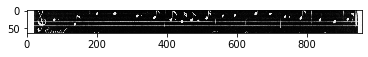

[273, 897, 1218, 847, 1218, 30, 1218, 16, 1218, 75, 1218, 430, 1218, 472, 1218, 912, 1218, 560, 1218, 29, 1218, 472, 1218, 912, 1218, 992, 1218, 299, 1218, 472, 1218, 1134, 1218, 195, 1218, 472, 1218, 196, 1218, 623, 1218, 520, 1218, 472, 1218, 912, 1218, 560, 1218, 29, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#c#]', '*M3/4', '4f#', '4.f#', '8g', '=', '4b', '4.a', '8f#', '=', '4b', '4a', '4e', '=', '2f#', '4r', '=', '4dd', '4.dd', '8b', '=', '4b', '4.a', '8f#', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#c#]', '*M3/4', '4f#', '4.f#', '8g', '=', '4b', '4.a', '8f#', '=', '4b', '4a', '4e', '=', '2f#', '4r', '=', '4dd', '4.dd', '8b', '=', '4b', '4.a', '8f#', '=', '*-']


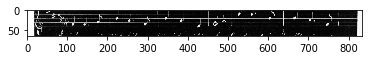

[273, 897, 1218, 847, 1218, 992, 1218, 109, 1218, 299, 1218, 472, 1218, 1134, 1218, 195, 1218, 472, 1218, 196, 1218, 889, 1218, 650, 1218, 119, 1218, 699, 1218, 472, 1218, 912, 1218, 560, 1218, 29, 1218, 472, 1218, 992, 1218, 32, 1218, 573, 1218, 32, 1218, 624, 1218, 472, 1218, 951, 1218, 195, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#c#]', '4a', '4g', '4e', '=', '2f#', '4r', '=', '4dd', '8eeL', '8ddJ', '8cc#L', '8bJ', '=', '4b', '4.a', '8f#', '=', '4a', '8gL', '8f#J', '8gL', '8eJ', '=', '2d', '4r', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#c#]', '4a', '4g', '4e', '=', '2f#', '4r', '=', '4dd', '8eeL', '8ddJ', '8cc#L', '8bJ', '=', '4b', '4.a', '8f#', '=', '4a', '8gL', '8f#J', '8gL', '8eJ', '=', '2d', '4r', '==', '*-']


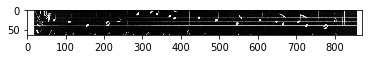

[273, 897, 173, 1218, 962, 1218, 469, 1218, 337, 1218, 472, 1218, 520, 1218, 77, 1218, 77, 1218, 472, 1218, 430, 1218, 520, 1218, 520, 1218, 472, 1218, 285, 1218, 77, 1218, 77, 1218, 472, 1218, 196, 1218, 1155, 1218, 708, 1218, 472, 1218, 520, 1218, 77, 1218, 77, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '*M3/8', '16b', '16cc', '=', '8b', '8a', '8a', '=', '8g', '8b', '8b', '=', '8dd', '8a', '8a', '=', '4dd', '16bL', '16ccJ', '=', '8b', '8a', '8a', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '*M3/8', '16b', '16cc', '=', '8b', '8a', '8a', '=', '8g', '8b', '8b', '=', '8dd', '8a', '8a', '=', '4dd', '16bL', '16ccJ', '=', '8b', '8a', '8a', '=', '*-']


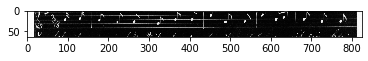

[273, 897, 173, 1218, 430, 1218, 520, 1218, 520, 1218, 472, 1218, 552, 1218, 285, 1218, 18, 1218, 978, 1218, 472, 1218, 109, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '8g', '8b', '8b', '=', '8ee', '8dd', '16aL', '16bJ', '=', '4g', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '8g', '8b', '8b', '=', '8ee', '8dd', '16aL', '16bJ', '=', '4g', '==', '*-']


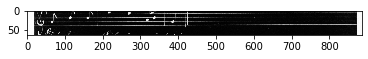

[273, 897, 1218, 847, 1218, 868, 1218, 385, 1218, 385, 1218, 472, 1218, 109, 1218, 109, 1218, 472, 1218, 16, 1218, 992, 1218, 472, 1218, 951, 1218, 472, 1218, 1169, 1218, 1056, 1218, 992, 1218, 472, 1218, 992, 1218, 992, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#c#]', '*M2/4', '4d', '4d', '=', '4g', '4g', '=', '4f#', '4a', '=', '2d', '=', '(8d', '4a)', '4a', '=', '4a', '4a', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#c#]', '*M2/4', '4d', '4d', '=', '4g', '4g', '=', '4f#', '4a', '=', '2d', '=', '(8d', '4a)', '4a', '=', '4a', '4a', '=', '*-']


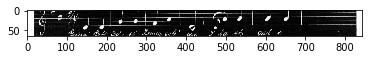

[273, 897, 1218, 847, 1218, 109, 1218, 520, 1218, 520, 1218, 472, 1218, 951, 1218, 367, 1218, 1169, 1218, 240, 1218, 385, 1218, 472, 1218, 71, 1218, 71, 1218, 472, 1218, 912, 1218, 196, 1218, 472, 1218, 724, 1218, 472, 1218, 992, 1218, 471, 1218, 1025, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#c#]', '4g', '8b', '8b', '=', '2d', '=!:', '(8d', '4d)', '4d', '=', '4cc#', '4cc#', '=', '4b', '4dd', '=', '2cc#', '=', '4a', '8bL', '4cc#J', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#c#]', '4g', '8b', '8b', '=', '2d', '=!:', '(8d', '4d)', '4d', '=', '4cc#', '4cc#', '=', '4b', '4dd', '=', '2cc#', '=', '4a', '8bL', '4cc#J', '=', '*-']


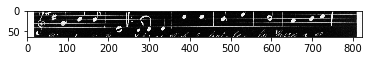

[273, 897, 1218, 847, 1218, 385, 1218, 595, 1218, 828, 1218, 472, 1218, 109, 1218, 109, 1218, 472, 1218, 114, 1218, 1013, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#c#]', '4d', '(4f#L', '4aJ)', '=', '4g', '4g', '=', '2g', '=:!', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#c#]', '4d', '(4f#L', '4aJ)', '=', '4g', '4g', '=', '2g', '=:!', '*-']


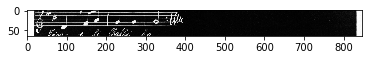

[273, 897, 1218, 847, 1218, 30, 1218, 77, 1218, 77, 1218, 472, 1218, 29, 1218, 77, 1218, 196, 1218, 29, 1218, 29, 1218, 472, 1218, 822, 1218, 1055, 1218, 109, 1218, 148, 1218, 531, 1218, 472, 1218, 706, 1218, 469, 1218, 77, 1218, 77, 1218, 1170, 1218, 487, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#c#]', '*M3/4', '8a', '8a', '=', '8f#', '8a', '4dd', '8f#', '8f#', '=', '8.e', '16e', '4g', '8.a', '16a', '=', '8.cc#', '16b', '8a', '8a', '8gg', '8dd/', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#c#]', '*M3/4', '8a', '8a', '=', '8f#', '8a', '4dd', '8f#', '8f#', '=', '8.e', '16e', '4g', '8.a', '16a', '=', '8.cc#', '16b', '8a', '8a', '8gg', '8dd/', '=', '*-']


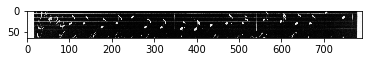

[273, 897, 1218, 847, 1218, 196, 1218, 195, 1218, 77, 1218, 77, 1218, 472, 1218, 29, 1218, 77, 1218, 196, 1218, 29, 1218, 29, 1218, 472, 1218, 568, 1218, 568, 1218, 109, 1218, 148, 1218, 531, 1218, 472, 1218, 706, 1218, 469, 1218, 77, 1218, 77, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#c#]', '4dd', '4r', '8a', '8a', '=', '8f#', '8a', '4dd', '8f#', '8f#', '=', '8e', '8e', '4g', '8.a', '16a', '=', '8.cc#', '16b', '8a', '8a', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#c#]', '4dd', '4r', '8a', '8a', '=', '8f#', '8a', '4dd', '8f#', '8f#', '=', '8e', '8e', '4g', '8.a', '16a', '=', '8.cc#', '16b', '8a', '8a', '*-']


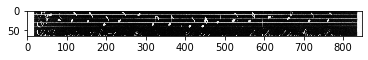

[273, 897, 1218, 847, 1218, 277, 1218, 516, 1218, 472, 1218, 196, 1218, 195, 1218, 77, 1218, 77, 1218, 472, 1218, 471, 1218, 58, 1218, 54, 1218, 196, 1218, 472, 1218, 119, 1218, 573, 1218, 560, 1218, 285, 1218, 472, 1218, 133, 1218, 978, 1218, 77, 1218, 516, 1218, 472, 1218, 552, 1218, 77, 1218, 472, 1218, 21, 1218, 77, 1218, 77, 1218, 472, 1218, 471, 1218, 58, 1218, 54, 1218, 196, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#c#]', '8ff#', '8cc#', '=', '4dd', '4r', '8a', '8a', '=', '8bL', '8ff#J', '4ee', '4dd', '=', '8cc#L', '8f#J', '4.a', '8dd', '=', '8.cc#L', '16bJ', '8a', '8cc#', '=', '8ee', '8a', '=', '2dd', '8a', '8a', '=', '8bL', '8ff#J', '4ee', '4dd', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#c#]', '8ff#', '8cc#', '=', '4dd', '4r', '8a', '8a', '=', '8bL', '8ff#J', '4ee', '4dd', '=', '8cc#L', '8f#J', '4.a', '8dd', '=', '8.cc#L', '16bJ', '8a', '8cc#', '=', '8ee', '8a', '=', '2dd', '8a', '8a', '=', '8bL', '8ff#J', '4ee', '4dd', '=', '*-']


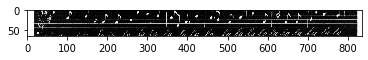

[273, 897, 1218, 847, 1218, 119, 1218, 409, 1218, 560, 1218, 285, 1218, 472, 1218, 706, 1218, 469, 1218, 77, 1218, 285, 1218, 277, 1218, 516, 1218, 472, 1218, 21, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#c#]', '8cc#L', '16f#J', '4.a', '8dd', '=', '8.cc#', '16b', '8a', '8dd', '8ff#', '8cc#', '=', '2dd', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#c#]', '8cc#L', '16f#J', '4.a', '8dd', '=', '8.cc#', '16b', '8a', '8dd', '8ff#', '8cc#', '=', '2dd', '=', '*-']


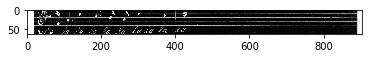

[273, 897, 1218, 86, 1218, 430, 1218, 859, 1218, 859, 1218, 430, 1218, 430, 1218, 243, 1218, 243, 1218, 472, 1218, 568, 1218, 1055, 1218, 1055, 1218, 568, 1218, 568, 1218, 109, 1218, 195, 1218, 472, 1218, 787, 1218, 769, 1218, 769, 1218, 1207, 1218, 1207, 1218, 77, 1218, 77, 1218, 77, 1218, 77, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*M4/4', '8g', '16g', '16g', '8g', '8g', '4cc', '4cc', '=', '8e', '16e', '16e', '8e', '8e', '4g', '4r', '=', '8.f', '16f', '16f', '8f', '8f', '8a', '8a', '8a', '8a', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*M4/4', '8g', '16g', '16g', '8g', '8g', '4cc', '4cc', '=', '8e', '16e', '16e', '8e', '8e', '4g', '4r', '=', '8.f', '16f', '16f', '8f', '8f', '8a', '8a', '8a', '8a', '=', '*-']


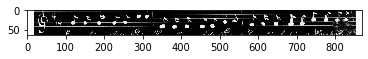

[273, 897, 1218, 86, 1218, 430, 1218, 859, 1218, 859, 1218, 430, 1218, 430, 1218, 299, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*M4/4', '8g', '16g', '16g', '8g', '8g', '4e', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '*M4/4', '8g', '16g', '16g', '8g', '8g', '4e', '==', '*-']


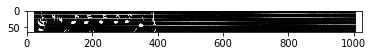

[273, 897, 1218, 228, 1218, 1115, 1218, 472, 1218, 109, 1218, 520, 1218, 285, 1218, 520, 1218, 430, 1218, 472, 1218, 226, 1218, 1037, 1218, 992, 1218, 1115, 1218, 472, 1218, 430, 1218, 430, 1218, 520, 1218, 935, 1218, 760, 1218, 430, 1218, 472, 1218, 226, 1218, 1037, 1218, 992, 1218, 586, 1218, 465, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*M6/8', '8d', '=', '4g', '8b', '8dd', '8b', '8g', '=', '(4f#', '8g)', '4a', '8d', '=', '8g', '8g', '8b', '(8ddL', '8bJ)', '8g', '=', '(4f#', '8g)', '4a', '(16gL', '16bJ)', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*M6/8', '8d', '=', '4g', '8b', '8dd', '8b', '8g', '=', '(4f#', '8g)', '4a', '8d', '=', '8g', '8g', '8b', '(8ddL', '8bJ)', '8g', '=', '(4f#', '8g)', '4a', '(16gL', '16bJ)', '=', '*-']


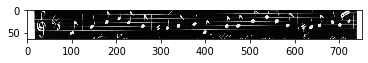

[273, 897, 1218, 744, 1218, 469, 1218, 430, 1218, 992, 1218, 935, 1218, 688, 1218, 1192, 1218, 737, 1218, 472, 1218, 381, 1218, 885, 1218, 1134, 1218, 586, 1218, 465, 1218, 472, 1218, 196, 1218, 520, 1218, 430, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8.dd', '16b', '8g', '4a', '(8ddL', '8ccJ)', '(8bL-', '8aJ)', '=', '(4g', '8a)', '2f#', '(16gL', '16bJ)', '=', '4dd', '8b', '8g', '*-']
Groundtruth: ['**kern', '*clefG2', '8.dd', '16b', '8g', '4a', '(8ddL', '8ccJ)', '(8bL-', '8aJ)', '=', '(4g', '8a)', '2f#', '(16gL', '16bJ)', '=', '4dd', '8b', '8g', '*-']


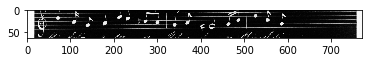

[273, 897, 1218, 992, 1218, 935, 1218, 688, 1218, 1209, 1218, 737, 1218, 114, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '4a', '(8ddL', '8ccJ)', '(8b-L', '8aJ)', '2g', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '4a', '(8ddL', '8ccJ)', '(8b-L', '8aJ)', '2g', '==', '*-']


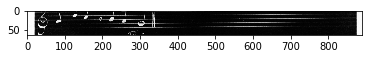

[273, 897, 1110, 1218, 868, 1218, 1207, 1218, 472, 1218, 77, 1218, 430, 1218, 1207, 1218, 77, 1218, 472, 1218, 805, 1218, 805, 1218, 326, 1218, 805, 1218, 472, 1218, 984, 1218, 859, 1218, 664, 1218, 993, 1218, 472, 1218, 805, 1218, 77, 1218, 326, 1218, 77, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[b-]', '*M2/4', '8f', '=', '8a', '8g', '8f', '8a', '=', '8b-', '8b-', '8r', '8b-', '=', '8.g', '16g', '8.cc', '16b-', '=', '8b-', '8a', '8r', '8a', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[b-]', '*M2/4', '8f', '=', '8a', '8g', '8f', '8a', '=', '8b-', '8b-', '8r', '8b-', '=', '8.g', '16g', '8.cc', '16b-', '=', '8b-', '8a', '8r', '8a', '=', '*-']


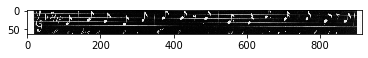

[273, 897, 1218, 984, 1218, 531, 1218, 430, 1218, 466, 1218, 472, 1218, 596, 1218, 708, 1218, 842, 1218, 708, 1218, 466, 1218, 77, 1218, 472, 1218, 984, 1218, 531, 1218, 430, 1218, 466, 1218, 472, 1218, 596, 1218, 708, 1218, 842, 1218, 708, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8.g', '16a', '8g', '8cc', '=', '16bnL', '16ccJ', '16ddL', '16ccJ', '8cc', '8a', '=', '8.g', '16a', '8g', '8cc', '=', '16bnL', '16ccJ', '16ddL', '16ccJ', '*-']
Groundtruth: ['**kern', '*clefG2', '8.g', '16a', '8g', '8cc', '=', '16bnL', '16ccJ', '16ddL', '16ccJ', '8cc', '8a', '=', '8.g', '16a', '8g', '8cc', '=', '16bnL', '16ccJ', '16ddL', '16ccJ', '*-']


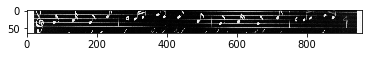

[273, 897, 1218, 243, 1218, 326, 1218, 466, 1218, 472, 1218, 843, 1218, 337, 1218, 77, 1218, 285, 1218, 472, 1218, 53, 1218, 113, 1218, 203, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '4cc', '8r', '8cc', '=', '8.ff', '16cc', '8a', '8dd', '=', '16.ccL', '16eJ', '4f', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '4cc', '8r', '8cc', '=', '8.ff', '16cc', '8a', '8dd', '=', '16.ccL', '16eJ', '4f', '==', '*-']


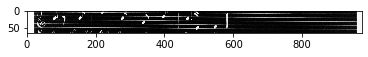

[273, 897, 1218, 962, 1218, 88, 1218, 472, 1218, 584, 1218, 568, 1218, 472, 1218, 775, 1218, 472, 1218, 46, 1218, 430, 1218, 472, 1218, 203, 1218, 430, 1218, 472, 1218, 84, 1218, 472, 1218, 1136, 1218, 326, 1218, 88, 1218, 472, 1218, 584, 1218, 568, 1218, 472, 1218, 775, 1218, 472, 1218, 46, 1218, 430, 1218, 472, 1218, 109, 1218, 430, 1218, 472, 1218, 351, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*M3/8', '8c', '=', '4c', '8e', '=', '(4.g', '=', '4g)', '8g', '=', '4f', '8g', '=', '(4.e', '=', '8e)', '8r', '8c', '=', '4c', '8e', '=', '(4.g', '=', '4g)', '8g', '=', '4g', '8g', '=', '4.e', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*M3/8', '8c', '=', '4c', '8e', '=', '(4.g', '=', '4g)', '8g', '=', '4f', '8g', '=', '(4.e', '=', '8e)', '8r', '8c', '=', '4c', '8e', '=', '(4.g', '=', '4g)', '8g', '=', '4g', '8g', '=', '4.e', '=', '*-']


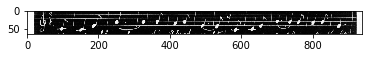

[273, 897, 1218, 385, 1218, 1115, 1218, 472, 1218, 424, 1218, 472, 1218, 109, 1218, 1115, 1218, 472, 1218, 886, 1218, 472, 1218, 442, 1218, 326, 1218, 88, 1218, 472, 1218, 584, 1218, 466, 1218, 472, 1218, 109, 1218, 568, 1218, 472, 1218, 203, 1218, 1115, 1218, 472, 1218, 584, 1218, 326, 1218, 472, 1218, 353, 1218, 951, 1218, 951, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '4d', '8d', '=', '4.d', '=', '4g', '8d', '=', '(4.d', '=', '8d)', '8r', '8c', '=', '4c', '8cc', '=', '4g', '8e', '=', '4f', '8d', '=', '4c', '8r', '=', '*M2/2', '2d', '2d', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '4d', '8d', '=', '4.d', '=', '4g', '8d', '=', '(4.d', '=', '8d)', '8r', '8c', '=', '4c', '8cc', '=', '4g', '8e', '=', '4f', '8d', '=', '4c', '8r', '=', '*M2/2', '2d', '2d', '==', '*-']


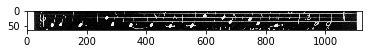

[273, 897, 173, 1218, 868, 1218, 520, 1218, 1115, 1218, 984, 1218, 469, 1218, 472, 1218, 552, 1218, 285, 1218, 992, 1218, 472, 1218, 29, 1218, 1115, 1218, 568, 1218, 29, 1218, 472, 1218, 430, 1218, 520, 1218, 430, 1218, 472, 1218, 520, 1218, 1115, 1218, 430, 1218, 520, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '*M2/4', '8b', '8d', '8.g', '16b', '=', '8ee', '8dd', '4a', '=', '8f#', '8d', '8e', '8f#', '=', '8g', '8b', '8g', '=', '8b', '8d', '8g', '8b', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '*M2/4', '8b', '8d', '8.g', '16b', '=', '8ee', '8dd', '4a', '=', '8f#', '8d', '8e', '8f#', '=', '8g', '8b', '8g', '=', '8b', '8d', '8g', '8b', '=', '*-']


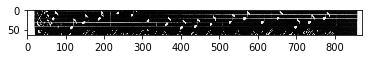

[273, 897, 1218, 843, 1218, 209, 1218, 912, 1218, 472, 1218, 1207, 1218, 1115, 1218, 568, 1218, 1207, 1218, 472, 1218, 430, 1218, 520, 1218, 109, 1218, 472, 1218, 664, 1218, 209, 1218, 552, 1218, 1170, 1218, 472, 1218, 744, 1218, 469, 1218, 912, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8.ff', '16dd', '4b', '=', '8f', '8d', '8e', '8f', '=', '8g', '8b', '4g', '=', '8.cc', '16dd', '8ee', '8gg', '=', '8.dd', '16b', '4b', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '8.ff', '16dd', '4b', '=', '8f', '8d', '8e', '8f', '=', '8g', '8b', '4g', '=', '8.cc', '16dd', '8ee', '8gg', '=', '8.dd', '16b', '4b', '=', '*-']


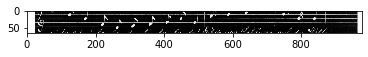

[273, 897, 1218, 77, 1218, 77, 1218, 466, 1218, 1207, 1218, 472, 1218, 430, 1218, 520, 1218, 109, 1218, 472, 1218, 664, 1218, 209, 1218, 1104, 1218, 337, 1218, 472, 1218, 520, 1218, 471, 1218, 708, 1218, 196, 1218, 472, 1218, 148, 1218, 469, 1218, 466, 1218, 1207, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8a', '8a', '8cc', '8f', '=', '8g', '8b', '4g', '=', '8.cc', '16dd', '8.ee', '16cc', '=', '8b', '8bL', '16ccJ', '4dd', '=', '8.a', '16b', '8cc', '8f', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '8a', '8a', '8cc', '8f', '=', '8g', '8b', '4g', '=', '8.cc', '16dd', '8.ee', '16cc', '=', '8b', '8bL', '16ccJ', '4dd', '=', '8.a', '16b', '8cc', '8f', '=', '*-']


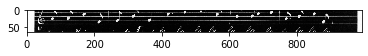

[273, 897, 1218, 430, 1218, 520, 1218, 109, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8g', '8b', '4g', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '8g', '8b', '4g', '==', '*-']


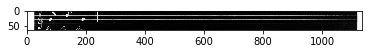

[273, 897, 1218, 847, 1218, 868, 1218, 971, 1218, 472, 1218, 424, 1218, 568, 1218, 472, 1218, 75, 1218, 1115, 1218, 472, 1218, 732, 1218, 29, 1218, 472, 1218, 299, 1218, 195, 1218, 472, 1218, 560, 1218, 430, 1218, 472, 1218, 16, 1218, 326, 1218, 77, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#c#]', '*M2/4', '8A', '=', '4.d', '8e', '=', '4.f#', '8d', '=', '4.g', '8f#', '=', '4e', '4r', '=', '4.a', '8g', '=', '4f#', '8r', '8a', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#c#]', '*M2/4', '8A', '=', '4.d', '8e', '=', '4.f#', '8d', '=', '4.g', '8f#', '=', '4e', '4r', '=', '4.a', '8g', '=', '4f#', '8r', '8a', '=', '*-']


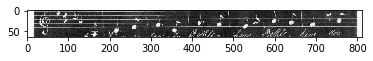

[273, 897, 1218, 847, 1218, 560, 1218, 29, 1218, 472, 1218, 555, 1218, 77, 1218, 472, 1218, 732, 1218, 29, 1218, 472, 1218, 299, 1218, 326, 1218, 29, 1218, 472, 1218, 75, 1218, 568, 1218, 472, 1218, 385, 1218, 326, 1218, 77, 1218, 472, 1218, 560, 1218, 123, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#c#]', '4.a', '8f#', '=', '4.b', '8a', '=', '4.g', '8f#', '=', '4e', '8r', '8f#', '=', '4.f#', '8e', '=', '4d', '8r', '8a', '=', '4.a', '8c#', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#c#]', '4.a', '8f#', '=', '4.b', '8a', '=', '4.g', '8f#', '=', '4e', '8r', '8f#', '=', '4.f#', '8e', '=', '4d', '8r', '8a', '=', '4.a', '8c#', '=', '*-']


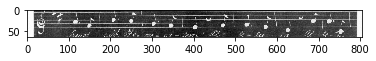

[273, 897, 1218, 847, 1218, 385, 1218, 326, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#c#]', '4d', '8r', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#c#]', '4d', '8r', '=', '*-']


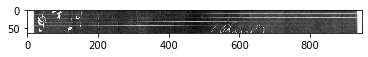

[273, 897, 1218, 30, 1218, 787, 1218, 469, 1218, 472, 1218, 351, 1218, 430, 1218, 137, 1218, 630, 1218, 1156, 1218, 472, 1218, 992, 1218, 109, 1218, 984, 1218, 469, 1218, 472, 1218, 623, 1218, 520, 1218, 1084, 1218, 466, 1218, 885, 1218, 472, 1218, 114, 1218, 664, 1218, 209, 1218, 472, 1218, 815, 1218, 431, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*M3/4', '8.f', '16b', '=', '4.e', '8g', '(8fL', '8aJ', '8cc)', '=', '4a', '4g', '8.g', '16b', '=', '4.dd', '8b', '(8dd', '8cc', '8a)', '=', '2g', '8.cc', '16dd', '=', '(4cc', '8b)', '*-']
Groundtruth: ['**kern', '*clefG2', '*M3/4', '8.f', '16b', '=', '4.e', '8g', '(8fL', '8aJ', '8cc)', '=', '4a', '4g', '8.g', '16b', '=', '4.dd', '8b', '(8dd', '8cc', '8a)', '=', '2g', '8.cc', '16dd', '=', '(4cc', '8b)', '*-']


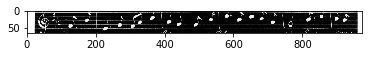

[273, 897, 1218, 77, 1218, 430, 1218, 1207, 1218, 472, 1218, 992, 1218, 992, 1218, 2, 1218, 699, 1218, 77, 1218, 472, 1218, 732, 1218, 466, 1218, 196, 1218, 469, 1218, 472, 1218, 243, 1218, 195, 1218, 1104, 1218, 209, 1218, 472, 1218, 664, 1218, 469, 1218, 15, 1218, 414, 1218, 209, 1218, 469, 1218, 472, 248, 1218]
Prediction: ['**kern', '*clefG2', '8a', '8g', '8f', '=', '4a', '4a', '8ddL', '8bJ', '8a', '=', '4.g', '8cc', '4dd', '16b', '=', '4cc', '4r', '8.ee', '16dd', '=', '8.cc', '16b', '(8.a', '16ee)', '16dd', '16b', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '8a', '8g', '8f', '=', '4a', '4a', '8ddL', '8bJ', '8a', '=', '4.g', '8cc', '4dd', '16b', '=', '4cc', '4r', '8.ee', '16dd', '=', '8.cc', '16b', '(8.a', '16ee)', '16dd', '16b', '=', '*-']


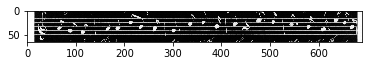

[273, 897, 1218, 729, 1218, 386, 1218, 630, 1218, 431, 1218, 472, 1218, 664, 1218, 337, 1218, 664, 1218, 337, 1218, 946, 1218, 1037, 1218, 466, 1218, 472, 1218, 1104, 1218, 589, 1218, 1104, 1218, 589, 1218, 24, 1218, 1156, 1218, 552, 1218, 472, 1218, 61, 363, 1218, 985, 1218, 202, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '2cc', '(8gL', '8aJ', '8b)', '=', '8.cc', '16cc', '8.cc', '16cc', '(16cc', '8g)', '8cc', '=', '8.ee', '16ee', '8.ee', '16ee', '(8ee', '8cc)', '8ee', '=', '8.gg', '16gg', '8ggL', '8ffJ', '*-']
Groundtruth: ['**kern', '*clefG2', '2cc', '(8gL', '8aJ', '8b)', '=', '8.cc', '16cc', '8.cc', '16cc', '(16cc', '8g)', '8cc', '=', '8.ee', '16ee', '8.ee', '16ee', '(8ee', '8cc)', '8ee', '=', '8.gg', '16gg', '8ggL', '8ffJ', '*-']


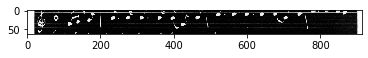

[273, 897, 1218, 49, 1218, 624, 1218, 432, 1218, 1067, 1218, 584, 1066, 1218, 30, 1218, 984, 1218, 337, 1218, 351, 1218, 430, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8ccL', '8eJ', '8aL', '8gJ', '4c', '==', '*M3/4', '8.g', '16cc', '4.e', '8g', '*-']
Groundtruth: ['**kern', '*clefG2', '8ccL', '8eJ', '8aL', '8gJ', '4c', '==', '*M3/4', '8.g', '16cc', '4.e', '8g', '*-']


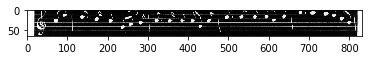

[273, 897, 1218, 109, 1218, 472, 1218, 992, 1218, 109, 1218, 203, 1218, 385, 1218, 472, 1218, 823, 1218, 109, 1218, 195, 1218, 472, 1218, 299, 1218, 385, 1218, 299, 1218, 385, 1218, 472, 1218, 299, 1218, 203, 1218, 109, 1218, 109, 1218, 472, 1218, 992, 1218, 109, 1218, 203, 1218, 385, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '4g', '=', '4a', '4g', '4f', '4d', '=', '2f', '4g', '4r', '=', '4e', '4d', '4e', '4d', '=', '4e', '4f', '4g', '4g', '=', '4a', '4g', '4f', '4d', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '4g', '=', '4a', '4g', '4f', '4d', '=', '2f', '4g', '4r', '=', '4e', '4d', '4e', '4d', '=', '4e', '4f', '4g', '4g', '=', '4a', '4g', '4f', '4d', '=', '*-']


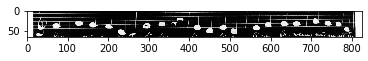

[273, 897, 1218, 823, 1218, 114, 1218, 472, 1218, 38, 1218, 195, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '2f', '2g', '=', '2e', '4r', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '2f', '2g', '=', '2e', '4r', '=', '*-']


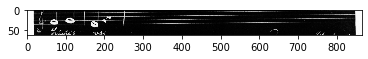

[273, 897, 1110, 1218, 228, 1218, 1207, 1218, 472, 1218, 992, 1218, 77, 1218, 417, 1218, 1019, 1218, 77, 1218, 472, 1218, 840, 1218, 800, 1218, 430, 1218, 109, 1218, 430, 1218, 472, 1218, 992, 1218, 77, 1218, 243, 1218, 77, 1218, 472, 1218, 732, 1218, 195, 1218, 77, 1218, 472, 1218, 1157, 1218, 418, 1218, 2, 1218, 285, 1218, 466, 1218, 524, 1218, 472, 1218, 87, 1218, 708, 1218, 466, 1218, 243, 1218, 77, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[b-]', '*M6/8', '8f', '=', '4a', '8a', '8.ccL', '16b-J', '8a', '=', '8.gL', '16gJ', '8g', '4g', '8g', '=', '4a', '8a', '4cc', '8a', '=', '4.g', '4r', '8a', '=', '8.b-L', '16ddJ', '8ddL', '8dd', '8cc', '8b-J', '=', '8.aL', '16ccJ', '8cc', '4cc', '8a', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[b-]', '*M6/8', '8f', '=', '4a', '8a', '8.ccL', '16b-J', '8a', '=', '8.gL', '16gJ', '8g', '4g', '8g', '=', '4a', '8a', '4cc', '8a', '=', '4.g', '4r', '8a', '=', '8.b-L', '16ddJ', '8ddL', '8dd', '8cc', '8b-J', '=', '8.aL', '16ccJ

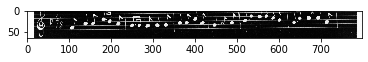

[273, 897, 1110, 1218, 840, 1218, 708, 1218, 466, 1218, 243, 1218, 805, 1218, 472, 1218, 992, 1218, 182, 1218, 243, 1218, 77, 1218, 472, 1218, 1157, 1218, 418, 1218, 2, 1218, 285, 1218, 466, 1218, 524, 1218, 472, 1218, 87, 1218, 708, 1218, 466, 1218, 243, 1218, 77, 1218, 472, 1218, 87, 1218, 708, 1218, 466, 1218, 243, 1218, 805, 1218, 472, 1218, 560, 1218, 195, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[b-]', '8.gL', '16ccJ', '8cc', '4cc', '8b-', '=', '4a', '8ff', '4cc', '8a', '=', '8.b-L', '16ddJ', '8ddL', '8dd', '8cc', '8b-J', '=', '8.aL', '16ccJ', '8cc', '4cc', '8a', '=', '8.aL', '16ccJ', '8cc', '4cc', '8b-', '=', '4.a', '4r', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[b-]', '8.gL', '16ccJ', '8cc', '4cc', '8b-', '=', '4a', '8ff', '4cc', '8a', '=', '8.b-L', '16ddJ', '8ddL', '8dd', '8cc', '8b-J', '=', '8.aL', '16ccJ', '8cc', '4cc', '8a', '=', '8.aL', '16ccJ', '8cc', '4cc', '8b-', '=', '4.a', '4r', '==', '*-']


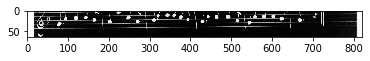

[273, 897, 1110, 1218, 243, 1218, 472, 1218, 1157, 1218, 399, 1218, 32, 1218, 77, 1218, 805, 1218, 395, 1218, 692, 1218, 688, 1218, 472, 1218, 54, 1218, 243, 1218, 87, 1218, 708, 1218, 432, 1218, 395, 1218, 472, 1218, 889, 1218, 630, 1218, 109, 1218, 195, 1218, 243, 1218, 472, 1218, 1157, 1218, 399, 1218, 32, 1218, 77, 1218, 805, 1218, 395, 1218, 692, 1218, 688, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[b-]', '4cc', '=', '8.b-L', '16aJ', '8gL', '8a', '8b-', '8ccJ', '(8aL', '8ccJ)', '=', '4ee', '4cc', '8.aL', '16ccJ', '8aL', '8ccJ', '=', '8eeL', '8aJ', '4g', '4r', '4cc', '=', '8.b-L', '16aJ', '8gL', '8a', '8b-', '8ccJ', '(8aL', '8ccJ)', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[b-]', '4cc', '=', '8.b-L', '16aJ', '8gL', '8a', '8b-', '8ccJ', '(8aL', '8ccJ)', '=', '4ee', '4cc', '8.aL', '16ccJ', '8aL', '8ccJ', '=', '8eeL', '8aJ', '4g', '4r', '4cc', '=', '8.b-L', '16aJ', '8gL', '8a', '8b-', '8ccJ', '(8aL', '8ccJ)', '=', '*-']


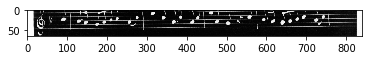

[273, 897, 1110, 1218, 678, 1218, 889, 1218, 857, 1218, 230, 1218, 243, 1218, 472, 1218, 2, 1218, 395, 1218, 243, 1218, 466, 1218, 472, 1218, 432, 1218, 395, 1218, 184, 1218, 1135, 1218, 552, 1218, 650, 1218, 472, 1218, 676, 1218, 737, 1218, 196, 1218, 195, 1218, 243, 1218, 472, 1218, 432, 1218, 395, 1218, 196, 1218, 243, 1218, 432, 1218, 395, 1218, 472, 1218, 560, 1218, 195, 1218, 195, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[b-]', '4.ee', '8eeL', '8ee-', '8#ccJ', '4cc', '=', '8ddL', '8ccJ', '4cc', '8cc', '=', '8aL', '8ccJ', '4.aa', '8ffL', '8ee', '8ddJ', '=', '(8ccL', '8aJ)', '4dd', '4r', '4cc', '=', '8aL', '8ccJ', '4dd', '4cc', '8aL', '8ccJ', '=', '4.a', '4r', '4r', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[b-]', '4.ee', '8eeL', '8ee-', '8#ccJ', '4cc', '=', '8ddL', '8ccJ', '4cc', '8cc', '=', '8aL', '8ccJ', '4.aa', '8ffL', '8ee', '8ddJ', '=', '(8ccL', '8aJ)', '4dd', '4r', '4cc', '=', '8aL', '8ccJ', '4dd', '4cc', '8aL', '8ccJ', '=', '4.a', '4r', '4r', 

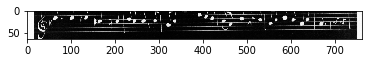

[273, 897, 173, 1218, 645, 1218, 109, 1218, 984, 1218, 859, 1218, 472, 1218, 109, 1218, 385, 1218, 472, 1218, 526, 1218, 469, 1218, 520, 1218, 520, 1218, 472, 1218, 912, 1218, 109, 1218, 367, 1218, 912, 1218, 526, 1218, 466, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', 'M2/4', '4g', '8.g', '16g', '=', '4g', '4d', '=', '8.b', '16b', '8b', '8b', '=', '4b', '4g', '=!:', '4b', '8.b', '8cc', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', 'M2/4', '4g', '8.g', '16g', '=', '4g', '4d', '=', '8.b', '16b', '8b', '8b', '=', '4b', '4g', '=!:', '4b', '8.b', '8cc', '*-']


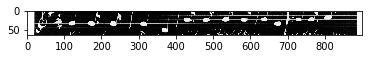

[273, 897, 173, 1218, 623, 1218, 520, 1218, 472, 1218, 243, 1218, 54, 1218, 472, 1218, 21, 1218, 472, 1218, 1062, 1218, 472, 1218, 783, 1218, 589, 1218, 472, 1218, 623, 1218, 520, 1218, 472, 1218, 243, 1218, 196, 1218, 472, 1218, 150, 1218, 1013, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '4.dd', '8b', '=', '4cc', '4ee', '=', '2dd', '=', '4bb', '=', '8.ff#', '16ee', '=', '4.dd', '8b', '=', '4cc', '4dd', '=', '2b', '=:!', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '4.dd', '8b', '=', '4cc', '4ee', '=', '2dd', '=', '4bb', '=', '8.ff#', '16ee', '=', '4.dd', '8b', '=', '4cc', '4dd', '=', '2b', '=:!', '*-']


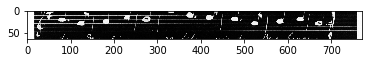

[273, 897, 173, 1218, 430, 1218, 859, 1218, 859, 1218, 430, 1218, 430, 1218, 472, 1218, 29, 1218, 77, 1218, 385, 1218, 472, 1218, 430, 1218, 859, 1218, 859, 1218, 430, 1218, 430, 1218, 472, 1218, 29, 1218, 77, 1218, 385, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '8g', '16g', '16g', '8g', '8g', '=', '8f#', '8a', '4d', '=', '8g', '16g', '16g', '8g', '8g', '=', '8f#', '8a', '4d', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '8g', '16g', '16g', '8g', '8g', '=', '8f#', '8a', '4d', '=', '8g', '16g', '16g', '8g', '8g', '=', '8f#', '8a', '4d', '=', '*-']


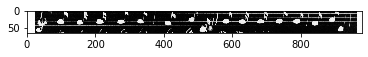

[273, 897, 1218, 299, 1218, 952, 1218, 299, 1218, 952, 1218, 472, 1218, 299, 1218, 952, 1218, 584, 1218, 299, 1218, 299, 1218, 952, 1218, 472, 1218, 299, 1218, 299, 1218, 952, 1218, 952, 1218, 299, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '4e', '4c#', '4e', '4c#', '=', '4e', '4c#', '4c', '4e', '4e', '4c#', '=', '4e', '4e', '4c#', '4c#', '4e', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '4e', '4c#', '4e', '4c#', '=', '4e', '4c#', '4c', '4e', '4e', '4c#', '=', '4e', '4e', '4c#', '4c#', '4e', '=', '*-']


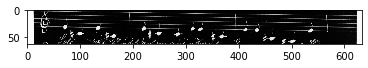

[273, 897, 1218, 299, 1218, 952, 1218, 584, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '4e', '4c#', '4c', '*-']
Groundtruth: ['**kern', '*clefG2', '4e', '4c#', '4c', '*-']


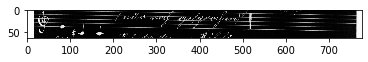

[273, 897, 1218, 86, 1218, 1081, 1218, 757, 1218, 834, 1218, 472, 1218, 1041, 1218, 25, 1218, 815, 1218, 258, 1218, 25, 1218, 472, 1218, 815, 1218, 20, 1218, 498, 1218, 419, 1218, 1037, 1218, 472, 1218, 114, 1218, 472, 1218, 200, 1218, 805, 1218, 805, 1218, 181, 1218, 337, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*M4/4', '*k[b-e-a-d-]', '8.e-', '16a-', '=', '4.a-', '8a-', '(4cc', '8b-)', '8a-', '=', '(4cc', '8b-L)', '8a-J', '(4.a-', '8g)', '=', '2g', '=', '*M/4/4', '8b-', '8b-', '8.b-', '16cc', '*-']
Groundtruth: ['**kern', '*clefG2', '*M4/4', '*k[b-e-a-d-]', '8.e-', '16a-', '=', '4.a-', '8a-', '(4cc', '8b-)', '8a-', '=', '(4cc', '8b-L)', '8a-J', '(4.a-', '8g)', '=', '2g', '=', '*M/4/4', '8b-', '8b-', '8.b-', '16cc', '*-']


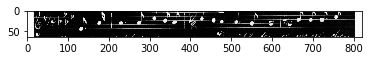

[273, 897, 1218, 86, 1218, 1081, 1218, 702, 1218, 708, 1218, 1164, 1218, 708, 1218, 472, 1218, 49, 1218, 524, 1218, 407, 1218, 94, 1218, 202, 1218, 472, 1218, 1175, 1218, 1070, 1218, 116, 1218, 395, 1218, 574, 1218, 498, 1218, 472, 1218, 984, 1218, 993, 1218, 511, 1218, 407, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*M4/4', '*k[b-e-a-d-]', '8.dd-L', '16ccJ', '8.a-L', '16ccJ', '=', '8ccL', '8b-J', '2r', '8a-L', '8ffJ', '=', '4ff', '4ee-', '8dd-L', '8ccJ', '8b-L', '8a-J', '=', '8.g', '16b-', '2ee-', '2r', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*M4/4', '*k[b-e-a-d-]', '8.dd-L', '16ccJ', '8.a-L', '16ccJ', '=', '8ccL', '8b-J', '2r', '8a-L', '8ffJ', '=', '4ff', '4ee-', '8dd-L', '8ccJ', '8b-L', '8a-J', '=', '8.g', '16b-', '2ee-', '2r', '=', '*-']


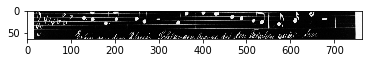

[273, 897, 1218, 86, 1218, 1081, 1218, 417, 1218, 671, 1218, 1164, 1218, 708, 1218, 1157, 1218, 427, 1218, 840, 1218, 1019, 1218, 472, 1218, 887, 1218, 1000, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*M4/4', '*k[b-e-a-d-]', '8.ccL', '16ee-J', '8.a-L', '16ccJ', '8.b-L', '16dd-J', '8.gL', '16b-J', '=', '(4b-', '4a-)', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '*M4/4', '*k[b-e-a-d-]', '8.ccL', '16ee-J', '8.a-L', '16ccJ', '8.b-L', '16dd-J', '8.gL', '16b-J', '=', '(4b-', '4a-)', '==', '*-']


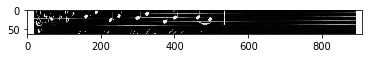

[273, 897, 1218, 847, 1218, 48, 1218, 384, 1218, 113, 1218, 472, 1218, 29, 1218, 29, 1218, 29, 1218, 503, 1218, 409, 1218, 472, 1218, 430, 1218, 568, 1218, 491, 1218, 503, 1218, 409, 1218, 472, 1218, 430, 1218, 430, 1218, 430, 1218, 816, 1218, 800, 1218, 472, 1218, 77, 1218, 29, 1218, 491, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#c#]', '*M4/8', '16dL', '16eJ', '=', '8f#', '8f#', '8f#', '16eL', '16f#J', '=', '8g', '8e', '16r', '16eL', '16f#J', '=', '8g', '8g', '8g', '16f#L', '16gJ', '=', '8a', '8f#', '16r', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#c#]', '*M4/8', '16dL', '16eJ', '=', '8f#', '8f#', '8f#', '16eL', '16f#J', '=', '8g', '8e', '16r', '16eL', '16f#J', '=', '8g', '8g', '8g', '16f#L', '16gJ', '=', '8a', '8f#', '16r', '*-']


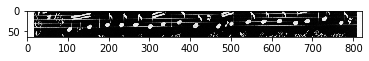

[273, 897, 1218, 847, 1218, 340, 1218, 384, 1218, 409, 1218, 472, 1218, 1165, 1218, 632, 1218, 1050, 1218, 77, 1218, 491, 1218, 1052, 1218, 384, 1218, 409, 1218, 472, 1218, 812, 1218, 244, 1218, 307, 1218, 520, 1218, 491, 1218, 209, 1218, 65, 1218, 978, 1218, 472, 1218, 992, 1218, 109, 1218, 472, 1218, 1134, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#c#]', '16c#', '16dL', '16f#J', '=', '16.a', '32aL', '32aJ', '8a', '16r', '16f#', '16dL', '16f#J', '=', '16.b', '32bL', '32bJ', '8b', '16r', '16dd', '16cc#L', '16bJ', '=', '4a', '4g', '=', '2f#', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#c#]', '16c#', '16dL', '16f#J', '=', '16.a', '32aL', '32aJ', '8a', '16r', '16f#', '16dL', '16f#J', '=', '16.b', '32bL', '32bJ', '8b', '16r', '16dd', '16cc#L', '16bJ', '=', '4a', '4g', '=', '2f#', '==', '*-']


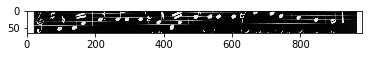

[273, 897, 173, 1218, 30, 1218, 526, 1218, 716, 1218, 472, 1218, 912, 1218, 385, 1218, 822, 1218, 1052, 1218, 472, 1218, 109, 1218, 385, 1218, 526, 1218, 589, 1218, 472, 1218, 196, 1218, 992, 1218, 664, 1218, 589, 1218, 472, 1218, 617, 1218, 934, 1218, 526, 1218, 716, 1218, 472, 1218, 912, 1218, 385, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '*M3/4', '8.b', '16a#', '=', '4b', '4d', '8.e', '16f#', '=', '4g', '4d', '8.b', '16ee', '=', '4dd', '4a', '8.cc', '16ee', '=', '(4dd', '4b)', '8.b', '16a#', '=', '4b', '4d', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '*M3/4', '8.b', '16a#', '=', '4b', '4d', '8.e', '16f#', '=', '4g', '4d', '8.b', '16ee', '=', '4dd', '4a', '8.cc', '16ee', '=', '(4dd', '4b)', '8.b', '16a#', '=', '4b', '4d', '*-']


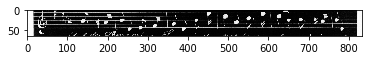

[273, 897, 173, 1218, 822, 1218, 1052, 1218, 472, 1218, 109, 1218, 385, 1218, 526, 1218, 589, 1218, 472, 1218, 196, 1218, 992, 1218, 664, 1218, 469, 1218, 472, 1218, 109, 1218, 195, 1218, 984, 1218, 1052, 1218, 472, 1218, 351, 1218, 29, 1218, 984, 1218, 1055, 1218, 472, 1218, 47, 1218, 699, 1218, 109, 1218, 984, 1218, 1052, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '8.e', '16f#', '=', '4g', '4d', '8.b', '16ee', '=', '4dd', '4a', '8.cc', '16b', '=', '4g', '4r', '8.g', '16f#', '=', '4.e', '8f#', '8.g', '16e', '=', '8dL', '8bJ', '4g', '8.g', '16f#', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '8.e', '16f#', '=', '4g', '4d', '8.b', '16ee', '=', '4dd', '4a', '8.cc', '16b', '=', '4g', '4r', '8.g', '16f#', '=', '4.e', '8f#', '8.g', '16e', '=', '8dL', '8bJ', '4g', '8.g', '16f#', '=', '*-']


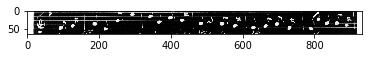

[273, 897, 173, 1218, 351, 1218, 29, 1218, 432, 1218, 1067, 1218, 568, 1218, 472, 1218, 47, 1218, 699, 1218, 109, 1218, 520, 1218, 520, 1218, 472, 1218, 560, 1218, 77, 1218, 526, 1218, 531, 1218, 472, 1218, 432, 1218, 650, 1218, 992, 1218, 77, 1218, 285, 1218, 472, 1218, 205, 1218, 54, 1218, 472, 1218, 387, 1218, 622, 1218, 526, 1218, 716, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '4.e', '8f#', '8aL', '8gJ', '8e', '=', '8dL', '8bJ', '4g', '8b', '8b', '=', '4.a', '8a', '8.b', '16a', '=', '8aL', '8ddJ', '4a', '8a', '8dd', '=', '2ff#', '4ee', '=', '(4ee', '4dd)', '8.b', '16a#', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '4.e', '8f#', '8aL', '8gJ', '8e', '=', '8dL', '8bJ', '4g', '8b', '8b', '=', '4.a', '8a', '8.b', '16a', '=', '8aL', '8ddJ', '4a', '8a', '8dd', '=', '2ff#', '4ee', '=', '(4ee', '4dd)', '8.b', '16a#', '=', '*-']


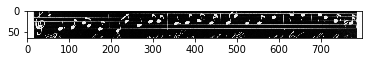

[273, 897, 173, 1218, 912, 1218, 385, 1218, 822, 1218, 1052, 1218, 472, 1218, 109, 1218, 1115, 1218, 326, 1218, 859, 1218, 526, 1218, 589, 1218, 472, 1218, 196, 1218, 77, 1218, 491, 1218, 531, 1218, 664, 1218, 589, 1218, 472, 1218, 617, 1218, 934, 1218, 526, 1218, 690, 1218, 472, 1218, 912, 1218, 385, 1218, 568, 1218, 1052, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '4b', '4d', '8.e', '16f#', '=', '4g', '8d', '8r', '16g', '8.b', '16ee', '=', '4dd', '8a', '16r', '16a', '8.cc', '16ee', '=', '(4dd', '4b)', '8.b', '8a#', '=', '4b', '4d', '8e', '16f#', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '4b', '4d', '8.e', '16f#', '=', '4g', '8d', '8r', '16g', '8.b', '16ee', '=', '4dd', '8a', '16r', '16a', '8.cc', '16ee', '=', '(4dd', '4b)', '8.b', '8a#', '=', '4b', '4d', '8e', '16f#', '=', '*-']


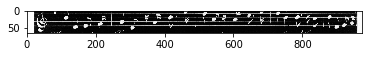

[273, 897, 173, 1218, 109, 1218, 385, 1218, 984, 1218, 531, 1218, 472, 1218, 471, 1218, 118, 1218, 196, 1218, 148, 1218, 469, 1218, 472, 1218, 114, 1218, 984, 1218, 531, 1218, 472, 1218, 471, 1218, 1181, 1218, 196, 1218, 148, 1218, 469, 1218, 472, 1218, 114, 1218, 195, 1218, 472, 1218, 148, 1218, 531, 1218, 729, 1218, 472, 1218, 1026, 1218, 859, 1218, 150, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '4g', '4d', '8.g', '16a', '=', '8bL', '8eeJ', '4dd', '8.a', '16b', '=', '2g', '8.g', '16a', '=', '8bL', '8ggJ', '4dd', '8.a', '16b', '=', '2g', '4r', '=', '8.a', '16a', '2cc', '=', '8.d', '16g', '2b', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '4g', '4d', '8.g', '16a', '=', '8bL', '8eeJ', '4dd', '8.a', '16b', '=', '2g', '8.g', '16a', '=', '8bL', '8ggJ', '4dd', '8.a', '16b', '=', '2g', '4r', '=', '8.a', '16a', '2cc', '=', '8.d', '16g', '2b', '=', '*-']


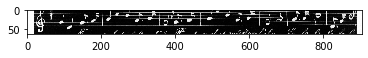

[273, 897, 173, 1218, 992, 1218, 1114, 1218, 560, 1218, 469, 1218, 664, 1218, 1004, 1218, 472, 1218, 552, 1218, 326, 1218, 285, 1218, 326, 1218, 520, 1218, 326, 1218, 472, 1218, 822, 1218, 859, 1218, 729, 1218, 472, 1218, 1026, 1218, 859, 1218, 150, 1218, 472, 1218, 150, 1218, 912, 1218, 472, 1218, 552, 1218, 326, 1218, 623, 1218, 29, 1218, 472, 430, 326, 51, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '4a', '16g#', '4.a', '16b', '8.cc', '16cc#', '=', '8ee', '8r', '8dd', '8r', '8b', '8r', '=', '8.e', '16g', '2cc', '=', '8.d', '16g', '2b', '=', '2b', '4b', '=', '8ee', '8r', '4.dd', '8f#', '=', '8g', '8r', '4gg', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '4a', '16g#', '4.a', '16b', '8.cc', '16cc#', '=', '8ee', '8r', '8dd', '8r', '8b', '8r', '=', '8.e', '16g', '2cc', '=', '8.d', '16g', '2b', '=', '2b', '4b', '=', '8ee', '8r', '4.dd', '8f#', '=', '8g', '8r', '4gg', '*-']


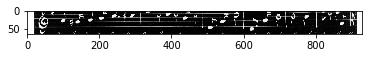

[273, 897, 173, 30, 1218, 840, 1218, 800, 1218, 732, 1218, 77, 1218, 472, 1218, 67, 1218, 978, 1218, 555, 1218, 520, 1218, 472, 1218, 432, 1218, 699, 1218, 617, 1218, 417, 1218, 454, 1218, 472, 1218, 692, 1218, 688, 1218, 912, 1218, 77, 1218, 367, 1218, 471, 1218, 118, 1218, 387, 1218, 541, 1218, 395, 1218, 472, 1218, 471, 1218, 58, 1218, 617, 1218, 49, 1218, 760, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '*M3/4', '8.gL', '16gJ', '4.g', '8a', '=', '8.bL', '16bJ', '4.b', '8b', '=', '8aL', '8bJ', '(4dd', '8.ccL', '16aJ)', '=', '(8aL', '8ccJ)', '4b', '8a', '=!:', '8bL', '8eeJ', '(4ee', '8ddL)', '8ccJ', '=', '8bL', '8ff#J', '(4dd', '8ccL', '8bJ)', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '*M3/4', '8.gL', '16gJ', '4.g', '8a', '=', '8.bL', '16bJ', '4.b', '8b', '=', '8aL', '8bJ', '(4dd', '8.ccL', '16aJ)', '=', '(8aL', '8ccJ)', '4b', '8a', '=!:', '8bL', '8eeJ', '(4ee', '8ddL)', '8ccJ', '=', '8bL', '8ff#J', '(4dd', '8ccL', '8bJ)', '=', '*-']


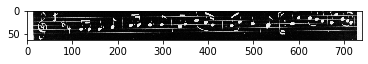

[273, 897, 173, 1218, 432, 1218, 650, 1218, 617, 1218, 873, 1218, 399, 1218, 472, 1218, 432, 1218, 395, 1218, 912, 1218, 195, 1218, 1013, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '8aL', '8ddJ', '(4dd', '8cc.L)', '16aJ', '=', '8aL', '8ccJ', '4b', '4r', '=:!', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '8aL', '8ddJ', '(4dd', '8cc.L)', '16aJ', '=', '8aL', '8ccJ', '4b', '4r', '=:!', '*-']


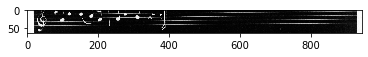

[273, 897, 173, 1218, 522, 1218, 430, 1218, 430, 1218, 430, 1218, 430, 1218, 430, 1218, 430, 1218, 430, 1218, 430, 1218, 472, 1218, 992, 1218, 196, 1218, 109, 1218, 195, 1218, 472, 1218, 430, 1218, 430, 1218, 430, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '*met(c)', '8g', '8g', '8g', '8g', '8g', '8g', '8g', '8g', '=', '4a', '4dd', '4g', '4r', '=', '8g', '8g', '8g', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '*met(c)', '8g', '8g', '8g', '8g', '8g', '8g', '8g', '8g', '=', '4a', '4dd', '4g', '4r', '=', '8g', '8g', '8g', '*-']


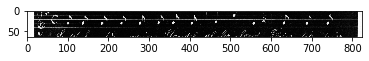

[273, 897, 1218, 430, 1218, 430, 1218, 430, 1218, 430, 1218, 430, 1218, 472, 1218, 992, 1218, 196, 1218, 109, 1218, 195, 1218, 472, 1218, 77, 1218, 77, 1218, 77, 1218, 77, 1218, 77, 1218, 77, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8g', '8g', '8g', '8g', '8g', '=', '4a', '4dd', '4g', '4r', '=', '8a', '8a', '8a', '8a', '8a', '8a', '*-']
Groundtruth: ['**kern', '*clefG2', '8g', '8g', '8g', '8g', '8g', '=', '4a', '4dd', '4g', '4r', '=', '8a', '8a', '8a', '8a', '8a', '8a', '*-']


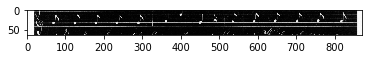

[273, 897, 1218, 1207, 1218, 1115, 1218, 472, 1218, 77, 1218, 77, 1218, 77, 1218, 77, 1218, 77, 1218, 77, 1218, 1207, 1218, 1115, 1218, 472, 1218, 992, 1218, 196, 1218, 109, 1218, 195, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8f', '8d', '=', '8a', '8a', '8a', '8a', '8a', '8a', '8f', '8d', '=', '4a', '4dd', '4g', '4r', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '8f', '8d', '=', '8a', '8a', '8a', '8a', '8a', '8a', '8f', '8d', '=', '4a', '4dd', '4g', '4r', '==', '*-']


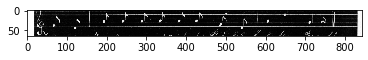

[273, 897, 1218, 228, 1218, 1110, 1218, 88, 1218, 472, 1218, 288, 1218, 1068, 1218, 1207, 1218, 288, 1218, 1068, 1218, 77, 1218, 472, 1218, 77, 1218, 109, 1218, 326, 1218, 88, 1218, 88, 1218, 472, 1218, 1206, 1218, 624, 1218, 430, 1218, 2, 1218, 395, 1218, 805, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*M6/8', '*k[b-]', '8c', '=', '8AL', '8cJ', '8f', '8AL', '8cJ', '8a', '=', '8a', '4g', '8r', '8c', '8c', '=', '8cL', '8eJ', '8g', '8ddL', '8ccJ', '8b-', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*M6/8', '*k[b-]', '8c', '=', '8AL', '8cJ', '8f', '8AL', '8cJ', '8a', '=', '8a', '4g', '8r', '8c', '8c', '=', '8cL', '8eJ', '8g', '8ddL', '8ccJ', '8b-', '=', '*-']


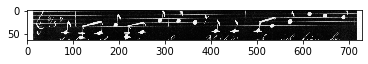

[273, 897, 1218, 472, 1218, 560, 1218, 326, 1218, 1207, 1218, 472, 1218, 432, 1218, 395, 1218, 466, 1218, 49, 1218, 699, 1218, 77, 1218, 472, 1218, 77, 1218, 984, 1218, 963, 1218, 959, 1218, 472, 1218, 1206, 1218, 624, 1218, 430, 1218, 2, 1218, 395, 1218, 520, 1218, 472, 1218, 560, 1218, 326, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '=', '4.a', '8r', '8f', '=', '8aL', '8ccJ', '8cc', '8ccL', '8bJ', '8a', '=', '8a', '8.g', '(8c', '8c)', '=', '8cL', '8eJ', '8g', '8ddL', '8ccJ', '8b', '=', '4.a', '8r', '*-']
Groundtruth: ['**kern', '*clefG2', '=', '4.a', '8r', '8f', '=', '8aL', '8ccJ', '8cc', '8ccL', '8bJ', '8a', '=', '8a', '8.g', '(8c', '8c)', '=', '8cL', '8eJ', '8g', '8ddL', '8ccJ', '8b', '=', '4.a', '8r', '*-']


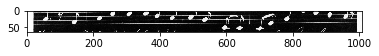

[273, 897, 173, 1218, 1026, 1218, 469, 1218, 472, 1218, 55, 1218, 1056, 1218, 1026, 1218, 337, 1218, 472, 1218, 282, 1218, 431, 1218, 430, 1218, 520, 1218, 472, 1218, 1084, 1218, 431, 1218, 285, 1218, 664, 1218, 1052, 1218, 472, 1218, 271, 1218, 46, 1218, 195, 1218, 367, 1218, 984, 1218, 469, 1218, 520, 1218, 520, 1218, 520, 1218, 520, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '8.d', '16b', '=', '(4b', '4a)', '8.d', '16cc', '=', '(8cc', '8b)', '8g', '8b', '=', '(8dd', '8b)', '8dd', '8.cc', '16f#', '=', '(4a', '4g)', '4r', '=!:', '8.g', '16b', '8b', '8b', '8b', '8b', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '8.d', '16b', '=', '(4b', '4a)', '8.d', '16cc', '=', '(8cc', '8b)', '8g', '8b', '=', '(8dd', '8b)', '8dd', '8.cc', '16f#', '=', '(4a', '4g)', '4r', '=!:', '8.g', '16b', '8b', '8b', '8b', '8b', '=', '*-']


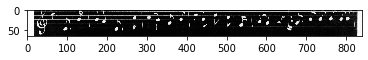

[273, 897, 173, 1218, 243, 1218, 992, 1218, 195, 1218, 472, 1218, 148, 1218, 337, 1218, 466, 1218, 466, 1218, 466, 1218, 1155, 1218, 708, 1218, 472, 1218, 196, 1218, 912, 1218, 430, 1218, 520, 1218, 472, 1218, 617, 1218, 431, 1218, 285, 1218, 466, 1218, 29, 1218, 472, 1218, 271, 1218, 46, 1218, 195, 1218, 1013, 1218, 271, 1218, 46, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '4cc', '4a', '4r', '=', '8.a', '16cc', '8cc', '8cc', '8cc', '16bL', '16ccJ', '=', '4dd', '4b', '8g', '8b', '=', '(4dd', '8b)', '8dd', '8cc', '8f#', '=', '(4a', '4g)', '4r', '=:!', '(4a', '4g)', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '4cc', '4a', '4r', '=', '8.a', '16cc', '8cc', '8cc', '8cc', '16bL', '16ccJ', '=', '4dd', '4b', '8g', '8', '8b', '=', '(4dd', '8b)', '8dd', '8cc', '8f#', '=', '(4a', '4g)', '4r', '=:!', '(4a', '4g)', '==', '*-']


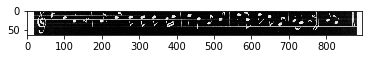

[273, 897, 173, 1218, 868, 1218, 385, 1218, 472, 1218, 732, 1218, 77, 1218, 472, 1218, 520, 1218, 520, 1218, 77, 1218, 430, 1218, 472, 1218, 430, 1218, 1115, 1218, 568, 1218, 29, 1218, 472, 1218, 430, 1218, 430, 1218, 77, 1218, 326, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[f#]', '*M2/4', '4d', '=', '4.g', '8a', '=', '8b', '8b', '8a', '8g', '=', '8g', '8d', '8e', '8f#', '=', '8g', '8g', '8a', '8r', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[f#]', '*M2/4', '4d', '=', '4.g', '8a', '=', '8b', '8b', '8a', '8g', '=', '8g', '8d', '8e', '8f#', '=', '8g', '8g', '8a', '8r', '=', '*-']


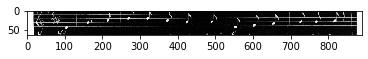

[273, 897, 1218, 326, 1218, 1115, 1218, 1115, 1218, 1115, 1218, 472, 1218, 430, 1218, 430, 1218, 430, 1218, 520, 1218, 472, 1218, 285, 1218, 285, 1218, 466, 1218, 1207, 1218, 472, 1218, 109, 1218, 326, 1218, 285, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8r', '8d', '8d', '8d', '=', '8g', '8g', '8g', '8b', '=', '8dd', '8dd', '8cc', '8f', '=', '4g', '8r', '8dd', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '8r', '8d', '8d', '8d', '=', '8g', '8g', '8g', '8b', '=', '8dd', '8dd', '8cc', '8f', '=', '4g', '8r', '8dd', '=', '*-']


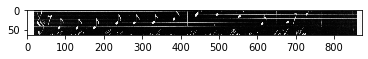

[273, 897, 1218, 285, 1218, 77, 1218, 77, 1218, 285, 1218, 472, 1218, 285, 1218, 520, 1218, 520, 1218, 285, 1218, 472, 1218, 466, 1218, 520, 1218, 77, 1218, 430, 1218, 472, 1218, 1207, 1218, 77, 1218, 269, 1218, 491, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8dd', '8a', '8a', '8dd', '=', '8dd', '8b', '8b', '8dd', '=', '8cc', '8b', '8a', '8g', '=', '8f', '8a', '16d', '16r', '*-']
Groundtruth: ['**kern', '*clefG2', '8dd', '8a', '8a', '8dd', '=', '8dd', '8b', '8b', '8dd', '=', '8cc', '8b', '8a', '8g', '=', '8f', '8a', '16d', '16r', '*-']


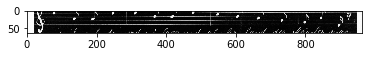

[273, 897, 1218, 269, 1218, 472, 1218, 732, 1218, 77, 1218, 472, 1218, 520, 1218, 520, 1218, 77, 1218, 430, 1218, 472, 1218, 1207, 1218, 77, 1218, 466, 1218, 1207, 1218, 472, 1218, 109, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '16d', '=', '4.g', '8a', '=', '8b', '8b', '8a', '8g', '=', '8f', '8a', '8cc', '8f', '=', '4g', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '16d', '=', '4.g', '8a', '=', '8b', '8b', '8a', '8g', '=', '8f', '8a', '8cc', '8f', '=', '4g', '==', '*-']


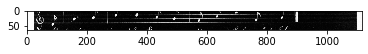

[273, 897, 809, 1218, 86, 522, 1218, 203, 1218, 472, 1218, 285, 1218, 466, 1218, 750, 1218, 203, 1218, 805, 1218, 77, 1218, 472, 1218, 243, 1218, 243, 1218, 203, 1218, 285, 1218, 466, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[e-b-]', '*M4/4', '*met(c)', '4f', '=', '8dd', '8cc', '4b-', '4f', '8b-', '8a', '=', '4cc', '4cc', '4f', '8dd', '8cc', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[e-b-]', '*M4/4', '*met(c)', '4f', '=', '8dd', '8cc', '4b-', '4f', '8b-', '8a', '=', '4cc', '4cc', '4f', '8dd', '8cc', '=', '*-']


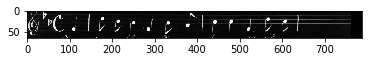

[273, 897, 809, 1218, 992, 1218, 203, 1218, 1207, 1218, 1207, 1218, 430, 1218, 77, 1218, 472, 1218, 45, 1218, 1207, 1218, 1207, 1218, 1207, 1218, 1070, 1218, 472, 1218, 599, 1218, 1170, 1218, 182, 1218, 857, 1218, 660, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[e-b-]', '4a', '4f', '8f', '8f', '8g', '8a', '=', '4.b-', '8f', '8f', '8f', '4ee-', '=', '4.ee-', '8gg', '8ff', '8ee-', '(4ff', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[e-b-]', '4a', '4f', '8f', '8f', '8g', '8a', '=', '4.b-', '8f', '8f', '8f', '4ee-', '=', '4.ee-', '8gg', '8ff', '8ee-', '(4ff', '=', '*-']


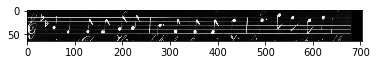

[273, 897, 809, 1218, 224, 1218, 285, 1218, 196, 1218, 196, 1218, 285, 1218, 285, 1218, 472, 1218, 243, 1218, 857, 1218, 466, 1218, 992, 1218, 992, 1218, 472, 1218, 210, 1218, 195, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[e-b-]', '8ff)', '8dd', '4dd', '4dd', '8dd', '8dd', '=', '4cc', '8ee-', '8cc', '4a', '4a', '=', '2b-', '4r', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[e-b-]', '8ff)', '8dd', '4dd', '4dd', '8dd', '8dd', '=', '4cc', '8ee-', '8cc', '4a', '4a', '=', '2b-', '4r', '==', '*-']


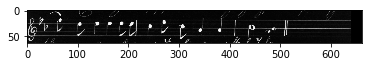

[273, 897, 468, 228, 1218, 805, 1218, 472, 1218, 181, 1218, 993, 1218, 805, 1218, 805, 1218, 805, 1218, 805, 1218, 472, 1218, 805, 1218, 805, 1218, 195, 1218, 326, 1218, 805, 1218, 472, 1218, 470, 1218, 859, 1218, 430, 1218, 805, 1218, 805, 1218, 805, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[b-e-a-]', '*M6/8', '8b-', '=', '8.b-', '16b-', '8b-', '8b-', '8b-', '8b-', '=', '8b-', '8b-', '4r', '8r', '8b-', '=', '8.a-', '16g', '8g', '8b-', '8b-', '8b-', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[b-e-a-]', '*M6/8', '8b-', '=', '8.b-', '16b-', '8b-', '8b-', '8b-', '8b-', '=', '8b-', '8b-', '4r', '8r', '8b-', '=', '8.a-', '16g', '8g', '8b-', '8b-', '8b-', '*-']


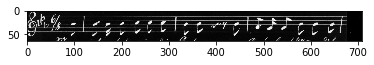

[273, 897, 468, 1218, 1041, 1218, 195, 1218, 805, 1218, 472, 1218, 805, 1218, 805, 1218, 805, 1218, 196, 1218, 285, 1218, 472, 1218, 466, 1218, 466, 1218, 195, 1218, 326, 1218, 466, 1218, 472, 1218, 470, 1218, 834, 1218, 25, 1218, 824, 1218, 466, 1218, 472, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[b-e-a-]', '4.a-', '4r', '8b-', '=', '8b-', '8b-', '8b-', '4dd', '8dd', '=', '8cc', '8cc', '4r', '8r', '8cc', '=', '8.a-', '16a-', '8a-', '4.cc', '8cc', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[b-e-a-]', '4.a-', '4r', '8b-', '=', '8b-', '8b-', '8b-', '4dd', '8dd', '=', '8cc', '8cc', '4r', '8r', '8cc', '=', '8.a-', '16a-', '8a-', '4.cc', '8cc', '=', '*-']


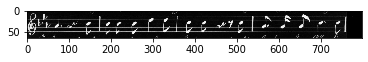

[273, 897, 468, 1218, 45, 1218, 195, 1218, 805, 1218, 472, 1218, 109, 1218, 805, 1218, 472, 1218, 1170, 1218, 182, 1218, 857, 1218, 472, 1218, 857, 1218, 196, 1218, 857, 1218, 196, 1218, 472, 1218, 857, 1218, 196, 1218, 857, 1218, 1175, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[b-e-a-]', '4.b-', '4r', '8b-', '=', '4g', '8b-', '=', '8gg', '8ff', '8ee-', '=', '8ee-', '4dd', '8ee-', '4dd', '=', '8ee-', '4dd', '8ee-', '4ff', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[b-e-a-]', '4.b-', '4r', '8b-', '=', '4g', '8b-', '=', '8gg', '8ff', '8ee-', '=', '8ee-', '4dd', '8ee-', '4dd', '=', '8ee-', '4dd', '8ee-', '4ff', '=', '*-']


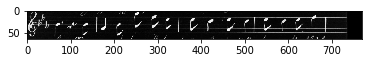

[273, 897, 468, 1218, 128, 1218, 128, 1218, 196, 1218, 466, 1218, 243, 1218, 472, 1218, 805, 1218, 285, 1218, 285, 1218, 466, 1218, 750, 1218, 472, 1218, 466, 1218, 1113, 1218, 805, 1218, 109, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[b-e-a-]', '16ee-', '16ee-', '4dd', '8cc', '4cc', '=', '8b-', '8dd', '8dd', '8cc', '4b-', '=', '8cc', '4a-', '8b-', '4g', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[b-e-a-]', '16ee-', '16ee-', '4dd', '8cc', '4cc', '=', '8b-', '8dd', '8dd', '8cc', '4b-', '=', '8cc', '4a-', '8b-', '4g', '==', '*-']


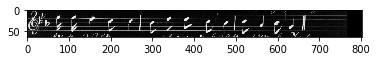

[273, 897, 1218, 86, 522, 1218, 109, 1218, 472, 1218, 824, 1218, 568, 1218, 351, 1218, 568, 1218, 472, 1218, 351, 1218, 430, 1218, 560, 1218, 430, 1218, 472, 1218, 109, 1218, 823, 1218, 326, 1218, 1207, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*M4/4', '*met(c)', '4g', '=', '4.cc', '8e', '4.e', '8e', '=', '4.e', '8g', '4.a', '8g', '=', '4g', '2f', '8r', '8f', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*M4/4', '*met(c)', '4g', '=', '4.cc', '8e', '4.e', '8e', '=', '4.e', '8g', '4.a', '8g', '=', '4g', '2f', '8r', '8f', '=', '*-']


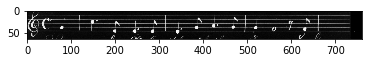

[273, 897, 1218, 1207, 1218, 285, 1218, 623, 1218, 466, 1218, 526, 1218, 531, 1218, 472, 1218, 984, 1218, 769, 1218, 351, 1218, 430, 1218, 466, 1218, 285, 1218, 472, 1218, 678, 1218, 285, 1218, 664, 1218, 469, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8f', '8dd', '4.dd', '8cc', '8.b', '16a', '=', '8.g', '16f', '4.e', '8g', '8cc', '8dd', '=', '4.ee', '8dd', '8.cc', '16b', '*-']
Groundtruth: ['**kern', '*clefG2', '8f', '8dd', '4.dd', '8cc', '8.b', '16a', '=', '8.g', '16f', '4.e', '8g', '8cc', '8dd', '=', '4.ee', '8dd', '8.cc', '16b', '*-']


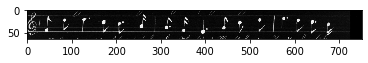

[273, 897, 1218, 148, 1218, 859, 1218, 472, 1218, 109, 1218, 91, 1218, 285, 1218, 466, 1218, 568, 1218, 472, 1218, 560, 1218, 77, 1218, 984, 1218, 859, 1218, 1026, 1218, 769, 1218, 472, 1218, 823, 1218, 195, 1218, 1066, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '8.a', '16g', '=', '4g', '4.f', '8dd', '8cc', '8e', '=', '4.a', '8a', '8.g', '16g', '8.d', '16f', '=', '2f', '4r', '==', '*-']
Groundtruth: ['**kern', '*clefG2', '8.a', '16g', '=', '4g', '4.f', '8dd', '8cc', '8e', '=', '4.a', '8a', '8.g', '16g', '8.d', '16f', '=', '2f', '4r', '==', '*-']


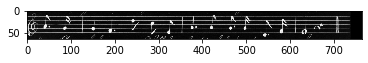

[273, 897, 1110, 30, 1218, 243, 1218, 472, 1218, 243, 1218, 992, 1218, 243, 1218, 472, 1218, 243, 1218, 992, 1218, 243, 1218, 472, 1218, 21, 1218, 196, 1218, 472, 1218, 991, 1218, 750, 1218, 472, 1218, 248, 1218]
Prediction: ['**kern', '*clefG2', '*k[b-]', '*M3/4', '4cc', '=', '4cc', '4a', '4cc', '=', '4cc', '4a', '4cc', '=', '2dd', '4dd', '=', '2a', '4b-', '=', '*-']
Groundtruth: ['**kern', '*clefG2', '*k[b-]', '*M3/4', '4cc', '=', '4cc', '4a', '4cc', '=', '4cc', '4a', '4cc', '=', '2dd', '4dd', '=', '2a', '4b-', '=', '*-']


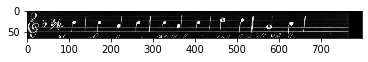

KeyboardInterrupt: ignored

In [ ]:
x_rls, y_rls = load_rls_data(path_rls, fixed_height)
w2i, i2w = check_and_retrieveVocabulary([], '/content/drive/MyDrive/Bachelorarbeit/models/architecture_2/cprimus_fmt_rls/e2evocabulary')
model_path = '/content/drive/MyDrive/Bachelorarbeit/models/architecture_2/cprimus_fmt_rls/e2e_checkpoints/model-primus_fmt_rls-44.38-64h.h5'

x, y = normalize_data(x_rls, y_rls, w2i, 64)

x_val = x[:int(len(x)*val_size)]
y_val = y[:int(len(y)*val_size)]
x_train = x[int(len(x)*val_size):]
y_train = y[int(len(y)*val_size):]
dataset_x = x_train
dataset_y = y_train
fixed_height = 64
e2e_predict(dataset_x, dataset_y, fixed_height, model_path)

## Sonstiges

In [ ]:
kern_path = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/primus-kern/primus/primus_kern.json"
data_list = "/content/train_datalist.txt"
primus_path = "/content/corpus_only_img1"
XPrimus = LoadCameraPrimusImagesWithoutFolderStructure(data_list, primus_path)
YPrimus = LoadCameraPrimusGT(kern_path, data_list)

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.
12232642560
25055:201002230-1_3_1

(75, 754)
12232642560
25056:225000050-1_3_1

(78, 1001)
12232650752
25057:220019309-1_1_1

(86, 640)
12232650752
25058:211006071-1_1_1

(60, 726)
12232650752
25059:000104018-1_1_1

(74, 682)
12232716288
25060:100015783-1_1_1

(64, 412)
12232441856
25061:000136884-1_2_1

(69, 1001)
12232712192
25062:100500721-1_1_3

(64, 1001)
12232196096
25063:190022001-1_1_1

(69, 586)
12232196096
25064:220000682-1_5_1

(64, 546)
12232323072
25065:000101471-1_2_2

(68, 671)
12232323072
25066:160000315-1_1_1

(79, 566)
12232323072
25067:210000153-1_14_1

(71, 420)
12232323072
25068:220001525-1_1_1

(73, 718)
12232323072
25069:220001502-1_5_1

(69, 616)
12232323072
25070:000138842-1_1_1

(94, 600)
12232323072
25071:230004852-1_3_1

(64, 592)
12232384512
25072:220030140-1_1_1

(63, 496)
12232384512
25073:000127950-1_1_1

(85, 808)
12232392704
25074:000115517-1_1_1

(74, 533)
12232392704
25075:230001183-1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


NameError: ignored

In [ ]:
def LoadCameraPrimusGT(kern_file, data_file):
    Y = []
    YSequence = []

    with open(kern_file, "r") as f:
        json_file = json.load(f)
    with open(data_file, "r") as d:
        data_list = d.read().splitlines()

    regions = json_file['regions']
    for data_name in tqdm(data_list):
        for img_name in regions:
          #print(f'{data_name}={img_name["image_name"]}?')
          if data_name == img_name['image_name']:
            kern = img_name['semantic'].replace(";", "")
            YSequence = kern.splitlines()
            Y.append(YSequence)
            YSequence = []
            continue
    return np.array(Y)        

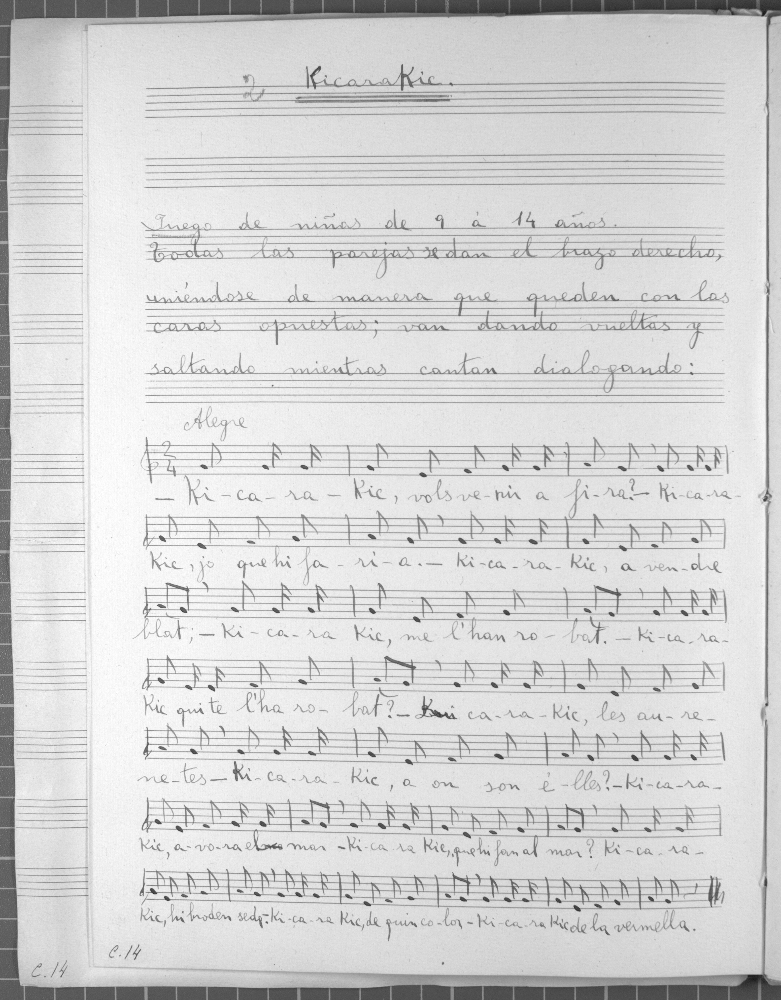

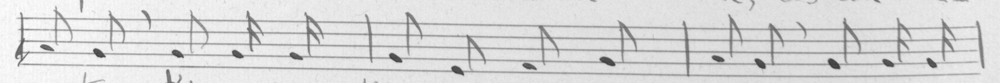

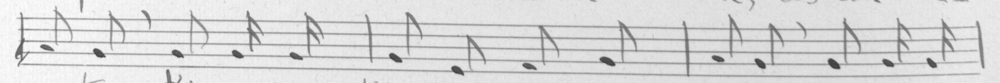

(4025, 3147)
orginale_shape: (4025, 3147)
crop_shape: (201, 2419)
resized_shape: (128, 1540)


In [ ]:
image_path = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/fmt/c14/masters/[C14-02] 4v.jpg"
original_image = imread(image_path, False)
cv2_imshow(original_image)
fixed_height = 128
x = 541
y = 2896
w = 2960 - 541
h = 3097 - 2896
cropped_image = original_image[y:y+h, x:x+w]
width = int(float(fixed_height * cropped_image.shape[1]) / cropped_image.shape[0])
resized_image = resize(cropped_image, (width, fixed_height))
cv2_imshow(cropped_image)
cv2_imshow(resized_image)
print(original_image.shape)
print(f'orginale_shape: {original_image.shape}')
print(f'crop_shape: {cropped_image.shape}')
print(f'resized_shape: {resized_image.shape}')


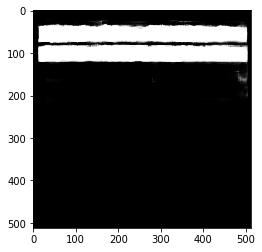

[(86, 15, 118, 479), (40, 17, 71, 480)]
x_start: 86
y_start: 15
x_start: 40
y_start: 17
86
40


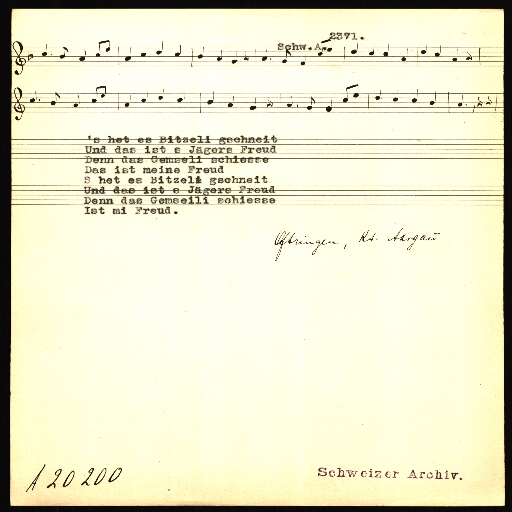

(512, 512, 3)


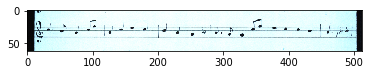

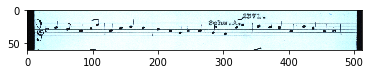

In [ ]:
x = 1
predict = sae_model.predict(X_train[x:x+1])
predict = np.asarray(predict).reshape(1, 512, 512)
#predict = cvtColor(predict[0],cv2.COLOR_GRAY2RGB)
draw(predict[0])
boundRect = getBoundingBoxesFromPrediction(predict[0])
for i in boundRect:
  print(i[0])
cv2_imshow(X_train[x])
print(X_train[1].shape)
for i in boundRect:
  xmin = i[0]
  ymin = i[1]
  xmax = i[2]
  ymax = i[3]
  draw(X_train[1][ymin:ymax][xmin-30:xmax])

In [ ]:
# Überprüft, ob Corpus dem JSON File entspricht und andersrum
import os
import json

#corpus_path = "/content/drive/MyDrive/Bachelorarbeit/Primus"
#corpus_path = "/content/drive/MyDrive/Bachelorarbeit/OMR-Liedblatter/datasets/Corpus"
#corpus_list = os.listdir(corpus_path)
json_path = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/primus-kern/primus/primus_kern.json"
cameraprimus_png_path = "/content/corpus_only_img1"
corpus_list = os.listdir(cameraprimus_png_path)

corpus_list_clean = []
for i in range(0,87678):
  corpus_list_clean.append(corpus_list[i].split(".")[0])

missing_corpus_image_in_json_files = []
missing_json_image_name_in_corpus_files = []

print(f'Corpus: {len(corpus_list)}')

with open(json_path, "r") as f:
    json_file = json.load(f)
    regions = json_file["regions"]
    image_names = []
    for img in regions:
        image_names.append(img['image_name'])
    print(f'Kern Json: {len(image_names)}')

for corpus_img in corpus_list_clean:
        if corpus_img not in image_names:
            missing_corpus_image_in_json_files.append(corpus_img)

for img_name in image_names:
        if img_name not in corpus_list_clean:
            missing_json_image_name_in_corpus_files.append(img_name)
            
print(len(missing_corpus_image_in_json_files))
print(len(missing_json_image_name_in_corpus_files))

Corpus: 87678
Kern Json: 87316
362
0


88
88


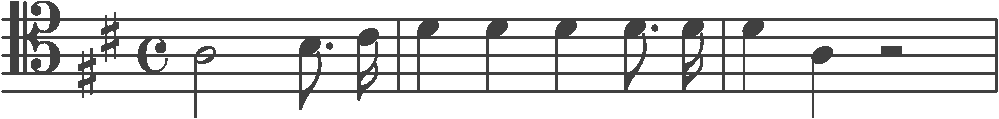

['**skern', '*clefC4', '*k[f#c#]', '*met(C)', '2A', '8.B', '16c#', '=', '4d', '4d', '4d', '8.d', '16d', '=', '4d', '4A', '2r', '=']


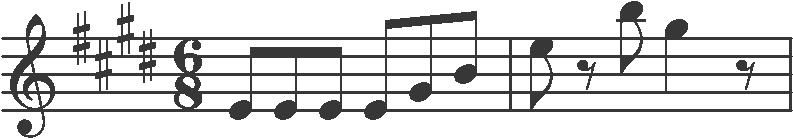

['**skern', '*clefG2', '*k[f#c#g#d#]', '*M6/8', '8e', '8e', '8e', '8e', '8g#', '8b', '=', '8ee', '8r', '8bb', '4gg#', '8r', '=']


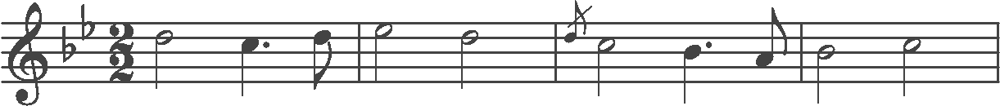

['**skern', '*clefG2', '*k[b-e-]', '*M2/2', '2dd', '4.cc', '8dd', '=', '2ee-', '2dd', '=', '8dd/', '2cc', '4.b-', '8a', '=', '2b-', '2cc', '=']


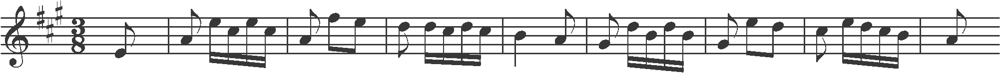

['**skern', '*clefG2', '*k[f#c#g#]', '*M3/8', '8e', '=', '8a', '16ee', '16cc#', '16ee', '16cc#', '=', '8a', '8ff#', '8ee', '=', '8dd', '16dd', '16cc#', '16dd', '16cc#', '=', '4b', '8a', '=', '8g#', '16dd', '16b', '16dd', '16b', '=', '8g#', '8ee', '8dd', '=', '8cc#', '16ee', '16dd', '16cc#', '16b', '=', '8a']


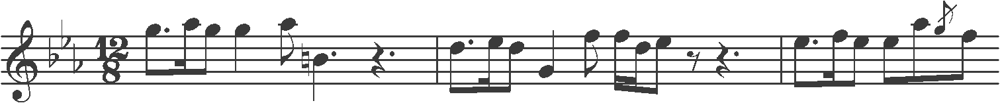

['**skern', '*clefG2', '*k[b-e-a-]', '*M12/8', '8.gg', '16aa-', '8gg', '4gg', '8aa-', '4.b', '4.r', '=', '8.dd', '16ee-', '8dd', '4g', '8ff', '16ff', '16dd', '8ee-', '8r', '4.r', '=', '8.ee-', '16ff', '8ee-', '8ee-', '8aa-', '8gg/', '8ff']


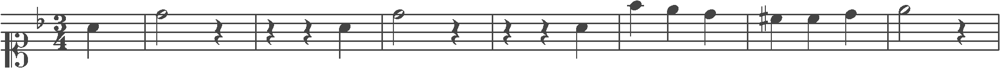

['**skern', '*clefC1', '*k[b-]', '*M3/4', '4a', '=', '2dd', '4r', '=', '4r', '4r', '4a', '=', '2dd', '4r', '=', '4r', '4r', '4a', '=', '4ff', '4ee', '4dd', '=', '4cc#', '4cc#', '4dd', '=', '2ee', '4r', '=']


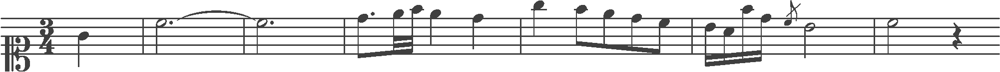

['**skern', '*clefC1', '*M3/4', '4g', '=', '2.cc', '=', '2.cc', '=', '8.dd', '32ee', '32ff', '4ee', '4dd', '=', '4gg', '8ff', '8ee', '8dd', '8cc', '=', '16b', '16a', '16ff', '16dd', '8cc/', '2b', '=', '2cc', '4r', '=']


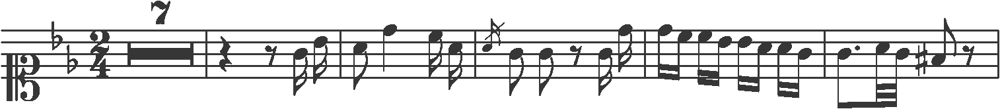

['**skern', '*clefC1', '*k[b-e-]', '*M2/4', '1r', '=', '4r', '8r', '16g', '16b-', '=', '8a', '4dd', '16cc', '16a', '=', '16a/', '8g', '8g', '8r', '16g', '16dd', '=', '16dd', '16cc', '16cc', '16b-', '16b-', '16a', '16a', '16g', '=', '8.g', '32a', '32g', '8f#', '8r', '=']


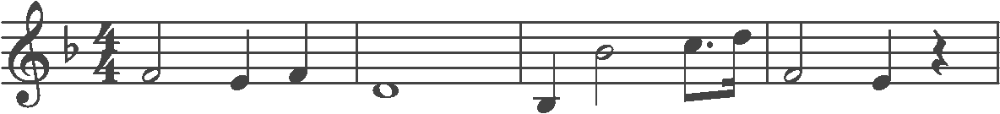

['**skern', '*clefG2', '*k[b-]', '*M4/4', '2f', '4e', '4f', '=', '1d', '=', '4B-', '2b-', '8.cc', '16dd', '=', '2f', '4e', '4r', '=']


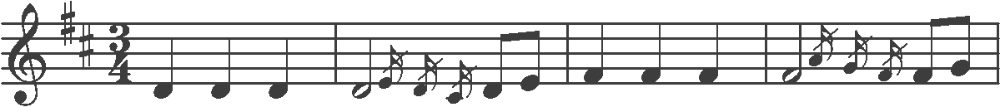

['**skern', '*clefG2', '*k[f#c#]', '*M3/4', '4d', '4d', '4d', '=', '2d', '16e/', '16c#/', '16d/', '8d', '8e', '=', '4f#', '4f#', '4f#', '=', '2f#', '16g/', '16a/', '16f#/', '8f#', '8g', '=']


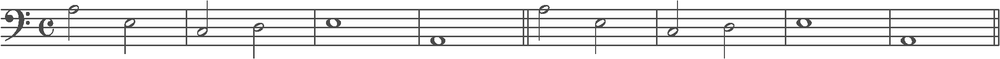

['**skern', '*clefF4', '*met(C)', '2A', '2E', '=', '2C', '2D', '=', '1E', '=', '1AA', '=', '2A', '2E', '=', '2C', '2D', '=', '1E', '=', '1AA', '=']


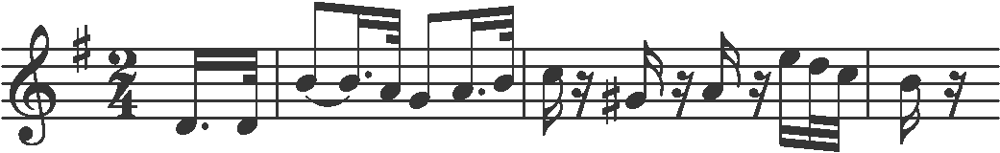

['**skern', '*clefG2', '*k[f#]', '*M2/4', '16.d', '32d', '=', '8b', '16.b', '32a', '8g', '16.a', '32b', '=', '16cc', '16r', '16g#', '16r', '16a', '16r', '16ee', '32dd', '32cc', '=', '16b', '16r']


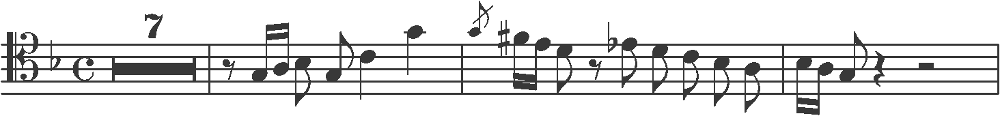

['**skern', '*clefC4', '*k[b-]', '*met(C)', '1r', '=', '8r', '16G', '16A', '8B-', '8G', '4c', '4g', '=', '8g/', '16f#', '16e', '8d', '8r', '8e-', '8d', '8c', '8B-', '8A', '=', '16B-', '16A', '8G', '4r', '2r', '=']


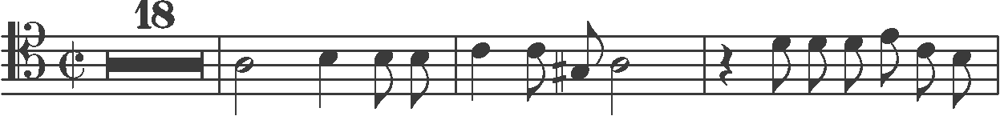

['**skern', '*clefC4', '*met(C)', '1r', '=', '2A', '4B', '8B', '8B', '=', '4c', '8c', '8G#', '2A', '=', '4r', '8d', '8d', '8d', '8e', '8c', '8B', '=']


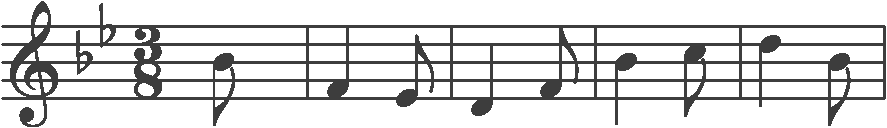

['**skern', '*clefG2', '*k[b-e-]', '*M3/8', '8b-', '=', '4f', '8e-', '=', '4d', '8f', '=', '4b-', '8cc', '=', '4dd', '8b-', '=']


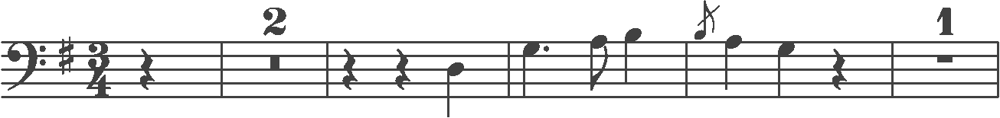

['**skern', '*clefF4', '*k[f#]', '*M3/4', '4r', '=', '1r', '=', '4r', '4r', '4D', '=', '4.G', '8A', '4B', '=', '8B/', '4A', '4G', '4r', '=', '1r', '=']


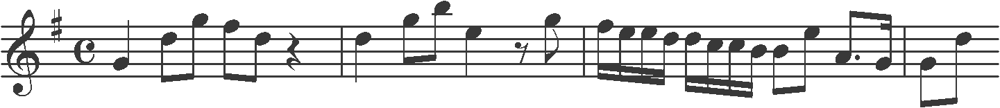

['**skern', '*clefG2', '*k[f#]', '*met(C)', '4g', '8dd', '8gg', '8ff#', '8dd', '4r', '=', '4dd', '8gg', '8bb', '4ee', '8r', '8gg', '=', '16ff#', '16ee', '16ee', '16dd', '16dd', '16cc', '16cc', '16b', '8b', '8ee', '8.a', '16g', '=', '8g', '8dd']


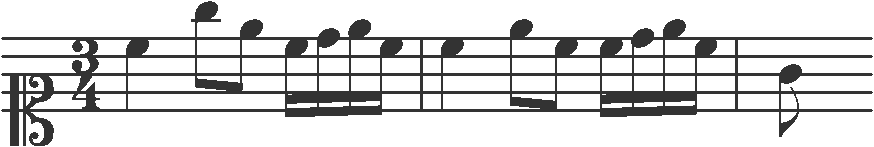

['**skern', '*clefC1', '*M3/4', '4cc', '8gg', '8ee', '16cc', '16dd', '16ee', '16cc', '=', '4cc', '8ee', '8cc', '16cc', '16dd', '16ee', '16cc', '=', '8g']


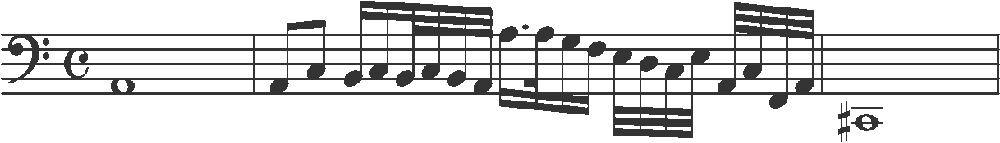

['**skern', '*clefF4', '*met(C)', '1AA', '=', '8AA', '8C', '16BB', '16C', '32BB', '32C', '32BB', '32AA', '16.A', '32A', '16G', '16F', '32E', '32D', '32C', '32E', '32AA', '32C', '32FF', '32AA', '=', '1CC#', '=']


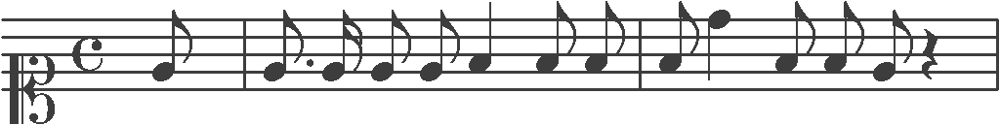

['**skern', '*clefC1', '*met(C)', '8e', '=', '8.e', '16e', '8e', '8e', '4f', '8f', '8f', '=', '8f', '4dd', '8f', '8f', '8e', '4r', '=']


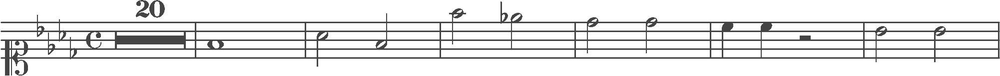

['**skern', '*clefC1', '*k[b-e-a-d-]', '*met(C)', '1r', '=', '1f', '=', '2a-', '2f', '=', '2ff', '2ee-', '=', '2dd-', '2dd-', '=', '4cc', '4cc', '2r', '=', '2b-', '2b-', '=']


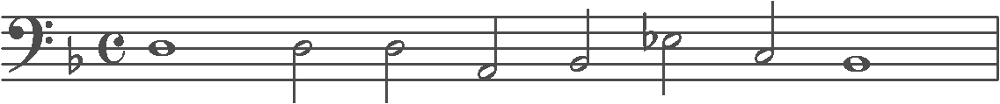

['**skern', '*clefF4', '*k[b-]', '*met(C)', '1D', '2D', '2D', '2AA', '2BB-', '2E-', '2C', '1BB-']


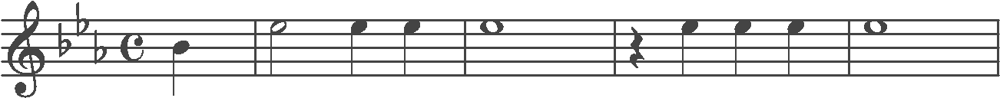

['**skern', '*clefG2', '*k[b-e-a-]', '*met(C)', '4b-', '=', '2ee-', '4ee-', '4ee-', '=', '1ee-', '=', '4r', '4ee-', '4ee-', '4ee-', '=', '1ee-', '=']


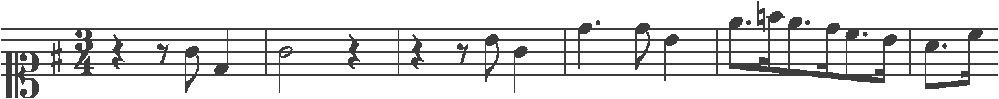

['**skern', '*clefC1', '*k[f#]', '*M3/4', '4r', '8r', '8g', '4d', '=', '2g', '4r', '=', '4r', '8r', '8b', '4g', '=', '4.dd', '8dd', '4b', '=', '8.ee', '16ff', '8.ee', '16dd', '8.cc', '16b', '=', '8.a', '16cc']


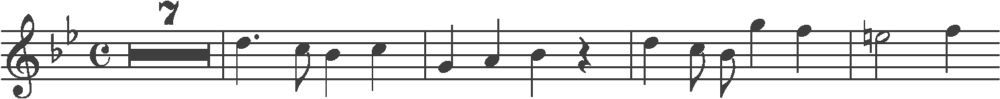

['**skern', '*clefG2', '*k[b-e-]', '*met(C)', '1r', '=', '4.dd', '8cc', '4b-', '4cc', '=', '4g', '4a', '4b-', '4r', '=', '4dd', '8cc', '8b-', '4gg', '4ff', '=', '2ee', '4ff']


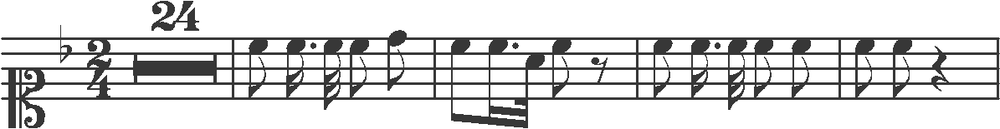

['**skern', '*clefC1', '*k[b-]', '*M2/4', '1r', '=', '8cc', '16.cc', '32cc', '8cc', '8dd', '=', '8cc', '16.cc', '32a', '8cc', '8r', '=', '8cc', '16.cc', '32cc', '8cc', '8cc', '=', '8cc', '8cc', '4r', '=']


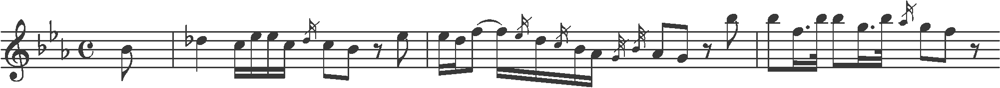

['**skern', '*clefG2', '*k[b-e-a-]', '*met(C)', '8b-', '=', '4dd-', '16cc', '16ee-', '16ee-', '16cc', '16dd-/', '8cc', '8b-', '8r', '8ee-', '=', '16ee-', '16dd', '8ff', '16ff', '16ee-/', '16dd', '16cc/', '16b-', '16a-', '32g/', '32b-/', '8a-', '8g', '8r', '8bb-', '=', '8bb-', '16.ff', '32bb-', '8bb-', '16.gg', '32bb-', '16aa-/', '8gg', '8ff', '8r']


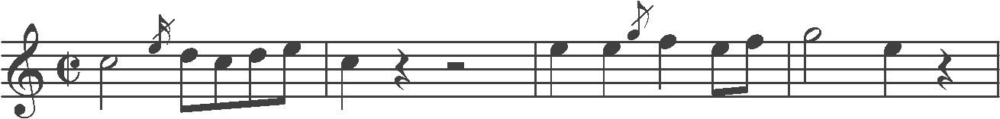

['**skern', '*clefG2', '*met(C)', '2cc', '16ee/', '8dd', '8cc', '8dd', '8ee', '=', '4cc', '4r', '2r', '=', '4ee', '4ee', '8gg/', '4ff', '8ee', '8ff', '=', '2gg', '4ee', '4r', '=']


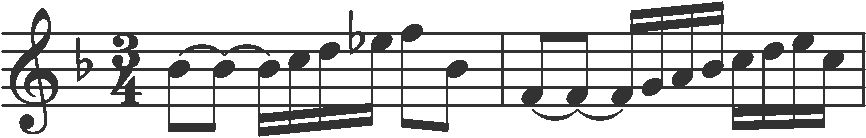

['**skern', '*clefG2', '*k[b-]', '*M3/4', '8b-', '8b-', '16b-', '16cc', '16dd', '16ee-', '8ff', '8b-', '=', '8f', '8f', '16f', '16g', '16a', '16b-', '16cc', '16dd', '16ee', '16cc', '=']


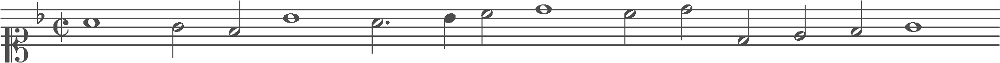

['**skern', '*clefC1', '*k[b-]', '*met(C)', '1a', '2g', '2f', '1b-', '2.a', '4b-', '2cc', '1dd', '2cc', '2dd', '2d', '2e', '2f', '1g']


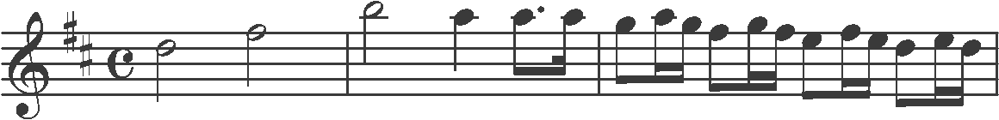

['**skern', '*clefG2', '*k[f#c#]', '*met(C)', '2dd', '2ff#', '=', '2bb', '4aa', '8.aa', '16aa', '=', '8gg', '16aa', '16gg', '8ff#', '16gg', '16ff#', '8ee', '16ff#', '16ee', '8dd', '16ee', '16dd', '=']


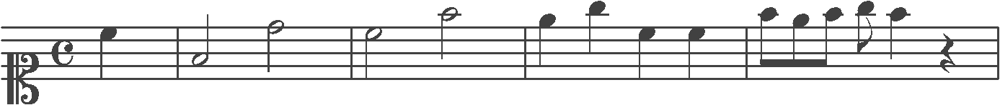

['**skern', '*clefC1', '*met(C)', '4cc', '=', '2f', '2dd', '=', '2cc', '2ff', '=', '4ee', '4gg', '4cc', '4cc', '=', '8ff', '8ee', '8ff', '8gg', '4ff', '4r', '=']


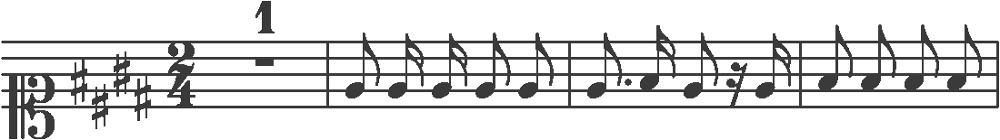

['**skern', '*clefC1', '*k[f#c#g#d#]', '*M2/4', '1r', '=', '8e', '16e', '16e', '8e', '8e', '=', '8.e', '16f#', '8e', '16r', '16e', '=', '8f#', '8f#', '8f#', '8f#', '=']


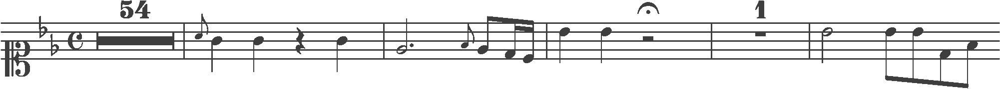

['**skern', '*clefC1', '*k[b-e-]', '*met(C)', '1r', '=', '8a/', '4g', '4g', '4r', '4g', '=', '2.e-', '8f/', '8e-', '16d', '16c', '=', '4b-', '4b-', '2r', '=', '1r', '=', '2b-', '8b-', '8b-', '8d', '8f', '=']


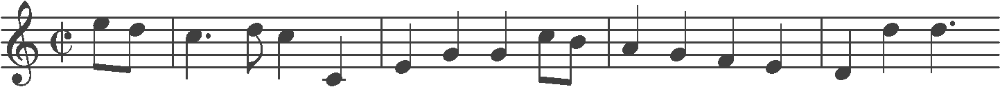

['**skern', '*clefG2', '*met(C)', '8ee', '8dd', '=', '4.cc', '8dd', '4cc', '4c', '=', '4e', '4g', '4g', '8cc', '8b', '=', '4a', '4g', '4f', '4e', '=', '4d', '4dd', '4.dd']


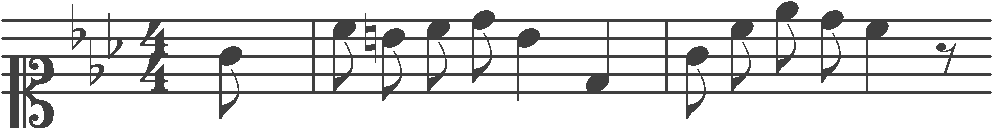

['**skern', '*clefC1', '*k[b-e-a-]', '*M4/4', '8g', '=', '8cc', '8b', '8cc', '8dd', '4b', '4d', '=', '8g', '8cc', '8ee-', '8dd', '4cc', '8r']


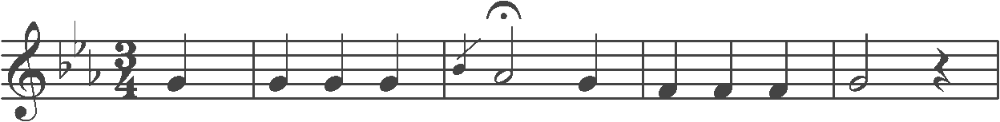

['**skern', '*clefG2', '*k[b-e-a-]', '*M3/4', '4g', '=', '4g', '4g', '4g', '=', '4b-/', '2a-', '4g', '=', '4f', '4f', '4f', '=', '2g', '4r', '=']


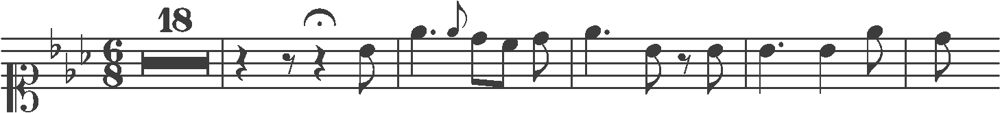

['**skern', '*clefC1', '*k[b-e-a-]', '*M6/8', '1r', '=', '4r', '8r', '4r', '8b-', '=', '4.ee-', '8ee-/', '8dd', '8cc', '8dd', '=', '4.ee-', '8b-', '8r', '8b-', '=', '4.b-', '4b-', '8ee-', '=', '8dd']


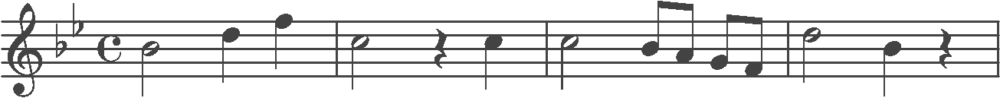

['**skern', '*clefG2', '*k[b-e-]', '*met(C)', '2b-', '4dd', '4ff', '=', '2cc', '4r', '4cc', '=', '2cc', '8b-', '8a', '8g', '8f', '=', '2dd', '4b-', '4r', '=']


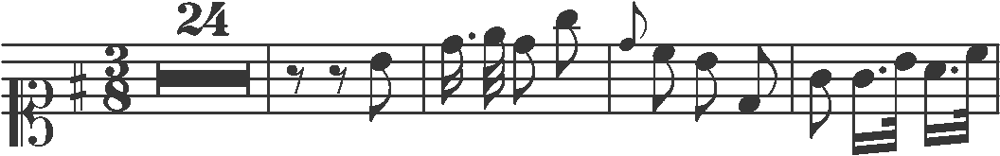

['**skern', '*clefC1', '*k[f#]', '*M3/8', '1r', '=', '8r', '8r', '8b', '=', '16.dd', '32ee', '8dd', '8gg', '=', '8dd/', '8cc', '8b', '8d', '=', '8g', '16.g', '32b', '16.a', '32cc', '=']


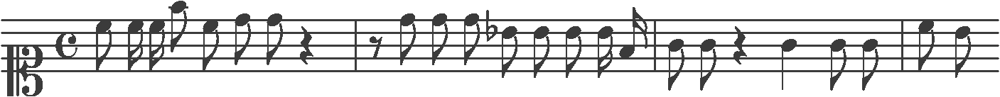

['**skern', '*clefC1', '*met(C)', '8cc', '16cc', '16cc', '8ff', '8cc', '8dd', '8dd', '4r', '=', '8r', '8dd', '8dd', '8dd', '8b-', '8b-', '8b-', '16b-', '16f', '=', '8g', '8g', '4r', '4g', '8g', '8g', '=', '8cc', '8b-']


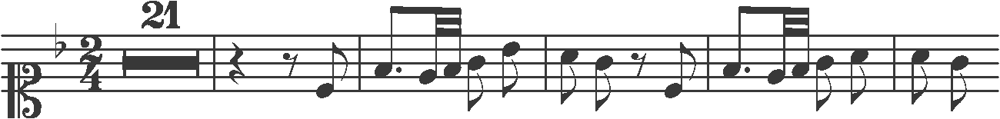

['**skern', '*clefC1', '*k[b-]', '*M2/4', '1r', '=', '4r', '8r', '8c', '=', '8.f', '32e', '32f', '8g', '8b-', '=', '8a', '8g', '8r', '8c', '=', '8.f', '32e', '32f', '8g', '8a', '=', '8a', '8g']


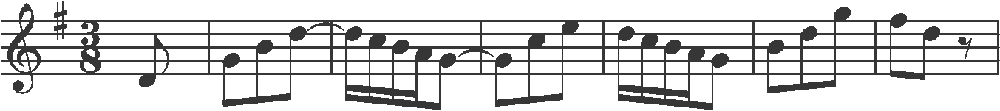

['**skern', '*clefG2', '*k[f#]', '*M3/8', '8d', '=', '8g', '8b', '8dd', '=', '16dd', '16cc', '16b', '16a', '8g', '=', '8g', '8cc', '8ee', '=', '16dd', '16cc', '16b', '16a', '8g', '=', '8b', '8dd', '8gg', '=', '8ff#', '8dd', '8r', '=']


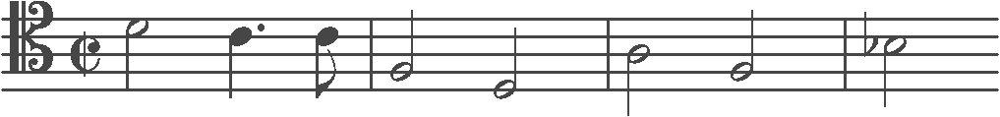

['**skern', '*clefC4', '*met(C)', '2d', '4.c', '8c', '=', '2F', '2D', '=', '2A', '2F', '=', '2B-']


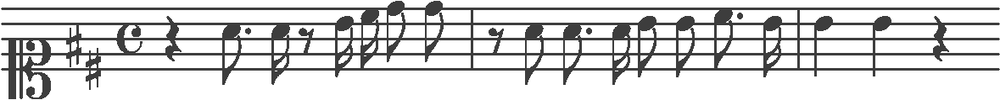

['**skern', '*clefC1', '*k[f#c#]', '*met(C)', '4r', '8.a', '16a', '8r', '16b', '16cc#', '8dd', '8dd', '=', '8r', '8a', '8.a', '16a', '8b', '8b', '8.cc#', '16b', '=', '4b', '4b', '4r']


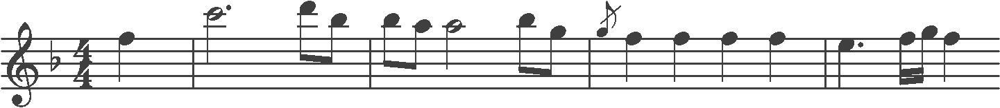

['**skern', '*clefG2', '*k[b-]', '*M4/4', '4ff', '=', '2.ccc', '8ddd', '8bb-', '=', '8bb-', '8aa', '2aa', '8bb-', '8gg', '=', '8gg/', '4ff', '4ff', '4ff', '4ff', '=', '4.ee', '16ff', '16gg', '4ff']


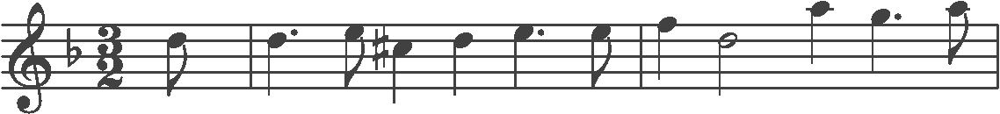

['**skern', '*clefG2', '*k[b-]', '*M3/2', '8dd', '=', '4.dd', '8ee', '4cc#', '4dd', '4.ee', '8ee', '=', '4ff', '2dd', '4aa', '4.gg', '8aa', '=']


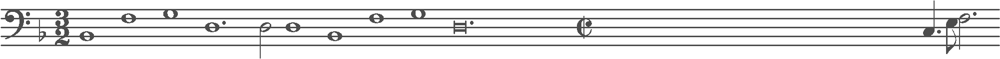

['**skern', '*clefF4', '*k[b-]', '*M3/2', '1BB-', '1F', '1G', '1.D', '2D', '1D', '1BB-', '1F', '1G', '0.D', '4.C', '8E', '2.F']


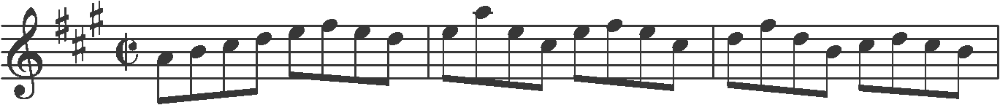

['**skern', '*clefG2', '*k[f#c#g#]', '*met(C)', '8a', '8b', '8cc#', '8dd', '8ee', '8ff#', '8ee', '8dd', '=', '8ee', '8aa', '8ee', '8cc#', '8ee', '8ff#', '8ee', '8cc#', '=', '8dd', '8ff#', '8dd', '8b', '8cc#', '8dd', '8cc#', '8b', '=']


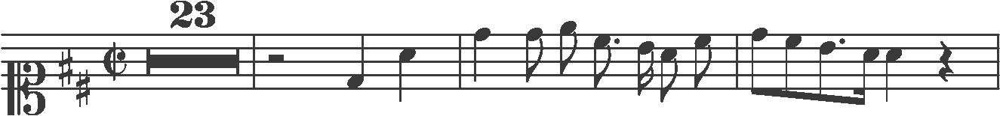

['**skern', '*clefC1', '*k[f#c#]', '*met(C)', '1r', '=', '2r', '4d', '4a', '=', '4dd', '8dd', '8ee', '8.cc#', '16b', '8a', '8cc#', '=', '8dd', '8cc#', '8.b', '16a', '4a', '4r', '=']


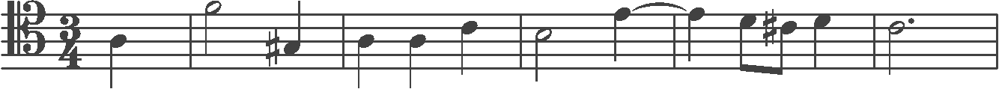

['**skern', '*clefC4', '*M3/4', '4A', '=', '2f', '4G#', '=', '4A', '4A', '4c', '=', '2B', '4e', '=', '4e', '8d', '8c#', '4d', '=', '2.c', '=']


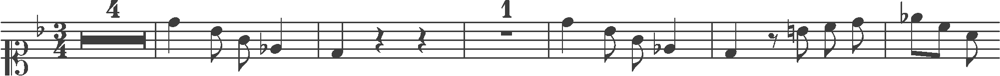

['**skern', '*clefC1', '*k[b-]', '*M3/4', '1r', '=', '4dd', '8b-', '8g', '4e-', '=', '4d', '4r', '4r', '=', '1r', '=', '4dd', '8b-', '8g', '4e-', '=', '4d', '8r', '8b', '8cc', '8dd', '=', '8ee-', '8cc', '8a']


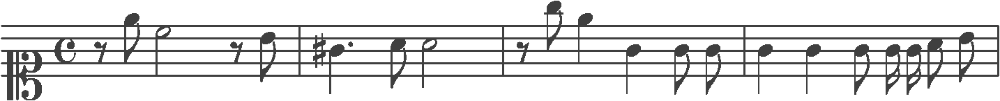

['**skern', '*clefC1', '*met(C)', '8r', '8ee', '2cc', '8r', '8b', '=', '4.g#', '8a', '2a', '=', '8r', '8gg#', '4ee', '4g#', '8g#', '8g#', '=', '4g#', '4g#', '8g#', '16g#', '16g#', '8a', '8b', '=']


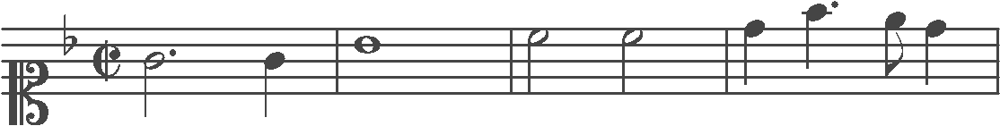

['**skern', '*clefC1', '*k[b-]', '*met(C)', '2.g', '4g', '=', '1b-', '=', '2cc', '2cc', '=', '4dd', '4.ff', '8ee', '4dd', '=']


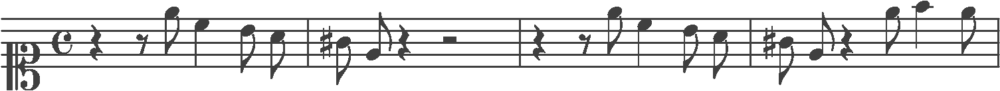

['**skern', '*clefC1', '*met(C)', '4r', '8r', '8ee', '4cc', '8b', '8a', '=', '8g#', '8e', '4r', '2r', '=', '4r', '8r', '8ee', '4cc', '8b', '8a', '=', '8g#', '8e', '4r', '8ee', '4ff', '8ee', '=']


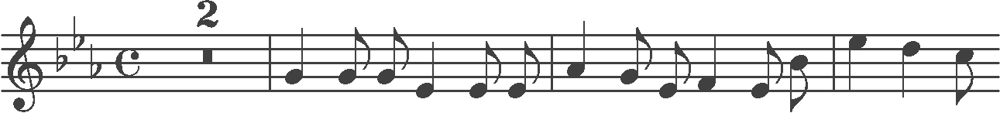

['**skern', '*clefG2', '*k[b-e-a-]', '*met(C)', '1r', '=', '4g', '8g', '8g', '4e-', '8e-', '8e-', '=', '4a-', '8g', '8e-', '4f', '8e-', '8b-', '=', '4ee-', '4dd', '8cc']


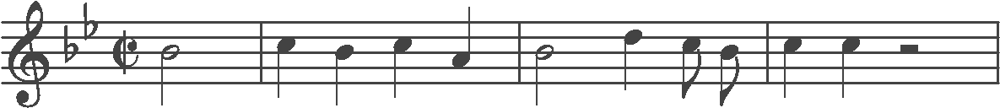

['**skern', '*clefG2', '*k[b-e-]', '*met(C)', '2b-', '=', '4cc', '4b-', '4cc', '4a', '=', '2b-', '4dd', '8cc', '8b-', '=', '4cc', '4cc', '2r', '=']


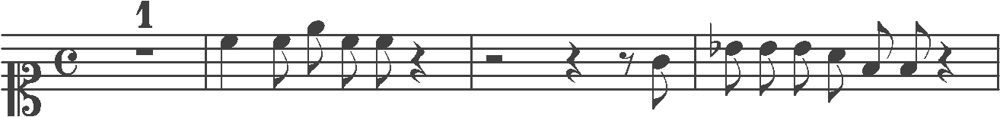

['**skern', '*clefC1', '*met(C)', '1r', '=', '4cc', '8cc', '8ee', '8cc', '8cc', '4r', '=', '2r', '4r', '8r', '8g', '=', '8b-', '8b-', '8b-', '8a', '8f', '8f', '4r', '=']


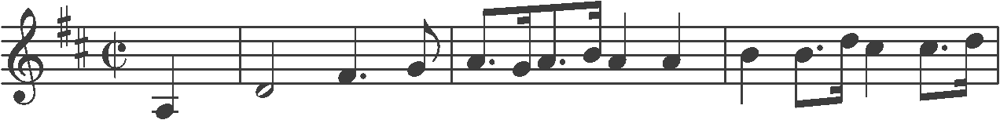

['**skern', '*clefG2', '*k[f#c#]', '*met(C)', '4A', '=', '2d', '4.f#', '8g', '=', '8.a', '16g', '8.a', '16b', '4a', '4a', '=', '4b', '8.b', '16dd', '4cc#', '8.cc#', '16dd', '=']


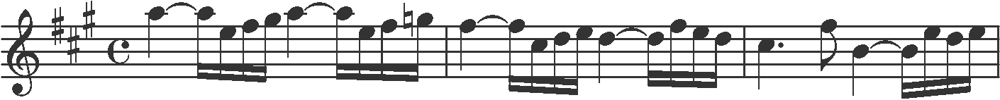

['**skern', '*clefG2', '*k[f#c#g#]', '*met(C)', '4aa', '16aa', '16ee', '16ff#', '16gg#', '4aa', '16aa', '16ee', '16ff#', '16gg', '=', '4ff#', '16ff#', '16cc#', '16dd', '16ee', '4dd', '16dd', '16ff#', '16ee', '16dd', '=', '4.cc#', '8ff#', '4b', '16b', '16ee', '16dd', '16ee', '=']


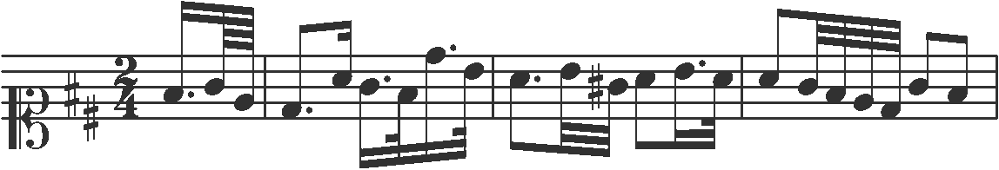

['**skern', '*clefC1', '*k[f#c#]', '*M2/4', '16.f#', '64g', '64e', '=', '8.d', '16a', '16.g', '32f#', '16.dd', '32b', '=', '8.a', '32b', '32g#', '8a', '16.b', '32a', '=', '8a', '32g', '32f#', '32e', '32d', '8g', '8f#', '=']


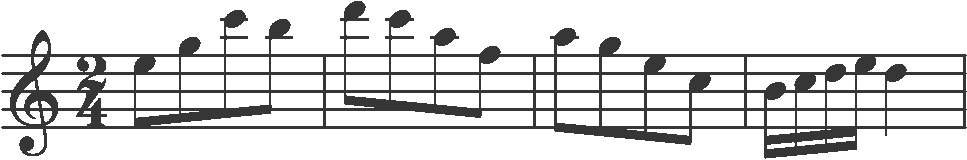

['**skern', '*clefG2', '*M2/4', '8ee', '8gg', '8ccc', '8bb', '=', '8ddd', '8ccc', '8aa', '8ff', '=', '8aa', '8gg', '8ee', '8cc', '=', '16b', '16cc', '16dd', '16ee', '4dd', '=']


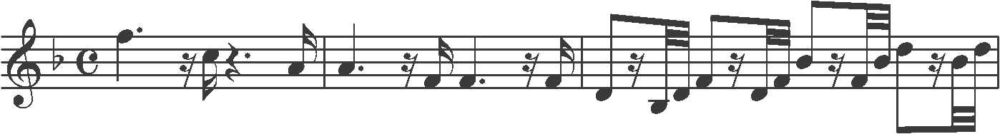

['**skern', '*clefG2', '*k[b-]', '*met(C)', '4.ff', '16r', '16cc', '4.r', '16a', '=', '4.a', '16r', '16f', '4.f', '16r', '16f', '=', '8d', '16r', '32B-', '32d', '8f', '16r', '32d', '32f', '8b-', '16r', '32f', '32b-', '8dd', '16r', '32b-', '32dd', '=']


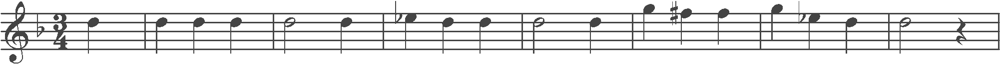

['**skern', '*clefG2', '*k[b-]', '*M3/4', '4dd', '=', '4dd', '4dd', '4dd', '=', '2dd', '4dd', '=', '4ee-', '4dd', '4dd', '=', '2dd', '4dd', '=', '4gg', '4ff#', '4ff#', '=', '4gg', '4ee-', '4dd', '=', '2dd', '4r', '=']


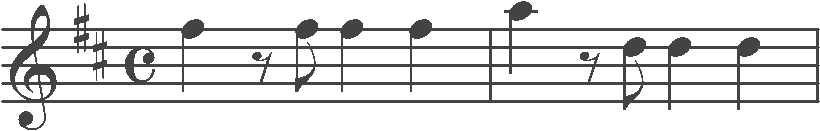

['**skern', '*clefG2', '*k[f#c#]', '*met(C)', '4ff#', '8r', '8ff#', '4ff#', '4ff#', '=', '4aa', '8r', '8dd', '4dd', '4dd', '=']


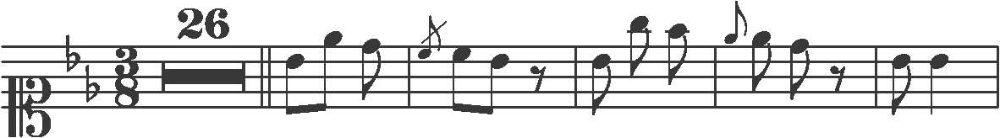

['**skern', '*clefC1', '*k[b-e-]', '*M3/8', '1r', '=', '8b-', '8ee-', '8dd', '=', '8cc/', '8cc', '8b-', '8r', '=', '8b-', '8gg', '8ff', '=', '8ee-/', '8ee-', '8dd', '8r', '=', '8b-', '4b-', '=']


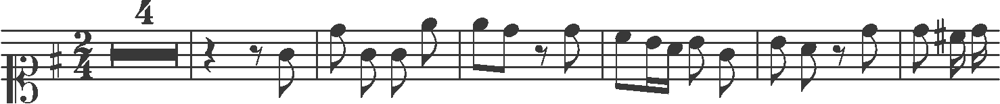

['**skern', '*clefC1', '*k[f#]', '*M2/4', '1r', '=', '4r', '8r', '8g', '=', '8dd', '8g', '8g', '8ee', '=', '8ee', '8dd', '8r', '8dd', '=', '8cc', '16b', '16a', '8b', '8g', '=', '8b', '8a', '8r', '8dd', '=', '8dd', '16cc#', '16dd']


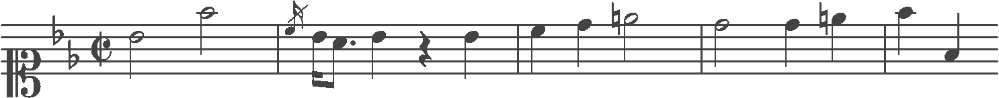

['**skern', '*clefC1', '*k[b-e-]', '*met(C)', '2b-', '2ff', '=', '16cc/', '16b-', '8.a', '4b-', '4r', '4b-', '=', '4cc', '4dd', '2ee', '=', '2dd', '4dd', '4ee', '=', '4ff', '4f']


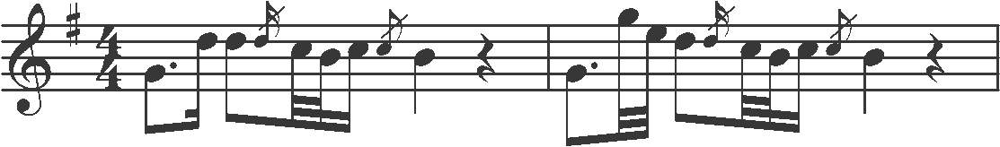

['**skern', '*clefG2', '*k[f#]', '*M4/4', '8.g', '16dd', '8dd', '16dd/', '32cc', '32b', '16cc', '8cc/', '4b', '4r', '=', '8.g', '32gg', '32ee', '8dd', '16dd/', '32cc', '32b', '16cc', '8cc/', '4b', '4r', '=']


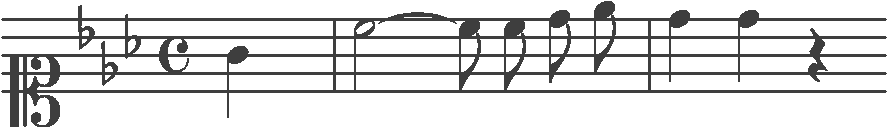

['**skern', '*clefC1', '*k[b-e-a-]', '*met(C)', '4g', '=', '2cc', '8cc', '8cc', '8dd', '8ee-', '=', '4dd', '4dd', '4r']


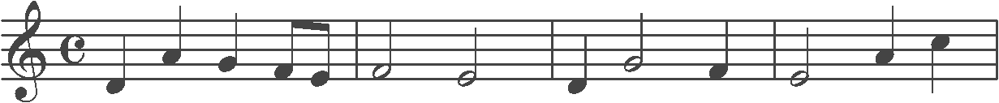

['**skern', '*clefG2', '*met(C)', '4d', '4a', '4g', '8f', '8e', '=', '2f', '2e', '=', '4d', '2g', '4f', '=', '2e', '4a', '4cc', '=']


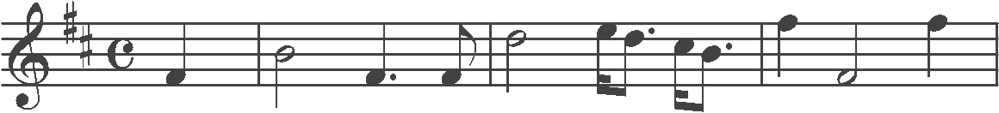

['**skern', '*clefG2', '*k[f#c#]', '*met(C)', '4f#', '=', '2b', '4.f#', '8f#', '=', '2dd', '16ee', '8.dd', '16cc#', '8.b', '=', '4ff#', '2f#', '4ff#', '=']


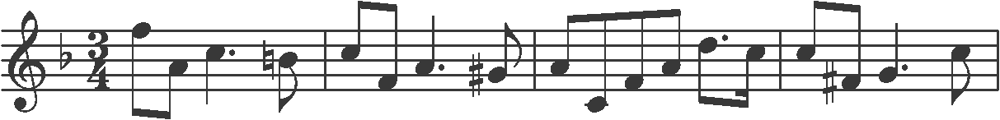

['**skern', '*clefG2', '*k[b-]', '*M3/4', '8ff', '8a', '4.cc', '8b', '=', '8cc', '8f', '4.a', '8g#', '=', '8a', '8c', '8f', '8a', '8.dd', '16cc', '=', '8cc', '8f#', '4.g', '8cc', '=']


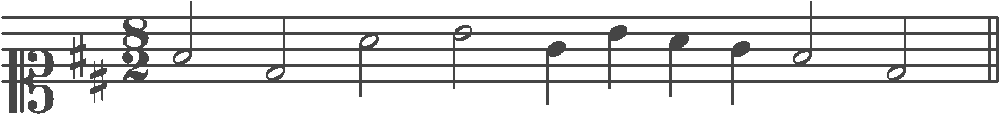

['**skern', '*clefC1', '*k[f#c#]', '*M8/2', '2f#', '2d', '2a', '2b', '4g', '4b', '4a', '4g', '2f#', '2d', '=']


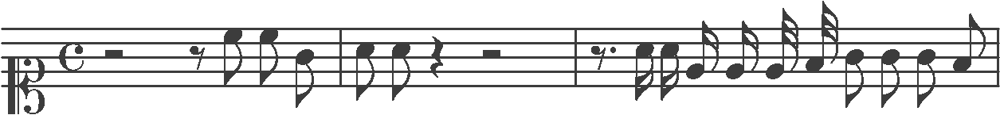

['**skern', '*clefC1', '*met(C)', '2r', '8r', '8cc', '8cc', '8g', '=', '8a', '8a', '4r', '2r', '=', '8.r', '16a', '16a', '16e', '16e', '32e', '32f', '8g', '8g', '8g', '8f', '=']


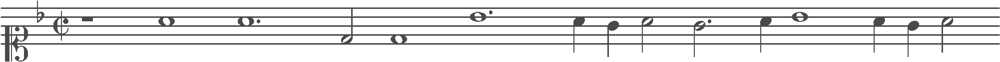

['**skern', '*clefC1', '*k[b-]', '*met(C)', '1r', '1a', '1.a', '2d', '1d', '1.b-', '4a', '4g', '2a', '2.g', '4a', '1b-', '4a', '4g', '2a']


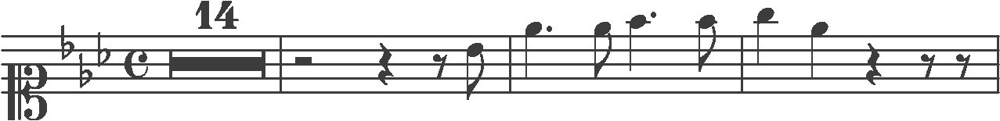

['**skern', '*clefC1', '*k[b-e-a-]', '*met(C)', '1r', '=', '2r', '4r', '8r', '8b-', '=', '4.ee-', '8ee-', '4.ff', '8ff', '=', '4gg', '4ee-', '4r', '8r', '8r', '=']


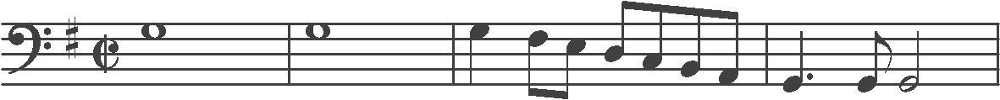

['**skern', '*clefF4', '*k[f#]', '*met(C)', '1G', '=', '1G', '=', '4G', '8F#', '8E', '8D', '8C', '8BB', '8AA', '=', '4.GG', '8GG', '2GG', '=']


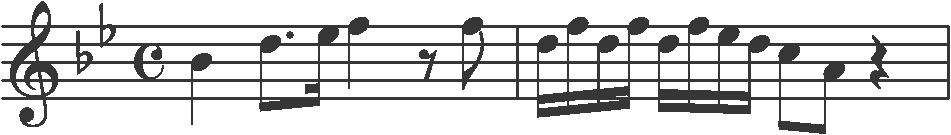

['**skern', '*clefG2', '*k[b-e-]', '*met(C)', '4b-', '8.dd', '16ee-', '4ff', '8r', '8ff', '=', '16dd', '16ff', '16dd', '16ff', '16dd', '16ff', '16ee-', '16dd', '8cc', '8a', '4r', '=']


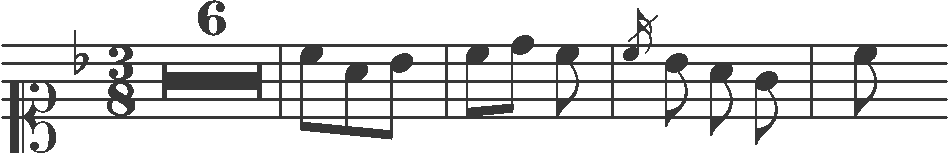

['**skern', '*clefC1', '*k[b-]', '*M3/8', '1r', '=', '8cc', '8a', '8b-', '=', '8cc', '8dd', '8cc', '=', '16cc/', '8b-', '8a', '8g', '=', '8cc']


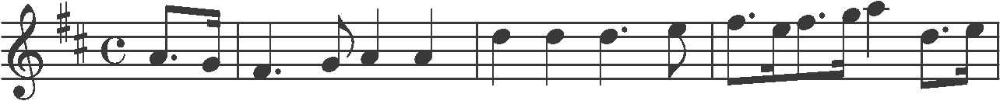

['**skern', '*clefG2', '*k[f#c#]', '*met(C)', '8.a', '16g', '=', '4.f#', '8g', '4a', '4a', '=', '4dd', '4dd', '4.dd', '8ee', '=', '8.ff#', '16ee', '8.ff#', '16gg', '4aa', '8.dd', '16ee', '=']


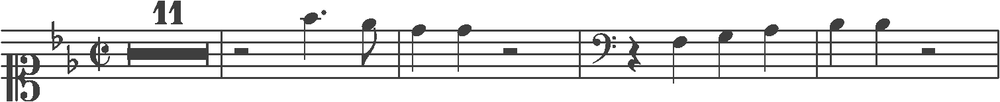

['**skern', '*clefC1', '*k[b-e-]', '*met(C)', '1r', '=', '2r', '4.ff', '8ee-', '=', '4dd', '4dd', '2r', '=', '*clefF4', '4r', '4F', '4G', '4A', '=', '4B-', '4B-', '2r', '=']


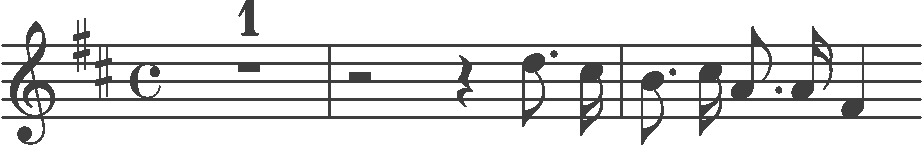

['**skern', '*clefG2', '*k[f#c#]', '*met(C)', '1r', '=', '2r', '4r', '8.dd', '16cc#', '=', '8.b', '16cc#', '8.a', '16a', '4f#']


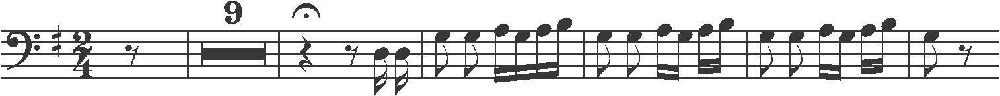

['**skern', '*clefF4', '*k[f#]', '*M2/4', '8r', '=', '1r', '=', '4r', '8r', '16D', '16D', '=', '8G', '8G', '16A', '16G', '16A', '16B', '=', '8G', '8G', '16A', '16G', '16A', '16B', '=', '8G', '8G', '16A', '16G', '16A', '16B', '=', '8G', '8r']


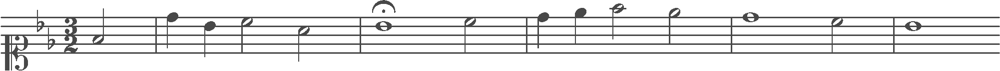

['**skern', '*clefC1', '*k[b-e-]', '*M3/2', '2f', '=', '4dd', '4b-', '2cc', '2a', '=', '1b-', '2cc', '=', '4dd', '4ee-', '2ff', '2ee-', '=', '1dd', '2cc', '=', '1b-']


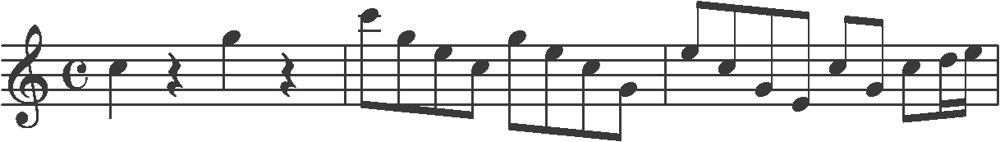

['**skern', '*clefG2', '*met(C)', '4cc', '4r', '4gg', '4r', '=', '8ccc', '8gg', '8ee', '8cc', '8gg', '8ee', '8cc', '8g', '=', '8ee', '8cc', '8g', '8e', '8cc', '8g', '8cc', '16dd', '16ee', '=']


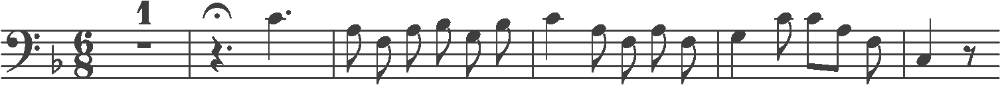

['**skern', '*clefF4', '*k[b-]', '*M6/8', '1r', '=', '4.r', '4.c', '=', '8A', '8F', '8A', '8B-', '8G', '8B-', '=', '4c', '8A', '8F', '8A', '8F', '=', '4G', '8c', '8c', '8A', '8F', '=', '4C', '8r']


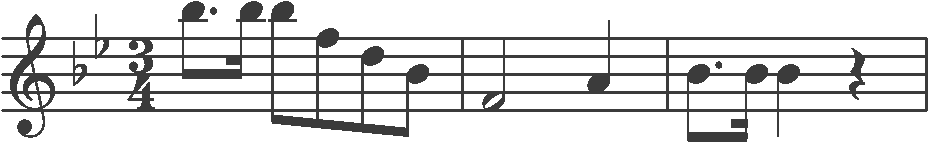

['**skern', '*clefG2', '*k[b-e-]', '*M3/4', '8.bb-', '16bb-', '8bb-', '8ff', '8dd', '8b-', '=', '2f', '4a', '=', '8.b-', '16b-', '4b-', '4r', '=']
0
88
88


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  from ipykernel import kernelapp as app


In [ ]:
count = 0
print(len(XPrimus))
print(len(YPrimus))
XPrimus = XPrimus.tolist()
YPrimus = YPrimus.tolist()
for i, val in enumerate(XPrimus):
  if XPrimus[i] is None:
    count += 1
    XPrimus.pop(i)
    YPrimus.pop(i)
    continue
  #cv2_imshow(XPrimus[i])
  print(YPrimus[i])
XPrimus = np.array(XPrimus)
YPrimus = np.array(YPrimus)
print(count)
print(len(XPrimus))
print(len(YPrimus))

In [ ]:
def LoadCameraPrimusImages(dataFile, path):
    X = []
    read_images = 0
    loadedSamples = 0
    with open(dataFile, "r") as paths:
        line = paths.readline()
        print(line)
        while line:
            read_images += 1
            img_path = f'{path}/{line[:-1]}.png'
            #print(img_path)
            image = imread(img_path, False)
            X.append(image)
            line = paths.readline()
            #print("Image read")
            print(read_images)

    return np.array(X)

000106149-1_1_1
Picture not found
100029584-1_1_1


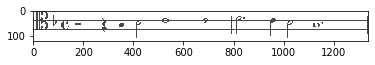

**skern
*clefC4
*k[b-]
*met(C)
2r
4r
4A
2B-
1c
2c
=
2.d
4c
2B-
1.A

110003139-1_1_1
Picture not found
000107944-1_1_1
Picture not found
220016134-1_1_1


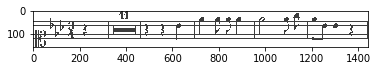

**skern
*clefC1
*k[b-e-a-]
*M3/4
4r
=
1r
=
4r
4r
4b-
=
4ee-
8ee-
8ee-
4ee-
=
2ee-
8ee-
8gg
=
8ee-
8b-
4b-
4r
=



In [ ]:
import os
import cv2
import json

path = "/content/drive/MyDrive/Bachelorarbeit/Primus"
kern_path = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/primus-kern/primus/primus_kern.json"

with open(kern_path, "r") as f:
    json_file = json.load(f)
    for img in json_file['regions'][:5]:
      img_name = img['image_name']
      kern = img['semantic']
      try:
        img_path = f'{path}/{img_name}/{img_name}.png'
        #print(img_name)
        #img = loadImage(img_path)
        #draw(img)
        print(kern.replace(";", ""))
      except:
          print("Picture not found")

In [ ]:
def test_resize (X):
    X_train = []
    for i in X:
      X_train.append(cv2.resize(i, (128, 64)))
    
    return np.asarray(X_train)

In [ ]:
def createNewModel(input_shape, vocabulary_size):
    conv_filters = [16,32,64]

    input_data = tf.keras.layers.Input(name='the_input', shape=input_shape, dtype='float32')

    # Convolution layer
    inner = tf.keras.layers.Conv2D(conv_filters[0], 3, padding='same', name='conv1')(input_data)
    inner = tf.keras.layers.BatchNormalization()(inner)
    inner = tf.keras.layers.LeakyReLU(alpha=0.2)(inner)
    inner = tf.keras.layers.MaxPooling2D(pool_size=(2, 2), name='max1')(inner)

    inner = tf.keras.layers.Conv2D(conv_filters[1], 3, padding='same', name='conv2')(inner)
    inner = tf.keras.layers.BatchNormalization()(inner)
    inner = tf.keras.layers.LeakyReLU(alpha=0.2)(inner)
    inner = tf.keras.layers.MaxPooling2D(pool_size=(2, 1), name='max2')(inner)

    inner = tf.keras.layers.Conv2D(conv_filters[2], 3, padding='same')(inner)
    inner = tf.keras.layers.BatchNormalization()(inner)
    inner = tf.keras.layers.LeakyReLU(alpha=0.2)(inner)
    inner = tf.keras.layers.MaxPooling2D(pool_size=(2, 1))(inner)

    # CNN to RNN
    inner = tf.keras.layers.Permute((2, 1, 3))(inner)
    inner = tf.keras.layers.Reshape(target_shape=(-1, (input_shape[0] // (2 ** 3)) * conv_filters[-1]), name='reshape')(inner)

    # RNN layer
    inner = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64, return_sequences = True, dropout=0.25))(inner)

    inner = tf.keras.layers.Dense(vocabulary_size+1, name='dense2')(inner)
    y_pred = tf.keras.layers.Activation('softmax', name='softmax')(inner)

    labels = tf.keras.layers.Input(name='the_labels',shape=[None], dtype='float32')
    input_length = tf.keras.layers.Input(name='input_length', shape=[1], dtype='int64')
    label_length = tf.keras.layers.Input(name='label_length', shape=[1], dtype='int64')

    loss_out = tf.keras.layers.Lambda(
        ctc_lambda_func, output_shape=(1,),name='ctc')([y_pred, labels, input_length, label_length])

    model = tf.keras.models.Model(inputs=[input_data, labels, input_length, label_length],
                outputs=loss_out)

    model.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer='adam')


    return model

In [ ]:
path = '/content/drive/My Drive/Bachelorarbeit/Liedblätter'
XLiedBlatter, YLiedBlatter = LoadLiedBlatterDataset(path)
w2i, i2w = check_and_retrieveVocabulary([YLiedBlatter], "./e2evocabulary")
fixed_height = 64

TrainProcess(XLiedBlatter, YLiedBlatter, w2i, i2w, None)

TypeError: ignored

In [ ]:
def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    # the 2 is critical here since the first couple outputs of the RNN
    # tend to be garbage:
    y_pred = y_pred[:, 2:, :]
    
    return K.ctc_batch_cost(labels, y_pred, input_length, label_length)

In [ ]:
img_w, img_h = 128, 64

# Network parameters
batch_size = 128
val_batch_size = 16

downsample_factor = 4

vocabulary_size = len(w2i)
max_label_length = 10

In [ ]:
def get_Model(training):
     input_shape = (img_w, img_h, 1)     # (128, 64, 1)

     # Make Networkw
     inputs = Input(name='the_input', shape=input_shape, dtype='float32')  # (None, 128, 64, 1)

     # Convolution layer (VGG)
     inner = Conv2D(64, (3, 3), padding='same', name='conv1', kernel_initializer='he_normal')(inputs)  # (None, 128, 64, 64)
     inner = BatchNormalization()(inner)
     inner = Activation('relu')(inner)
     inner = MaxPooling2D(pool_size=(2, 2), name='max1')(inner)  # (None,64, 32, 64)

     inner = Conv2D(128, (3, 3), padding='same', name='conv2', kernel_initializer='he_normal')(inner)  # (None, 64, 32, 128)
     inner = BatchNormalization()(inner)
     inner = Activation('relu')(inner)
     inner = MaxPooling2D(pool_size=(2, 2), name='max2')(inner)  # (None, 32, 16, 128)

     inner = Conv2D(256, (3, 3), padding='same', name='conv3', kernel_initializer='he_normal')(inner)  # (None, 32, 16, 256)
     inner = BatchNormalization()(inner)
     inner = Activation('relu')(inner)
     inner = Conv2D(256, (3, 3), padding='same', name='conv4', kernel_initializer='he_normal')(inner)  # (None, 32, 16, 256)
     inner = BatchNormalization()(inner)
     inner = Activation('relu')(inner)
     inner = MaxPooling2D(pool_size=(1, 2), name='max3')(inner)  # (None, 32, 8, 256)

     inner = Conv2D(512, (3, 3), padding='same', name='conv5', kernel_initializer='he_normal')(inner)  # (None, 32, 8, 512)
     inner = BatchNormalization()(inner)
     inner = Activation('relu')(inner)
     inner = Conv2D(512, (3, 3), padding='same', name='conv6')(inner)  # (None, 32, 8, 512)
     inner = BatchNormalization()(inner)
     inner = Activation('relu')(inner)
     inner = MaxPooling2D(pool_size=(1, 2), name='max4')(inner)  # (None, 32, 4, 512)

     inner = Conv2D(512, (2, 2), padding='same', kernel_initializer='he_normal', name='con7')(inner)  # (None, 32, 4, 512)
     inner = BatchNormalization()(inner)
     inner = Activation('relu')(inner)

     # CNN to RNN
     # Alternativ: Timedistributed
     inner = Reshape(target_shape=((32, 2048)), name='reshape')(inner)  # (None, 32, 2048)
     inner = Dense(64, activation='relu', kernel_initializer='he_normal', name='dense1')(inner)  # (None, 32, 64)

#     # RNN layer
     lstm_1 = LSTM(256, return_sequences=True, kernel_initializer='he_normal', name='lstm1')(inner)  # (None, 32, 512)
     lstm_1b = LSTM(256, return_sequences=True, go_backwards=True, kernel_initializer='he_normal', name='lstm1_b')(inner)
     reversed_lstm_1b = Lambda(lambda inputTensor: K.reverse(inputTensor, axes=1)) (lstm_1b)

     lstm1_merged = add([lstm_1, reversed_lstm_1b])  # (None, 32, 512)
     lstm1_merged = BatchNormalization()(lstm1_merged)
    
     lstm_2 = LSTM(256, return_sequences=True, kernel_initializer='he_normal', name='lstm2')(lstm1_merged)
     lstm_2b = LSTM(256, return_sequences=True, go_backwards=True, kernel_initializer='he_normal', name='lstm2_b')(lstm1_merged)
     reversed_lstm_2b= Lambda(lambda inputTensor: K.reverse(inputTensor, axes=1)) (lstm_2b)

     lstm2_merged = concatenate([lstm_2, reversed_lstm_2b])  # (None, 32, 1024)
     lstm2_merged = BatchNormalization()(lstm2_merged)

     # transforms RNN output to character activations:
     inner = Dense(vocabulary_size+1, kernel_initializer='he_normal',name='dense2')(lstm2_merged) #(None, 32, 63)
     y_pred = Activation('softmax', name='softmax')(inner)

     labels = Input(name='the_labels', shape=[max_label_length], dtype='float32') # (None ,8)
     input_length = Input(name='input_length', shape=[1], dtype='int64')     # (None, 1)
     label_length = Input(name='label_length', shape=[1], dtype='int64')     # (None, 1)

#     # Keras doesn't currently support loss funcs with extra parameters
#     # so CTC loss is implemented in a lambda layer
     loss_out = Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([y_pred, labels, input_length, label_length]) #(None, 1)


     if training:
         return Model(inputs=[inputs, labels, input_length, label_length], outputs=loss_out)
     else:
         return Model(inputs=[inputs], outputs=y_pred)

In [ ]:
model.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer='adam')


model.fit(X, Y_Train, epochs=5, batch_size=4)

NameError: ignored

In [ ]:
import os
import cv2
import json

path = "/content/drive/MyDrive/Bachelorarbeit/Primus"
kern_path = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/primus-kern/primus/primus_kern.json"

staves = os.listdir(path)

# with open(kern_path, "r") as f:
#json_file = json.load(f)
train_datalist = []
val_datalist = []
val_size = 0.10
X = staves
XTrain = X[int(len(X)*val_size):]
XVal = X[:int(len(X)*val_size)]
for name in XTrain:
    train_datalist.append(name)
for name in XVal:
    val_datalist.append(name)
print(len(train_datalist))
print(len(val_datalist))

with open("train_datalist.txt", "w") as t:
    for element in train_datalist:
        t.write(f'{element}\n')

with open("val_datalist.txt", "w") as v:
    for element in val_datalist:
        v.write(f'{element}\n')  

33138
3681


In [ ]:
def LoadCameraPrimusImagesWithoutFolderStructure(dataFile, path):
    X = []
    read_images = 0
    loadedSamples = 0
    with open(dataFile, "r") as paths:
        lines = paths.readlines()
        for line in lines:
            print(psutil.virtual_memory().available)
            read_images += 1
            img_path = f'{path}/{line[:-1]}.png'
            print(f'{read_images}:{line}')
            #image = imread(img_path, False)
            image = cv2.resize(imread(img_path,False), (0,0), fx=0.5, fy=0.5)
            X.append(image)
            print(X[-1].shape)

    return np.array(X)

In [ ]:
import tensorflow as tf
import numpy as np
import itertools



#Edit distance calculation
def levenshtein(a,b):
    "Computes the Levenshtein distance between a and b."
    n, m = len(a), len(b)

    if n > m:
        a,b = b,a
        n,m = m,n

    current = range(n+1)
    for i in range(1,m+1):
        previous, current = current, [i]+[0]*n
        for j in range(1,n+1):
            add, delete = previous[j]+1, current[j-1]+1
            change = previous[j-1]
            if a[j-1] != b[i-1]:
                change = change + 1
            current[j] = min(add, delete, change)

    return current[n]

def validateE2E(model, X, Y, i2w):
    acc_ed_ser = 0
    acc_ed_cer = 0
    acc_len_ser = 0
    acc_len_cer = 0

    for i in range(len(X)):
        pred = model.predict(np.expand_dims(np.expand_dims(X[i],axis=0),axis=-1))[0]

        out_best = np.argmax(pred,axis=1)

        # Greedy decoding (TODO Cambiar por la funcion analoga del backend de keras)
        out_best = [k for k, g in itertools.groupby(list(out_best))]
        decoded = []
        for c in out_best:
            if c < len(i2w):  # CTC Blank must be ignored
                decoded.append(i2w[c])

        groundtruth = [i2w[label] for label in Y[i]]
        acc_len_ser += len(Y[i])
        acc_ed_ser += levenshtein(decoded, groundtruth)

        separator = ""
        concatPrediction = separator.join(decoded)
        concatGT = separator.join(groundtruth)

        acc_len_cer += len(concatGT)
        acc_ed_cer += levenshtein(concatPrediction, concatGT)


    ser = 100. * acc_ed_ser / acc_len_ser
    cer = 100. * acc_ed_cer / acc_len_cer
    print("Validating with {} samples: {} SER".format(len(Y), str(ser)))
    print("Validating with {} samples: {} CER".format(len(Y), str(cer)))
    return ser, cer

class E2EModel:

    #Constructor which creates two models
    def __init__(self):
        pass
        # Nota: el modelo que se entrena es el que lleva ctc (model_tr) pero para guardarlo usamos el que no (model_pr)
    
    @staticmethod
    def ctc_lambda_func(args):
        y_pred, labels, input_length, label_length = args
        y_pred = y_pred[:, :, :]
        return tf.keras.backend.ctc_batch_cost(labels, y_pred, input_length, label_length)

    def createNewModel(self, input_shape, vocabulary_size):
        conv_filters = [1, 32,64,128, 128, 256]

        input_data = tf.keras.layers.Input(name='the_input', shape=input_shape, dtype='float32')

        inner = tf.keras.layers.Conv2D(conv_filters[0], 5, padding='same', name='conv1')(input_data)
        inner = tf.keras.layers.BatchNormalization()(inner)
        inner = tf.keras.layers.ReLU()(inner)
        inner = tf.keras.layers.MaxPooling2D(pool_size=(2, 2), name='max1')(inner)

        inner = tf.keras.layers.Conv2D(conv_filters[1], 5, padding='same', name='conv2')(inner)
        inner = tf.keras.layers.BatchNormalization()(inner)
        inner = tf.keras.layers.ReLU()(inner)
        inner = tf.keras.layers.MaxPooling2D(pool_size=(2, 2), name='max2')(inner)

        inner = tf.keras.layers.Conv2D(conv_filters[2], 3, padding='same')(inner)
        inner = tf.keras.layers.BatchNormalization()(inner)
        inner = tf.keras.layers.ReLU()(inner)
        inner = tf.keras.layers.MaxPooling2D(pool_size=(1, 2))(inner)

        inner = tf.keras.layers.Conv2D(conv_filters[3], 3, padding='same')(inner)
        inner = tf.keras.layers.BatchNormalization()(inner)
        inner = tf.keras.layers.ReLU()(inner)
        inner = tf.keras.layers.MaxPooling2D(pool_size=(1, 2))(inner)

        inner = tf.keras.layers.Conv2D(conv_filters[4], 3, padding='same')(inner)
        inner = tf.keras.layers.BatchNormalization()(inner)
        inner = tf.keras.layers.ReLU()(inner)
        inner = tf.keras.layers.MaxPooling2D(pool_size=(1, 2))(inner)

        inner = tf.keras.layers.Permute((2, 1, 3))(inner)
        inner = tf.keras.layers.Reshape(target_shape=(-1, (input_shape[0] // (2 ** 3)) * conv_filters[-1]), name='reshape')(inner)

        inner = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(256, return_sequences = True, dropout=0.25))(inner)

        inner = tf.keras.layers.Dense(vocabulary_size+1, name='dense2')(inner)
        y_pred = tf.keras.layers.Activation('softmax', name='softmax')(inner)

        self.model_pr = tf.keras.models.Model(inputs=input_data, outputs=y_pred)
        self.model_pr.summary()

        labels = tf.keras.layers.Input(name='the_labels',shape=[None], dtype='float32')
        input_length = tf.keras.layers.Input(name='input_length', shape=[1], dtype='int64')
        label_length = tf.keras.layers.Input(name='label_length', shape=[1], dtype='int64')

        loss_out = tf.keras.layers.Lambda(
            E2EModel.ctc_lambda_func, output_shape=(1,),
            name='ctc')([y_pred, labels, input_length, label_length])

        self.model_tr = tf.keras.models.Model(inputs=[input_data, labels, input_length, label_length],
                    outputs=loss_out)

        self.model_tr.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer='adam')

    #Constructor which loads a pretrained model
    def createModelFromFile(self, modelpath):
        self.model_pr = tf.keras.models.load_model(modelpath, custom_objects = {'<lambda>': lambda y_true, y_pred: y_pred})
        #We have to reconstruct the prediction models based on the first one information
        labels = tf.keras.layers.Input(name='the_labels',shape=[None], dtype='float32')
        input_length = tf.keras.layers.Input(name='input_length', shape=[1], dtype='int64')
        label_length = tf.keras.layers.Input(name='label_length', shape=[1], dtype='int64')

        loss_out = tf.keras.layers.Lambda(
            E2EModel.ctc_lambda_func, output_shape=(1,),
            name='ctc')([self.model_pr.get_layer('the_input'), labels, input_length, label_length])

        self.model_tr = tf.keras.models.Model(inputs=[self.model_pr.get_layer('softmax'), labels, input_length, label_length],
                    outputs=loss_out)
        pass
    
    def train(self, X_train, Y_train, L_train, T_train):
        print('Training with ' + str(X_train.shape[0]) + ' samples.')
    
        inputs = {  'the_input': X_train,
                    'the_labels': Y_train,
                    'input_length': L_train,
                    'label_length': T_train,
                 }
    
        outputs = {'ctc': np.zeros([len(X_train)])}

        self.model_tr.fit(inputs,outputs, batch_size =4, epochs =5, verbose = 2)
        
        pass

    def evaluate(self, XValidate, YValidate, i2w):
        acc_ed_ser = 0
        acc_ed_cer = 0
        acc_len_ser = 0
        acc_len_cer = 0

        for i in range(len(XValidate)):
            pred = self.model_pr.predict(np.expand_dims(np.expand_dims(XValidate[i],axis=0),axis=-1))[0]

            out_best = np.argmax(pred,axis=1)

            # Greedy decoding (TODO Cambiar por la funcion analoga del backend de keras)
            out_best = [k for k, g in itertools.groupby(list(out_best))]
            decoded = []
            for c in out_best:
                if c < len(i2w):  # CTC Blank must be ignored
                    decoded.append(i2w[c])

            groundtruth = [i2w[label] for label in YValidate[i]]
            acc_len_ser += len(YValidate[i])
            acc_ed_ser += levenshtein(decoded, groundtruth)

            separator = ""
            concatPrediction = separator.join(decoded)
            concatGT = separator.join(groundtruth)

            acc_len_cer += len(concatGT)
            acc_ed_cer += levenshtein(concatPrediction, concatGT)


        ser = 100. * acc_ed_ser / acc_len_ser
        cer = 100. * acc_ed_cer / acc_len_cer
        print("Validating with {} samples: {} SER".format(len(YValidate), str(ser)))
        print("Validating with {} samples: {} CER".format(len(YValidate), str(cer)))
        
        return ser, cer
    
    def saveModel(self, path):
        self.model_pr.save(path)
        pass

    
    

# END2END


## Load Models

In [ ]:
sae_model_path = '/content/drive/MyDrive/Bachelorarbeit/models/SAE_Model'
crnn_model_path = '/content/drive/MyDrive/Bachelorarbeit/models/architecture_2/cprimus_fmt_rls/e2e_checkpoints/model-primus_fmt_rls-44.38-64h.h5'

sae_model = load_model(sae_model_path)
crnn_model = load_model(crnn_model_path)

## Load Data

In [37]:
# Größerer Traingssatz
path = '/content/drive/My Drive/Bachelorarbeit/staff'
original_dict = create_data_dict(path)
channel = 1
x, y = preprocess_training_data(path, original_dict, channel)

  0%|          | 0/328 [00:00<?, ?it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00001.jpg


  0%|          | 1/328 [00:01<06:57,  1.28s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00002.jpg


  1%|          | 2/328 [00:02<06:30,  1.20s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00003.jpg


  1%|          | 3/328 [00:03<06:04,  1.12s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00004.jpg


  1%|          | 4/328 [00:04<05:59,  1.11s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00005.jpg


  2%|▏         | 5/328 [00:05<05:44,  1.07s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00006.jpg


  2%|▏         | 6/328 [00:06<05:38,  1.05s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00007.jpg


  2%|▏         | 7/328 [00:07<05:36,  1.05s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00008.jpg


  2%|▏         | 8/328 [00:08<05:31,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00009.jpg


  3%|▎         | 9/328 [00:09<05:30,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00010.jpg


  3%|▎         | 10/328 [00:10<05:19,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00015.jpg


  3%|▎         | 11/328 [00:11<05:05,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00016.jpg


  4%|▎         | 12/328 [00:12<05:13,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00017.jpg


  4%|▍         | 13/328 [00:13<05:08,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00018.jpg


  4%|▍         | 14/328 [00:13<04:36,  1.13it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00019.jpg


  5%|▍         | 15/328 [00:14<04:58,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00020.jpg


  5%|▍         | 16/328 [00:15<04:53,  1.06it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00021.jpg


  5%|▌         | 17/328 [00:16<04:43,  1.10it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00024.jpg


  5%|▌         | 18/328 [00:17<04:34,  1.13it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00025.jpg


  6%|▌         | 19/328 [00:18<04:34,  1.13it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00026.jpg


  6%|▌         | 20/328 [00:19<04:46,  1.07it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00027.jpg


  6%|▋         | 21/328 [00:20<04:42,  1.09it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00028.jpg


  7%|▋         | 22/328 [00:21<04:46,  1.07it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00029.jpg


  7%|▋         | 23/328 [00:22<05:38,  1.11s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00030.jpg


  7%|▋         | 24/328 [00:24<05:44,  1.13s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00035.jpg


  8%|▊         | 25/328 [00:24<05:24,  1.07s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00036.jpg


  8%|▊         | 26/328 [00:25<05:13,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00037.jpg


  8%|▊         | 27/328 [00:26<05:09,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00038.jpg


  9%|▊         | 28/328 [00:27<04:57,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00039.jpg


  9%|▉         | 29/328 [00:28<04:55,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00040.jpg


  9%|▉         | 30/328 [00:29<05:07,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00041.jpg


  9%|▉         | 31/328 [00:31<05:08,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00042.jpg


 10%|▉         | 32/328 [00:31<05:01,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00043.jpg


 10%|█         | 33/328 [00:33<05:17,  1.07s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00044.jpg


 10%|█         | 34/328 [00:34<05:04,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00049.jpg


 11%|█         | 35/328 [00:35<04:53,  1.00s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00050.jpg


 11%|█         | 36/328 [00:35<04:16,  1.14it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00051.jpg


 11%|█▏        | 37/328 [00:36<04:41,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00052.jpg


 12%|█▏        | 38/328 [00:37<04:36,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00063.jpg


 12%|█▏        | 39/328 [00:38<04:38,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00064.jpg


 12%|█▏        | 40/328 [00:39<04:34,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00065.jpg


 12%|█▎        | 41/328 [00:40<04:32,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00066.jpg


 13%|█▎        | 42/328 [00:41<04:30,  1.06it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00074.jpg


 13%|█▎        | 43/328 [00:42<04:23,  1.08it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00075.jpg


 13%|█▎        | 44/328 [00:43<04:43,  1.00it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00083.jpg


 14%|█▎        | 45/328 [00:44<04:42,  1.00it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00084.jpg


 14%|█▍        | 46/328 [00:45<04:36,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00085.jpg


 14%|█▍        | 47/328 [00:46<04:55,  1.05s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00086.jpg


 15%|█▍        | 48/328 [00:47<04:52,  1.05s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00103.jpg


 15%|█▍        | 49/328 [00:48<04:50,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00107.jpg


 15%|█▌        | 50/328 [00:49<04:43,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00108.jpg


 16%|█▌        | 51/328 [00:50<04:24,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00109.jpg


 16%|█▌        | 52/328 [00:51<04:19,  1.06it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00110.jpg


 16%|█▌        | 53/328 [00:52<04:35,  1.00s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00119.jpg


 16%|█▋        | 54/328 [00:53<04:33,  1.00it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00120.jpg


 17%|█▋        | 55/328 [00:54<04:27,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00129.jpg


 17%|█▋        | 56/328 [00:55<04:25,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00130.jpg


 17%|█▋        | 57/328 [00:56<04:10,  1.08it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00131.jpg


 18%|█▊        | 58/328 [00:57<04:00,  1.12it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00132.jpg


 18%|█▊        | 59/328 [00:57<03:57,  1.13it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00143.jpg


 18%|█▊        | 60/328 [00:58<04:01,  1.11it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00144.jpg


 19%|█▊        | 61/328 [00:59<04:06,  1.08it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00145.jpg


 19%|█▉        | 62/328 [01:00<04:07,  1.07it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00146.jpg


 19%|█▉        | 63/328 [01:01<04:03,  1.09it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00151.jpg


 20%|█▉        | 64/328 [01:02<04:04,  1.08it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00152.jpg


 20%|█▉        | 65/328 [01:03<04:08,  1.06it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00153.jpg


 20%|██        | 66/328 [01:04<04:13,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00154.jpg


 20%|██        | 67/328 [01:05<04:16,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00155.jpg


 21%|██        | 68/328 [01:06<04:06,  1.06it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00156.jpg


 21%|██        | 69/328 [01:07<03:57,  1.09it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00157.jpg


 21%|██▏       | 70/328 [01:08<04:02,  1.06it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00158.jpg


 22%|██▏       | 71/328 [01:09<04:14,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00159.jpg


 22%|██▏       | 72/328 [01:10<04:06,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00160.jpg


 22%|██▏       | 73/328 [01:11<04:06,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00163.jpg


 23%|██▎       | 74/328 [01:12<04:04,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00165.jpg


 23%|██▎       | 75/328 [01:13<03:50,  1.10it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00166.jpg


 23%|██▎       | 76/328 [01:14<03:54,  1.07it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00167.jpg


 23%|██▎       | 77/328 [01:15<04:06,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00168.jpg


 24%|██▍       | 78/328 [01:16<04:26,  1.06s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00169.jpg


 24%|██▍       | 79/328 [01:17<04:24,  1.06s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00170.jpg


 24%|██▍       | 80/328 [01:18<04:41,  1.13s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00171.jpg


 25%|██▍       | 81/328 [01:19<04:33,  1.11s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00172.jpg


 25%|██▌       | 82/328 [01:20<04:22,  1.07s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00175.jpg


 25%|██▌       | 83/328 [01:21<04:24,  1.08s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00176.jpg


 26%|██▌       | 84/328 [01:22<04:17,  1.06s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00177.jpg


 26%|██▌       | 85/328 [01:23<04:09,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00178.jpg


 26%|██▌       | 86/328 [01:24<04:07,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00179.jpg


 27%|██▋       | 87/328 [01:25<04:05,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00180.jpg


 27%|██▋       | 88/328 [01:26<04:01,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00181.jpg


 27%|██▋       | 89/328 [01:27<03:57,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00182.jpg


 27%|██▋       | 90/328 [01:28<03:57,  1.00it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00187.jpg


 28%|██▊       | 91/328 [01:29<03:54,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00188.jpg


 28%|██▊       | 92/328 [01:31<04:06,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00189.jpg


 28%|██▊       | 93/328 [01:31<03:56,  1.00s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00190.jpg


 29%|██▊       | 94/328 [01:32<03:46,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00191.jpg


 29%|██▉       | 95/328 [01:33<03:40,  1.06it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00193.jpg


 29%|██▉       | 96/328 [01:34<03:34,  1.08it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00194.jpg


 30%|██▉       | 97/328 [01:35<03:29,  1.10it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00195.jpg


 30%|██▉       | 98/328 [01:36<03:25,  1.12it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00196.jpg


 30%|███       | 99/328 [01:37<03:48,  1.00it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00197.jpg


 30%|███       | 100/328 [01:38<03:54,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00198.jpg


 31%|███       | 101/328 [01:39<03:51,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00199.jpg


 31%|███       | 102/328 [01:40<03:45,  1.00it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00200.jpg


 31%|███▏      | 103/328 [01:41<03:40,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00201.jpg


 32%|███▏      | 104/328 [01:42<03:40,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00202.jpg


 32%|███▏      | 105/328 [01:43<03:42,  1.00it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00203.jpg


 32%|███▏      | 106/328 [01:44<03:38,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00204.jpg


 33%|███▎      | 107/328 [01:45<03:41,  1.00s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00205.jpg


 33%|███▎      | 108/328 [01:46<03:42,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00206.jpg


 33%|███▎      | 109/328 [01:47<03:53,  1.07s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00211.jpg


 34%|███▎      | 110/328 [01:48<03:55,  1.08s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00212.jpg


 34%|███▍      | 111/328 [01:49<03:40,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00213.jpg


 34%|███▍      | 112/328 [01:50<03:42,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00214.jpg


 34%|███▍      | 113/328 [01:51<03:35,  1.00s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00215.jpg


 35%|███▍      | 114/328 [01:52<03:29,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00216.jpg


 35%|███▌      | 115/328 [01:53<03:30,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00217.jpg


 35%|███▌      | 116/328 [01:54<03:31,  1.00it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00218.jpg


 36%|███▌      | 117/328 [01:55<03:33,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00221.jpg


 36%|███▌      | 118/328 [01:56<03:28,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00222.jpg


 36%|███▋      | 119/328 [01:57<03:24,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00223.jpg


 37%|███▋      | 120/328 [01:58<03:19,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00224.jpg


 37%|███▋      | 121/328 [01:59<03:21,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00225.jpg


 37%|███▋      | 122/328 [02:00<03:17,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00226.jpg


 38%|███▊      | 123/328 [02:01<03:24,  1.00it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00227.jpg


 38%|███▊      | 124/328 [02:02<03:28,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00228.jpg


 38%|███▊      | 125/328 [02:03<03:24,  1.00s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00233.jpg


 38%|███▊      | 126/328 [02:04<03:25,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00234.jpg


 39%|███▊      | 127/328 [02:05<03:18,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00235.jpg


 39%|███▉      | 128/328 [02:06<03:16,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00236.jpg


 39%|███▉      | 129/328 [02:07<03:12,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00237.jpg


 40%|███▉      | 130/328 [02:08<03:12,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00238.jpg


 40%|███▉      | 131/328 [02:09<03:12,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00239.jpg


 40%|████      | 132/328 [02:10<03:13,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00240.jpg


 41%|████      | 133/328 [02:12<03:51,  1.19s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00241.jpg


 41%|████      | 134/328 [02:13<03:39,  1.13s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00242.jpg


 41%|████      | 135/328 [02:13<03:20,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00247.jpg


 41%|████▏     | 136/328 [02:14<03:13,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00248.jpg


 42%|████▏     | 137/328 [02:16<03:19,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00249.jpg


 42%|████▏     | 138/328 [02:16<03:13,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00250.jpg


 42%|████▏     | 139/328 [02:18<03:23,  1.07s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00261.jpg


 43%|████▎     | 140/328 [02:19<03:10,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00262.jpg


 43%|████▎     | 141/328 [02:20<03:11,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00263.jpg


 43%|████▎     | 142/328 [02:20<03:01,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00264.jpg


 44%|████▎     | 143/328 [02:21<02:59,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00273.jpg


 44%|████▍     | 144/328 [02:23<03:04,  1.00s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00274.jpg


 44%|████▍     | 145/328 [02:23<02:57,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00283.jpg


 45%|████▍     | 146/328 [02:24<02:54,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00284.jpg


 45%|████▍     | 147/328 [02:25<02:53,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00285.jpg


 45%|████▌     | 148/328 [02:26<02:50,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00286.jpg


 45%|████▌     | 149/328 [02:27<02:51,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00307.jpg


 46%|████▌     | 150/328 [02:28<02:52,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00308.jpg


 46%|████▌     | 151/328 [02:29<02:48,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00309.jpg


 46%|████▋     | 152/328 [02:30<02:56,  1.00s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00310.jpg


 47%|████▋     | 153/328 [02:31<02:46,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00318.jpg


 47%|████▋     | 154/328 [02:32<02:48,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00319.jpg


 47%|████▋     | 155/328 [02:33<02:52,  1.00it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00327.jpg


 48%|████▊     | 156/328 [02:34<02:53,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00328.jpg


 48%|████▊     | 157/328 [02:35<02:45,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00329.jpg


 48%|████▊     | 158/328 [02:36<02:45,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00330.jpg


 48%|████▊     | 159/328 [02:37<02:31,  1.11it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00341.jpg


 49%|████▉     | 160/328 [02:38<02:38,  1.06it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00342.jpg


 49%|████▉     | 161/328 [02:39<02:50,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00343.jpg


 49%|████▉     | 162/328 [02:40<02:32,  1.09it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00344.jpg


 50%|████▉     | 163/328 [02:41<02:37,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00349.jpg


 50%|█████     | 164/328 [02:42<02:34,  1.06it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00350.jpg


 50%|█████     | 165/328 [02:42<02:28,  1.10it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00351.jpg


 51%|█████     | 166/328 [02:44<02:47,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00352.jpg


 51%|█████     | 167/328 [02:45<02:38,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00353.jpg


 51%|█████     | 168/328 [02:46<02:44,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00354.jpg


 52%|█████▏    | 169/328 [02:47<02:36,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00355.jpg


 52%|█████▏    | 170/328 [02:48<02:31,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00356.jpg


 52%|█████▏    | 171/328 [02:49<02:29,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00357.jpg


 52%|█████▏    | 172/328 [02:50<02:31,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00358.jpg


 53%|█████▎    | 173/328 [02:50<02:27,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00363.jpg


 53%|█████▎    | 174/328 [02:51<02:24,  1.07it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00364.jpg


 53%|█████▎    | 175/328 [02:52<02:26,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00365.jpg


 54%|█████▎    | 176/328 [02:53<02:27,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00366.jpg


 54%|█████▍    | 177/328 [02:54<02:18,  1.09it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00367.jpg


 54%|█████▍    | 178/328 [02:55<02:15,  1.11it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00368.jpg


 55%|█████▍    | 179/328 [02:56<02:17,  1.08it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00369.jpg


 55%|█████▍    | 180/328 [02:57<02:22,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00372.jpg


 55%|█████▌    | 181/328 [02:58<02:22,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00374.jpg


 55%|█████▌    | 182/328 [02:59<02:23,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00375.jpg


 56%|█████▌    | 183/328 [03:00<02:26,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00376.jpg


 56%|█████▌    | 184/328 [03:01<02:22,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00377.jpg


 56%|█████▋    | 185/328 [03:02<02:25,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00378.jpg


 57%|█████▋    | 186/328 [03:03<02:22,  1.00s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00383.jpg


 57%|█████▋    | 187/328 [03:04<02:22,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00384.jpg


 57%|█████▋    | 188/328 [03:05<02:15,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00385.jpg


 58%|█████▊    | 189/328 [03:06<02:16,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00386.jpg


 58%|█████▊    | 190/328 [03:07<02:10,  1.06it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00387.jpg


 58%|█████▊    | 191/328 [03:08<02:08,  1.06it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00388.jpg


 59%|█████▊    | 192/328 [03:09<02:09,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00389.jpg


 59%|█████▉    | 193/328 [03:10<02:06,  1.07it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00390.jpg


 59%|█████▉    | 194/328 [03:11<02:10,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00391.jpg


 59%|█████▉    | 195/328 [03:12<02:18,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00392.jpg


 60%|█████▉    | 196/328 [03:13<02:20,  1.07s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00403.jpg


 60%|██████    | 197/328 [03:14<02:13,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00404.jpg


 60%|██████    | 198/328 [03:15<02:12,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00405.jpg


 61%|██████    | 199/328 [03:16<02:12,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00406.jpg


 61%|██████    | 200/328 [03:17<02:12,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00415.jpg


 61%|██████▏   | 201/328 [03:18<02:03,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00416.jpg


 62%|██████▏   | 202/328 [03:19<02:01,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00417.jpg


 62%|██████▏   | 203/328 [03:20<01:57,  1.06it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00418.jpg


 62%|██████▏   | 204/328 [03:21<01:59,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00435.jpg


 62%|██████▎   | 205/328 [03:22<02:02,  1.00it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00436.jpg


 63%|██████▎   | 206/328 [03:23<01:56,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00437.jpg


 63%|██████▎   | 207/328 [03:23<01:49,  1.11it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00438.jpg


 63%|██████▎   | 208/328 [03:24<01:51,  1.08it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00443.jpg


 64%|██████▎   | 209/328 [03:25<01:41,  1.18it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00444.jpg


 64%|██████▍   | 210/328 [03:26<01:44,  1.13it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00445.jpg


 64%|██████▍   | 211/328 [03:27<01:46,  1.10it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00446.jpg


 65%|██████▍   | 212/328 [03:28<01:45,  1.10it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00447.jpg


 65%|██████▍   | 213/328 [03:29<01:46,  1.08it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00448.jpg


 65%|██████▌   | 214/328 [03:30<01:44,  1.09it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00449.jpg


 66%|██████▌   | 215/328 [03:31<01:44,  1.08it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00450.jpg


 66%|██████▌   | 216/328 [03:32<01:40,  1.12it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00451.jpg


 66%|██████▌   | 217/328 [03:32<01:38,  1.12it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00452.jpg


 66%|██████▋   | 218/328 [03:33<01:41,  1.08it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00453.jpg


 67%|██████▋   | 219/328 [03:35<01:48,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00454.jpg


 67%|██████▋   | 220/328 [03:36<01:45,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00455.jpg


 67%|██████▋   | 221/328 [03:37<01:50,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00456.jpg


 68%|██████▊   | 222/328 [03:38<01:44,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00457.jpg


 68%|██████▊   | 223/328 [03:39<01:43,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00458.jpg


 68%|██████▊   | 224/328 [03:40<01:44,  1.00s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00463.jpg


 69%|██████▊   | 225/328 [03:41<01:42,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00464.jpg


 69%|██████▉   | 226/328 [03:42<01:43,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00465.jpg


 69%|██████▉   | 227/328 [03:43<01:40,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00466.jpg


 70%|██████▉   | 228/328 [03:44<01:42,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00467.jpg


 70%|██████▉   | 229/328 [03:45<01:41,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00468.jpg


 70%|███████   | 230/328 [03:46<01:40,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00469.jpg


 70%|███████   | 231/328 [03:47<01:38,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00470.jpg


 71%|███████   | 232/328 [03:48<01:43,  1.08s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00475.jpg


 71%|███████   | 233/328 [03:49<01:41,  1.07s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00476.jpg


 71%|███████▏  | 234/328 [03:50<01:38,  1.05s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00477.jpg


 72%|███████▏  | 235/328 [03:51<01:36,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00478.jpg


 72%|███████▏  | 236/328 [03:52<01:35,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00479.jpg


 72%|███████▏  | 237/328 [03:53<01:31,  1.00s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00480.jpg


 73%|███████▎  | 238/328 [03:54<01:26,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00481.jpg


 73%|███████▎  | 239/328 [03:55<01:25,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00482.jpg


 73%|███████▎  | 240/328 [03:56<01:24,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00483.jpg


 73%|███████▎  | 241/328 [03:57<01:26,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00484.jpg


 74%|███████▍  | 242/328 [03:58<01:25,  1.00it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00485.jpg


 74%|███████▍  | 243/328 [03:59<01:25,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00486.jpg


 74%|███████▍  | 244/328 [04:00<01:24,  1.00s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00487.jpg


 75%|███████▍  | 245/328 [04:01<01:25,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00488.jpg


 75%|███████▌  | 246/328 [04:02<01:25,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00489.jpg


 75%|███████▌  | 247/328 [04:03<01:24,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00490.jpg


 76%|███████▌  | 248/328 [04:04<01:24,  1.05s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00491.jpg


 76%|███████▌  | 249/328 [04:05<01:21,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00492.jpg


 76%|███████▌  | 250/328 [04:06<01:23,  1.06s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00493.jpg


 77%|███████▋  | 251/328 [04:07<01:17,  1.00s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00494.jpg


 77%|███████▋  | 252/328 [04:08<01:19,  1.05s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00499.jpg


 77%|███████▋  | 253/328 [04:09<01:19,  1.06s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00500.jpg


 77%|███████▋  | 254/328 [04:10<01:17,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00501.jpg


 78%|███████▊  | 255/328 [04:12<01:20,  1.10s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00502.jpg


 78%|███████▊  | 256/328 [04:13<01:18,  1.09s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00503.jpg


 78%|███████▊  | 257/328 [04:14<01:14,  1.05s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00504.jpg


 79%|███████▊  | 258/328 [04:15<01:15,  1.07s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00505.jpg


 79%|███████▉  | 259/328 [04:16<01:17,  1.12s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00510.jpg


 79%|███████▉  | 260/328 [04:17<01:11,  1.06s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00511.jpg


 80%|███████▉  | 261/328 [04:18<01:14,  1.11s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00512.jpg


 80%|███████▉  | 262/328 [04:19<01:10,  1.07s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00513.jpg


 80%|████████  | 263/328 [04:20<01:06,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00514.jpg


 80%|████████  | 264/328 [04:21<01:03,  1.00it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00515.jpg


 81%|████████  | 265/328 [04:22<01:10,  1.12s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00516.jpg


 81%|████████  | 266/328 [04:23<01:07,  1.08s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00517.jpg


 81%|████████▏ | 267/328 [04:25<01:09,  1.13s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00518.jpg


 82%|████████▏ | 268/328 [04:25<01:01,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00519.jpg


 82%|████████▏ | 269/328 [04:26<01:00,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00520.jpg


 82%|████████▏ | 270/328 [04:28<01:01,  1.06s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00521.jpg


 83%|████████▎ | 271/328 [04:28<00:57,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00522.jpg


 83%|████████▎ | 272/328 [04:29<00:56,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00523.jpg


 83%|████████▎ | 273/328 [04:31<00:56,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00528.jpg


 84%|████████▎ | 274/328 [04:31<00:51,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00529.jpg


 84%|████████▍ | 275/328 [04:32<00:50,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00530.jpg


 84%|████████▍ | 276/328 [04:33<00:53,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00531.jpg


 84%|████████▍ | 277/328 [04:34<00:51,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00547.jpg


 85%|████████▍ | 278/328 [04:35<00:51,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00548.jpg


 85%|████████▌ | 279/328 [04:36<00:47,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00549.jpg


 85%|████████▌ | 280/328 [04:37<00:45,  1.06it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00550.jpg


 86%|████████▌ | 281/328 [04:38<00:44,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00558.jpg


 86%|████████▌ | 282/328 [04:39<00:44,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00559.jpg


 86%|████████▋ | 283/328 [04:40<00:43,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00560.jpg


 87%|████████▋ | 284/328 [04:41<00:45,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00561.jpg


 87%|████████▋ | 285/328 [04:42<00:45,  1.05s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00582.jpg


 87%|████████▋ | 286/328 [04:44<00:44,  1.07s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00583.jpg


 88%|████████▊ | 287/328 [04:45<00:43,  1.07s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00584.jpg


 88%|████████▊ | 288/328 [04:46<00:42,  1.07s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00585.jpg


 88%|████████▊ | 289/328 [04:47<00:39,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00593.jpg


 88%|████████▊ | 290/328 [04:47<00:37,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00594.jpg


 89%|████████▊ | 291/328 [04:49<00:38,  1.03s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00595.jpg


 89%|████████▉ | 292/328 [04:49<00:34,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00596.jpg


 89%|████████▉ | 293/328 [04:50<00:32,  1.06it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00612.jpg


 90%|████████▉ | 294/328 [04:51<00:31,  1.06it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00613.jpg


 90%|████████▉ | 295/328 [04:52<00:32,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00614.jpg


 90%|█████████ | 296/328 [04:53<00:32,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00615.jpg


 91%|█████████ | 297/328 [04:54<00:29,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00620.jpg


 91%|█████████ | 298/328 [04:55<00:28,  1.06it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00621.jpg


 91%|█████████ | 299/328 [04:56<00:26,  1.09it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00622.jpg


 91%|█████████▏| 300/328 [04:57<00:26,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00623.jpg


 92%|█████████▏| 301/328 [04:58<00:27,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00624.jpg


 92%|█████████▏| 302/328 [04:59<00:25,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00625.jpg


 92%|█████████▏| 303/328 [05:00<00:24,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00626.jpg


 93%|█████████▎| 304/328 [05:01<00:23,  1.00it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00627.jpg


 93%|█████████▎| 305/328 [05:02<00:22,  1.04it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00628.jpg


 93%|█████████▎| 306/328 [05:03<00:21,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00629.jpg


 94%|█████████▎| 307/328 [05:04<00:19,  1.07it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00630.jpg


 94%|█████████▍| 308/328 [05:05<00:19,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00631.jpg


 94%|█████████▍| 309/328 [05:06<00:18,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00633.jpg


 95%|█████████▍| 310/328 [05:07<00:17,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00634.jpg


 95%|█████████▍| 311/328 [05:08<00:16,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00639.jpg


 95%|█████████▌| 312/328 [05:09<00:15,  1.05it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00640.jpg


 95%|█████████▌| 313/328 [05:10<00:15,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00642.jpg


 96%|█████████▌| 314/328 [05:11<00:14,  1.02s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00643.jpg


 96%|█████████▌| 315/328 [05:12<00:12,  1.00it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00644.jpg


 96%|█████████▋| 316/328 [05:13<00:12,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00645.jpg


 97%|█████████▋| 317/328 [05:14<00:11,  1.01s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00650.jpg


 97%|█████████▋| 318/328 [05:15<00:09,  1.01it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00651.jpg


 97%|█████████▋| 319/328 [05:16<00:08,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00652.jpg


 98%|█████████▊| 320/328 [05:17<00:07,  1.02it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00653.jpg


 98%|█████████▊| 321/328 [05:18<00:06,  1.03it/s]

/content/drive/My Drive/Bachelorarbeit/staff/images/00654.jpg


 98%|█████████▊| 322/328 [05:19<00:06,  1.15s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00655.jpg


 98%|█████████▊| 323/328 [05:20<00:05,  1.10s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00656.jpg


 99%|█████████▉| 324/328 [05:21<00:04,  1.09s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00657.jpg


 99%|█████████▉| 325/328 [05:22<00:03,  1.06s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00658.jpg


 99%|█████████▉| 326/328 [05:23<00:02,  1.06s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00659.jpg


100%|█████████▉| 327/328 [05:24<00:01,  1.04s/it]

/content/drive/My Drive/Bachelorarbeit/staff/images/00660.jpg


100%|██████████| 328/328 [05:25<00:00,  1.01it/s]


In [ ]:
e2e_vocabulary_path = "/content/drive/MyDrive/Bachelorarbeit/e2evocabulary"
w2i, i2w = check_and_retrieveVocabulary([], e2e_vocabulary_path)

Found Vocabulary


In [43]:
def getBoundingBoxes(image, val=100):
    threshold = val
    minContourSize= int(image.shape[0]*image.shape[1]*0.0025)
    
    img = np.copy(image)
    ROWS = img.shape[0]
    COLS = img.shape[1]

    for j in range(COLS):
        img[0, j] = 0
        img[1, j] = 0
        img[2, j] = 0

        img[ROWS-1, j] = 0
        img[ROWS-2, j] = 0
        img[ROWS-3, j] = 0
    
    for i in range(ROWS):
        img[i, 0] = 0
        img[i, 1] = 0
        img[i, 2] = 0

        img[i, COLS-1] = 0
        img[i, COLS-2] = 0
        img[i, COLS-3] = 0
        
    #minContourSize = 100
    im = np.uint8(img)
    #canny_output = cv2.Canny(im, threshold, threshold * 2)
    
    contours, herarchy = cv2.findContours(im, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # create hull array for convex hull points
    hull = []
    boundRect = []

    # calculate points for each contour
    for i in range(len(contours)):

        contour_i = contours[i]
        contour_poly = cv2.approxPolyDP(contour_i, 3, True)
        hull_i = cv2.convexHull(contour_poly, False)

        area = cv2.contourArea(hull_i)

        if (area > minContourSize):
            bbox_i = cv2.boundingRect(hull_i)

            rect_by_corners = (bbox_i[1], bbox_i[0], bbox_i[1]+bbox_i[3], bbox_i[0]+bbox_i[2])

            if (bbox_i[3] > bbox_i[2]):# If tt is a vertical region, we ignore it.
                continue

            if (bbox_i[3] / bbox_i[2] < 0.05):# If width and height are so much different, we ignore the region
                continue 
             
            boundRect.append(rect_by_corners)

    return boundRect

def getBoundingBoxesFromPrediction(prediction_image, vertical_reduction_regions=0., margin=0):
    val_bbox = 127
    bboxes = getBoundingBoxes(prediction_image, val=val_bbox)

    pred_shape = prediction_image.shape
    print(bboxes)
    for idx in range(len(bboxes)):
        
        x_start = bboxes[idx][0]
        #print(f'x_start: {bboxes[idx][0]}')
        y_start = bboxes[idx][1]
        #print(f'y_start: {bboxes[idx][1]}')
        x_end = bboxes[idx][2]
        y_end = bboxes[idx][3]
        if vertical_reduction_regions > 0.:
            vertical_region_size = x_end - x_start
            gt_prediction_vertical_size = int(vertical_region_size // (1-vertical_reduction_regions))
            vertical_reduction_region_side = int((gt_prediction_vertical_size - vertical_region_size) // 2)
            bboxes[idx] = (
                        max(0,x_start-int(vertical_reduction_region_side)), 
                        max(0,y_start-margin), 
                        min(pred_shape[0], x_end + int(vertical_reduction_region_side)), 
                        min(y_end + margin, pred_shape[1]))
            
    return bboxes

def normalize_pred_image(x, fixed_height):
    x_normalized = x
    img = (255. - x_normalized) / 255.
    width = int(float(fixed_height * img.shape[1]) / img.shape[0])
    x_normalized = resize(img, (width, fixed_height))
        
    return x_normalized

def e2e_predict(dataset_x, dataset_y, fixed_height, model_path):
    for i in range(0,len(dataset_x)):

        model = tf.keras.models.load_model(model_path, custom_objects = {'<lambda>': lambda y_true, y_pred: y_pred})
        print(dataset_x[i].shape)
        resized_img = cv2.resize(dataset_x[i], (dataset_x[i].shape[1], fixed_height))
        print(resized_img.shape)
        # np.expand_dims(np.expand_dims(X_train[i],axis=0),axis=-1)
        pred = model.predict(np.expand_dims(np.expand_dims(resized_img,axis=0),axis=-1))[0]
        out_best = np.argmax(pred,axis=1)
        out_best = [k for k, g in itertools.groupby(list(out_best))]
        decoded = []
        for c in out_best:
            if c < len(i2w):  # CTC Blank must be ignored
                decoded.append(i2w[c])
        acc_ed_ser = 0
        acc_ed_cer = 0
        acc_len_ser = 0
        acc_len_cer = 0
        groundtruth = [i2w[label] for label in dataset_y[i]]
        acc_len_ser += len(dataset_y[i])
        acc_ed_ser += levenshtein(decoded, groundtruth)

        print(decoded)
        print(groundtruth)
        draw(resized_img)

def load_single_image(path_file):
    X = []
    img = load_image(path_file,1)
    original = redimImage(img, 512, 512)
    X_doc = [original]
    X.append(X_doc)
    X = np.asarray(X).reshape(len(X), 512, 512, 1)

    return X

In [45]:
def save_kern(output):
    with open("prediction.krn", "w") as f:
        for symbol in output:
            f.write(symbol)
            f.write('\n')


In [39]:
def predict_full_page(image, fixed_height, sae_model, crnn_model, i2w):

    print(image.shape)
    predict = sae_model.predict(image)
    predict = np.asarray(predict).reshape(1, 512, 512)
    #draw(predict[0])
    prediction_sheet_music = getBoundingBoxesFromPrediction(predict[0])
    cv2_imshow(image[0])

    sheet_music = []

    for i in prediction_sheet_music:
        xmin = i[0]
        ymin = i[1]
        xmax = i[2]
        ymax = i[3]
        predicted_bounding_box = image[0][ymin:ymax][xmin-30:xmax]
        #cv2_imshow(predicted_bounding_box)

        normalized_pred = normalize_pred_image(predicted_bounding_box, fixed_height)
        draw(normalized_pred)
        print(normalized_pred.shape)

        pred = crnn_model.predict(np.expand_dims(np.expand_dims(normalized_pred,axis=0),axis=-1))[0]
        out_best = np.argmax(pred,axis=1)
        out_best = [k for k, g in itertools.groupby(list(out_best))]
        decoded = []
        print(out_best)

        for c in out_best:
            if c < len(i2w):  # CTC Blank must be ignored
                decoded.append(i2w[c])
        print(decoded)
        sheet_music.append(decoded)
    
    sheet_music = [item for sublist in sheet_music for item in sublist]
    
    save_kern(sheet_music)


  

(1, 512, 512, 1)
[(88, 14, 124, 205), (39, 11, 79, 497)]


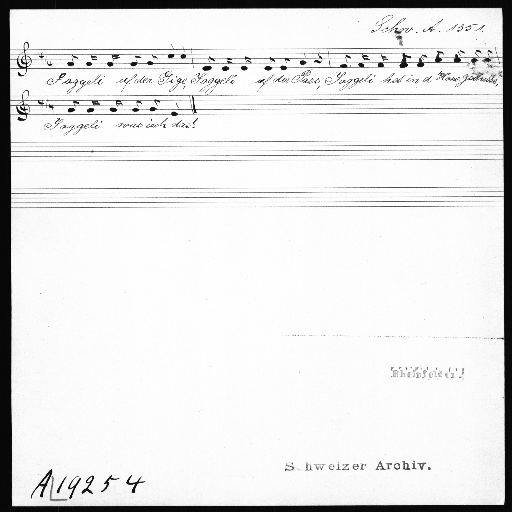

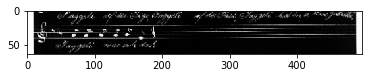

(64, 496)
[273, 897, 1218, 195, 1218, 1052, 1218, 195, 1218, 859, 1218, 1067, 1218, 195, 1218, 472, 1218, 248, 1218]
['**kern', '*clefG2', '4r', '16f#', '4r', '16g', '8gJ', '4r', '=', '*-']


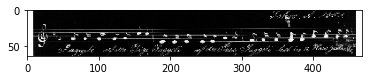

(64, 468)
[273, 897, 1218, 469, 1218, 195, 1218, 109, 1218, 859, 1218, 109, 1218, 912, 1218, 912, 1218, 472, 1218, 137, 1218, 472, 1218, 472, 1218, 137, 1218, 952, 1218, 195, 1218, 469, 1218, 472, 1218, 430, 469, 1218, 568, 1218, 226, 1218, 326, 1218, 503, 1218, 716, 1218, 472, 1218, 248, 1218]
['**kern', '*clefG2', '16b', '4r', '4g', '16g', '4g', '4b', '4b', '=', '(8fL', '=', '=', '(8fL', '4c#', '4r', '16b', '=', '8g', '16b', '8e', '(4f#', '8r', '16eL', '16a#', '=', '*-']


In [46]:
img = load_single_image('/content/drive/MyDrive/Beispiel_Kopie/imgs/00035.jpg')
predict_full_page(img, 64, sae_model, crnn_model, i2w)

In [ ]:
def predict_bb(img):
    print(img[0:0+1].shape)
    predict = sae_model.predict(img[0:1])
    #predict = np.asarray(predict).reshape(1, 512, 512)
    #predict = cvtColor(predict[0],cv2.COLOR_GRAY2RGB)
    #draw(predict[0])
    boundRect = getBoundingBoxesFromPrediction(predict[0])
    for i in boundRect:
      print(i[0])
    cv2_imshow(img[0])
    print(img[0].shape)
    for i in boundRect:
      xmin = i[0]
      ymin = i[1]
      xmax = i[2]
      ymax = i[3]
      predicted_bounding_box = img[0][ymin:ymax][xmin-30:xmax]
      print(predicted_bounding_box.shape)
      draw(predicted_bounding_box)

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(1, 512, 512, 3)


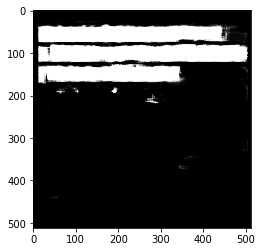

[(132, 33, 163, 327), (85, 41, 116, 500), (41, 17, 72, 439)]
x_start: 132
y_start: 33
x_start: 85
y_start: 41
x_start: 41
y_start: 17
132
85
41


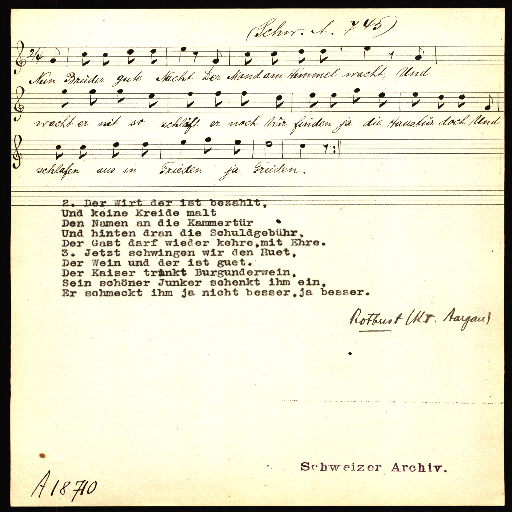

(512, 512, 3)
(51, 512, 3)


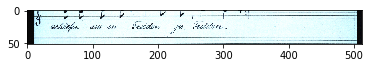

(51, 512, 3)


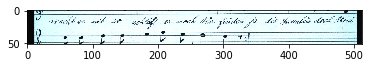

(51, 512, 3)


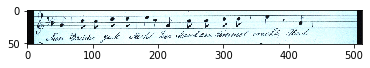

In [ ]:
x = 10
print(type(X_train))
print(type(X_train[x:x+1]))
print(type(X_train[x]))
print(X_train[x:x+1].shape)
predict = sae_model.predict(X_train[x:x+1])
predict = np.asarray(predict).reshape(1, 512, 512)
#predict = cvtColor(predict[0],cv2.COLOR_GRAY2RGB)
draw(predict[0])
boundRect = getBoundingBoxesFromPrediction(predict[0])
for i in boundRect:
  print(i[0])
cv2_imshow(X_train[x])
print(X_train[x].shape)
for i in boundRect:
  xmin = i[0]
  ymin = i[1]
  xmax = i[2]
  ymax = i[3]
  predicted_bounding_box = X_train[x][ymin:ymax][xmin-20:xmax]
  print(predicted_bounding_box.shape)
  draw(predicted_bounding_box)


# Sonstiges

In [ ]:
def train_with_image_generator(w2i, i2w, fixed_height):
    
    primus_path = "/content/corpus_only_img1"
    kern_path = "/content/drive/MyDrive/Bachelorarbeit/Liedblatter_Jorge/primus-kern/primus/primus_kern.json"
    val_size = 0
    create_datalist(primus_path, val_size, kern_path)
    data_list = "/content/train_datalist.txt"

    for super_epoch in range(50):
        print(super_epoch)
        model.train(image_loader(data_list, kern_path, primus_path, 32, fixed_height, w2i, i2w))
        ser, cer = model.evaluate(XVal, YVal, i2w)
        if cer < best_cer:
            best_cer = cer
            model.saveModel(f"e2emodel_{fixed_height}h_{int(ser)}.h5")
            print('CER Improved -> Saving model to {}'.format(f"e2emodel_{fixed_height}h_{int(ser)}.h5"))

def image_loader(data_list, kern_path, primus_path, batch_size, fixed_heigt, w2i, i2w):

    L = len(files)

    #this line is just to make the generator infinite, keras needs that    
    while True:

        batch_start = 0
        batch_end = batch_size

        while batch_start < L:
            limit = min(batch_end, L)
            x = LoadCameraPrimusImagesWithoutFolderStructure(data_list[batch_start:limit], primus_path)
            y = LoadCameraPrimusGT(kern_path, data_list[batch_start:limit])

            for i in range(min(len(x), len(y))):
                print(i)
                img = (255. - x[i]) / 255.
                width = int(float(fixed_height * img.shape[1]) / img.shape[0])
                x[i] = resize(img, (width, fixed_height))
                for idx, symbol in enumerate(y[i]):
                    y[i][idx] = w2i[symbol]
        
            vocabulary_size = len(w2i)

            print("Vocabublary size:", vocabulary_size)

            model = None
            if trainModel == None:
                print("Creating a new CTC model")
                model = E2EModel()
                model.createNewModel((fixed_height, None, 1),vocabulary_size)
            else:
                print("Loading the provided model")
                model = trainModel
            pass

            print("Setup preparation")
            print("Preparation done")
            #print('Training with ' + str(X_train.shape[0]) + ' samples.')


            X_train, Y_train, L_train, T_train = data_preparation_CTC(x, y, fixed_height)

            yield (X_train, Y_train, L_train, T_train) #a tuple with two numpy arrays with batch_size samples     

            batch_start += batch_size   
            batch_end += batch_size


(1, 512, 512, 3)


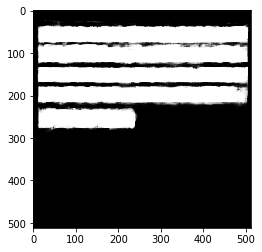

[(238, 17, 271, 223), (183, 15, 214, 471), (137, 15, 168, 501), (85, 15, 121, 487), (40, 16, 74, 501)]
x_start: 238
y_start: 17
x_start: 183
y_start: 15
x_start: 137
y_start: 15
x_start: 85
y_start: 15
x_start: 40
y_start: 16
238
183
137
85
40


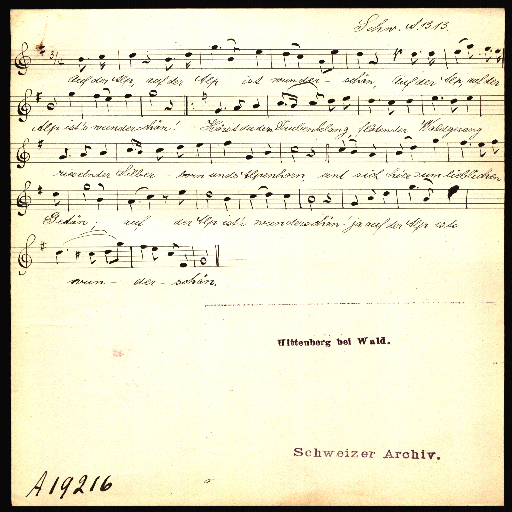

(512, 512, 3)
(0, 512, 3)


ValueError: ignored

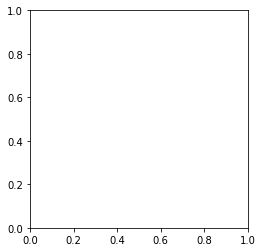

In [ ]:
img = loadSingleImage('/content/drive/MyDrive/Beispiel_Kopie/imgs/00001.jpg')
x = 0
print(img[x:x+1].shape)
predict = sae_model.predict(img[x:x+1])
predict = np.asarray(predict).reshape(1, 512, 512)
#predict = cvtColor(predict[0],cv2.COLOR_GRAY2RGB)
draw(predict[0])
boundRect = getBoundingBoxesFromPrediction(predict[0])
for i in boundRect:
  print(i[x])
cv2_imshow(img[x])
print(img[x].shape)
for i in boundRect:
  xmin = i[0]
  ymin = i[1]
  xmax = i[2]
  ymax = i[3]
  predicted_bounding_box = img[x][ymin:ymax][xmin-30:xmax]
  print(predicted_bounding_box.shape)
  draw(predicted_bounding_box)




  # np.expand_dims(np.expand_dims(X_train[i],axis=0),axis=-1)
  pred = crnn_model.predict((predicted_bounding_box))[0]
  out_best = np.argmax(pred,axis=1)
  out_best = [k for k, g in itertools.groupby(list(out_best))]
  decoded = []
  for c in out_best:
      if c < len(i2w):  # CTC Blank must be ignored
          decoded.append(i2w[c])
  acc_ed_ser = 0
  acc_ed_cer = 0
  acc_len_ser = 0
  acc_len_cer = 0
  #groundtruth = [i2w[label] for label in y_lied_blatter_neu[i]]
  #acc_len_ser += len(y_lied_blatter_neu[i])
  #acc_ed_ser += levenshtein(decoded, groundtruth)

  print(decoded)
  #print(groundtruth)
  #draw(x_lied_blatter_neu[i])